#Hybrid Arima - LSTM code - Full Dataset

The hybrid ARIMA-LSTM model is open to a variety of experimentation. For ideal performance, a balance must be reached between the levels of volatility that work best for the ARIMA and LSTM models. Using shorter MA periods that result in a non-mesokurtic distribution may achieve a better volatility balance between models.

## Import Libraries

In [3]:
import pandas as pd
pd.set_option('display.max_rows', 500)
import timeit


In [4]:
!pip install -q -U keras-tuner

     |████████████████████████████████| 98 kB 3.7 MB/s 


In [5]:
import keras_tuner as kt

In [6]:
!pip install pmdarima

     |████████████████████████████████| 1.4 MB 5.5 MB/s 
     |████████████████████████████████| 9.8 MB 18.2 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


In [7]:
import pmdarima

In [8]:
url = 'https://launchpad.net/~mario-mariomedina/+archive/ubuntu/talib/+files'
!wget $url/libta-lib0_0.4.0-oneiric1_amd64.deb -qO libta.deb
!wget $url/ta-lib0-dev_0.4.0-oneiric1_amd64.deb -qO ta.deb
!dpkg -i libta.deb ta.deb
!pip install ta-lib
import talib

Selecting previously unselected package libta-lib0.
(Reading database ... 155222 files and directories currently installed.)
Preparing to unpack libta.deb ...
Unpacking libta-lib0 (0.4.0-oneiric1) ...
Selecting previously unselected package ta-lib0-dev.
Preparing to unpack ta.deb ...
Unpacking ta-lib0-dev (0.4.0-oneiric1) ...
Setting up libta-lib0 (0.4.0-oneiric1) ...
Setting up ta-lib0-dev (0.4.0-oneiric1) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...
Processing triggers for libc-bin (2.27-3ubuntu1.3) ...
/sbin/ldconfig.real: /usr/local/lib/python3.7/dist-packages/ideep4py/lib/libmkldnn.so.0 is not a symbolic link

     |████████████████████████████████| 268 kB 5.2 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for ta-lib: filename=TA_Lib-0.4.22-cp37-cp37m-linux_x86_64.whl size=1465671 sha256=5fa0cb0c1c150af7279fafd6172de8b7614ce5f4419b22b08548182b0f0230b2
  Stored in direc

In [9]:
import tensorflow
import statsmodels.tsa.api
import keras
import sklearn

In [10]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout, Bidirectional,BatchNormalization, Embedding, TimeDistributed, LeakyReLU, GRU
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

In [11]:
from keras.models import Sequential, load_model
from keras.layers import Dense, LSTM, Activation, Dropout
from keras import backend as K
from keras.utils.generic_utils import get_custom_objects
from keras.callbacks import ModelCheckpoint,EarlyStopping
from keras.regularizers import l1_l2

In [12]:
import math

In [13]:
from statsmodels.tsa.api import VAR
from statsmodels.tsa.statespace.varmax import VARMAX,VARMAXResults

In [14]:
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split


In [15]:
from matplotlib import pyplot


In [16]:
import json
import datetime
import pandas as pd
import numpy as np
import os
from scipy.stats import kurtosis
import pmdarima as pm
from pmdarima import auto_arima
from talib import abstract
import json
import matplotlib.pyplot as plt
# plt.rcParams.update({'font.size': 16})
from matplotlib.pyplot import figure
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed

In [17]:
from keras.utils.generic_utils import get_custom_objects
from tensorflow.keras.utils import plot_model

In [18]:
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)

## Load Data

In [19]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [20]:
cd drive/MyDrive/Stock price prediction/Generated datasets

/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction/Generated datasets


In [68]:
df = pd.read_csv("FULL_Data_google_COVID_bull_bear.csv",parse_dates=[0])
df.tail(10)

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,Date,search,COVID positiveIncrease,COVID deathIncrease,bull score,bear score,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
1592,1592,1781,1781,1781,150.199997,151.429993,150.059998,150.809998,150.809998,56787900.0,150.565717,148.423811,-1.137777,2.817933,154.059677,142.787944,150.767809,5.009368,93.428749,-0.061228,100.779503,-0.039111,103.599003,-0.022436,2021-11-09,19,112313,1258,0.119141,0.111328,NaN,NaN,NaN,NaN
1593,1593,1782,1782,1782,150.020004,150.130005,147.850006,147.919998,147.919998,65187100.0,150.417145,148.729049,-1.236913,2.144358,153.017766,144.440332,148.869268,4.989888,92.922909,-0.061683,99.694365,-0.039762,101.872301,-0.022657,2021-11-10,19,80301,1470,0.154297,0.109375,NaN,NaN,NaN,NaN
1594,1594,1783,1783,1783,148.960007,149.429993,147.679993,147.869995,147.869995,41000000.0,150.110001,149.060477,-1.165047,1.767475,152.595428,145.525526,148.203086,4.989548,92.416471,-0.062129,98.604584,-0.040391,100.137594,-0.022839,2021-11-11,19,94975,1662,0.102845,0.126915,NaN,NaN,NaN,NaN
1595,1595,1784,1784,1784,148.429993,150.399994,147.479996,149.990005,149.990005,63632600.0,149.895715,149.357144,-0.869308,1.420732,152.198608,146.515681,149.394365,5.003879,91.909483,-0.062566,97.510555,-0.040998,98.396260,-0.022980,2021-11-12,19,55499,797,0.157277,0.080595,NaN,NaN,NaN,NaN
1596,1596,1785,1785,1785,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-11-13,19,146529,2505,0.139459,0.083243,NaN,NaN,NaN,NaN
1597,1597,1786,1786,1786,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-11-14,19,40964,479,0.151261,0.100840,NaN,NaN,NaN,NaN
1598,1598,1787,1787,1787,150.369995,151.880005,149.429993,150.000000,150.000000,59222800.0,149.758571,149.602859,-0.907641,1.229694,152.062246,147.143471,149.798122,5.003946,91.401994,-0.062993,96.412672,-0.041581,96.649685,-0.023077,2021-11-15,22,30290,148,0.136737,0.109389,NaN,NaN,NaN,NaN
1599,1599,1788,1788,1788,149.940002,151.490005,149.339996,151.000000,151.000000,59256200.0,149.718571,149.814763,-0.791320,1.236243,152.287250,147.342277,150.599374,5.010635,90.894052,-0.063410,95.311334,-0.042140,94.899260,-0.023130,2021-11-16,22,138962,1294,0.135531,0.115385,NaN,NaN,NaN,NaN
1600,1600,1789,1789,1789,151.000000,155.000000,150.990005,153.490005,153.490005,88807000.0,150.154286,150.040002,-0.657719,1.467121,152.974245,147.105759,152.526461,5.027099,90.385704,-0.063817,94.206941,-0.042673,93.146378,-0.023135,2021-11-17,22,87626,1290,0.100870,0.126957,NaN,NaN,NaN,NaN
1601,1601,1790,1790,1790,153.710007,158.669998,153.050003,157.869995,157.869995,137659100.0,151.162857,150.450002,-0.609656,2.267825,154.985653,145.914351,156.088817,5.055417,89.877000,-0.064214,93.099895,-0.043179,91.392433,-0.023090,2021-11-18,22,111404,1637,0.145098,0.121569,NaN,NaN,NaN,NaN


In [70]:
cd ..

/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction


In [71]:
cd Archana - LSTM Hybrid/Outputs/full

/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction/Archana - LSTM Hybrid/Outputs/full


In [72]:
pd.to_datetime(df[np.isnan(df.Close)==True]['Date']).dt.day_name().head(5)

0    Saturday
1      Sunday
3     Tuesday
7    Saturday
8      Sunday
Name: Date, dtype: object

In [73]:
len(pd.to_datetime(df[np.isnan(df.Close)==True]['Date']).dt.day_name())

497

In [74]:
len(df)

1602

In [75]:
len(df) - len(pd.to_datetime(df[np.isnan(df.Close)==True]['Date']).dt.day_name())

1105

In [76]:
df.dropna(inplace=True)
len(df)

1080

In [77]:
pd.to_datetime(df[np.isnan(df.Close)==True]['Date']).dt.day_name()

Series([], Name: Date, dtype: object)

In [78]:
df.head(5)

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,Date,search,COVID positiveIncrease,COVID deathIncrease,bull score,bear score,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
2,2,191,191,191,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,2017-07-03,15,0,0,0.666667,0.000000,0.142778,0.146810,0.100537,0.099251
4,4,193,193,193,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,2017-07-05,15,0,0,0.400000,0.000000,0.144487,0.145833,0.100630,0.096361
5,5,194,194,194,35.755001,35.875000,35.602501,35.682499,33.872143,96515200.0,35.984999,36.495238,0.346702,0.677629,37.850495,35.139980,35.784949,3.546235,38.027974,0.051918,30.209839,0.095602,43.557403,-0.053820,2017-07-06,15,0,0,0.142857,0.142857,0.145346,0.145164,0.100672,0.094761
6,6,195,195,195,35.724998,36.187500,35.724998,36.044998,34.216255,76806800.0,36.001071,36.362023,0.387422,0.387634,37.137291,35.586756,35.958315,3.556633,37.818962,0.054401,30.470232,0.091907,43.662260,-0.053608,2017-07-07,15,0,0,0.333333,0.000000,0.146208,0.144377,0.100711,0.093072
9,9,198,198,198,36.027500,36.487499,35.842499,36.264999,34.425095,84362400.0,35.973571,36.243809,0.388315,0.308042,36.859893,35.627725,36.162771,3.562891,37.613953,0.056893,30.735430,0.088177,43.752965,-0.053302,2017-07-10,14,0,0,0.000000,0.000000,0.148802,0.141354,0.100808,0.087587


In [79]:
stock_col= list(df.columns)
stock_col = stock_col[4:len(stock_col)]

In [80]:
dataset_final = df[stock_col]

In [81]:
dataset_final.head(5)

,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,Date,search,COVID positiveIncrease,COVID deathIncrease,bull score,bear score,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
2,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,2017-07-03,15,0,0,0.666667,0.000000,0.142778,0.146810,0.100537,0.099251
4,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,2017-07-05,15,0,0,0.400000,0.000000,0.144487,0.145833,0.100630,0.096361
5,35.755001,35.875000,35.602501,35.682499,33.872143,96515200.0,35.984999,36.495238,0.346702,0.677629,37.850495,35.139980,35.784949,3.546235,38.027974,0.051918,30.209839,0.095602,43.557403,-0.053820,2017-07-06,15,0,0,0.142857,0.142857,0.145346,0.145164,0.100672,0.094761
6,35.724998,36.187500,35.724998,36.044998,34.216255,76806800.0,36.001071,36.362023,0.387422,0.387634,37.137291,35.586756,35.958315,3.556633,37.818962,0.054401,30.470232,0.091907,43.662260,-0.053608,2017-07-07,15,0,0,0.333333,0.000000,0.146208,0.144377,0.100711,0.093072
9,36.027500,36.487499,35.842499,36.264999,34.425095,84362400.0,35.973571,36.243809,0.388315,0.308042,36.859893,35.627725,36.162771,3.562891,37.613953,0.056893,30.735430,0.088177,43.752965,-0.053302,2017-07-10,14,0,0,0.000000,0.000000,0.148802,0.141354,0.100808,0.087587


### Data Load for Experiments with Fulldata

In [82]:
# stock_col= list(df.columns)
# stock_col1 = stock_col[4:len(stock_col)-9]
# stock_col2 = stock_col[len(stock_col)-7:len(stock_col)]
# stock_col1.append(stock_col2)
# dataset_final = df
dataset_final.head(5)

,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,Date,search,COVID positiveIncrease,COVID deathIncrease,bull score,bear score,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
2,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,2017-07-03,15,0,0,0.666667,0.000000,0.142778,0.146810,0.100537,0.099251
4,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,2017-07-05,15,0,0,0.400000,0.000000,0.144487,0.145833,0.100630,0.096361
5,35.755001,35.875000,35.602501,35.682499,33.872143,96515200.0,35.984999,36.495238,0.346702,0.677629,37.850495,35.139980,35.784949,3.546235,38.027974,0.051918,30.209839,0.095602,43.557403,-0.053820,2017-07-06,15,0,0,0.142857,0.142857,0.145346,0.145164,0.100672,0.094761
6,35.724998,36.187500,35.724998,36.044998,34.216255,76806800.0,36.001071,36.362023,0.387422,0.387634,37.137291,35.586756,35.958315,3.556633,37.818962,0.054401,30.470232,0.091907,43.662260,-0.053608,2017-07-07,15,0,0,0.333333,0.000000,0.146208,0.144377,0.100711,0.093072
9,36.027500,36.487499,35.842499,36.264999,34.425095,84362400.0,35.973571,36.243809,0.388315,0.308042,36.859893,35.627725,36.162771,3.562891,37.613953,0.056893,30.735430,0.088177,43.752965,-0.053302,2017-07-10,14,0,0,0.000000,0.000000,0.148802,0.141354,0.100808,0.087587


In [83]:
# Set the date to datetime data
datetime_series = pd.to_datetime(dataset_final['Date'])
datetime_index = pd.DatetimeIndex(datetime_series.values)
dataset_final = dataset_final.set_index(datetime_index)
dataset_final = dataset_final.sort_values(by='Date')
dataset_final = dataset_final.drop(columns='Date')
dataset_final.head(5)

,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,search,COVID positiveIncrease,COVID deathIncrease,bull score,bear score,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
2017-07-03,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,15,0,0,0.666667,0.000000,0.142778,0.146810,0.100537,0.099251
2017-07-05,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,15,0,0,0.400000,0.000000,0.144487,0.145833,0.100630,0.096361
2017-07-06,35.755001,35.875000,35.602501,35.682499,33.872143,96515200.0,35.984999,36.495238,0.346702,0.677629,37.850495,35.139980,35.784949,3.546235,38.027974,0.051918,30.209839,0.095602,43.557403,-0.053820,15,0,0,0.142857,0.142857,0.145346,0.145164,0.100672,0.094761
2017-07-07,35.724998,36.187500,35.724998,36.044998,34.216255,76806800.0,36.001071,36.362023,0.387422,0.387634,37.137291,35.586756,35.958315,3.556633,37.818962,0.054401,30.470232,0.091907,43.662260,-0.053608,15,0,0,0.333333,0.000000,0.146208,0.144377,0.100711,0.093072
2017-07-10,36.027500,36.487499,35.842499,36.264999,34.425095,84362400.0,35.973571,36.243809,0.388315,0.308042,36.859893,35.627725,36.162771,3.562891,37.613953,0.056893,30.735430,0.088177,43.752965,-0.053302,14,0,0,0.000000,0.000000,0.148802,0.141354,0.100808,0.087587


### Train & test Dataset for Multistep Process

In [84]:
# Get features and target
X_value = pd.DataFrame(dataset_final.iloc[:, :])
y_value = pd.DataFrame(dataset_final.iloc[:, 3])

In [85]:
y_value.head(5)

,Close
2017-07-03,35.875000
2017-07-05,36.022499
2017-07-06,35.682499
2017-07-07,36.044998
2017-07-10,36.264999


In [86]:
# Normalized the data
X_scaler = MinMaxScaler(feature_range=(-1, 1))
y_scaler = MinMaxScaler(feature_range=(-1, 1))
X_scaler.fit(X_value)
y_scaler.fit(y_value)

MinMaxScaler(feature_range=(-1, 1))

In [87]:
X_scale_dataset = X_scaler.fit_transform(X_value)
y_scale_dataset = y_scaler.fit_transform(y_value)

In [88]:
X_scale_dataset.shape, y_scale_dataset.shape, 

((1080, 29), (1080, 1))

In [89]:
 X_value.shape[1]

29

### N Steps Definition

In [90]:
n_steps_in = 3
n_features = X_value.shape[1] #19 features
n_steps_out = 1


In [91]:
# Reshape the data
'''Set the data input steps and output steps, 
    we use 30 days data to predict 1 day price here, 
    reshape it to (None, input_step, number of features) used for LSTM input'''
# Get X/y dataset
def get_X_y(X_data, y_data):
    X = list()
    y = list()
    yc = list()

    length = len(X_data)
    for i in range(0, length, 1):
        # pdb.set_trace()
        X_value = X_data[i: i + n_steps_in][:, :]
        # print('[',i,': ',i,' + ',n_steps_in,'][:, :]')
        y_value = y_data[i + n_steps_in: i + (n_steps_in + n_steps_out)][:, 0]
        # print('[',i,' + ',n_steps_in,': ',i,' + (',n_steps_in,' + ',n_steps_out,')][:, 0]')
        yc_value = y_data[i: i + n_steps_in][:, :]
        if len(X_value) == 3 and len(y_value) == 1:
            X.append(X_value)
            y.append(y_value)
            yc.append(yc_value)

    return np.array(X), np.array(y), np.array(yc)

In [92]:
# get the train test predict index
def predict_index(dataset, X_train, n_steps_in, n_steps_out):

    # get the predict data (remove the in_steps days)
    train_predict_index = dataset.iloc[n_steps_in : X_train.shape[0] + n_steps_in + n_steps_out - 1, :].index
    test_predict_index = dataset.iloc[X_train.shape[0] + n_steps_in:, :].index

    return train_predict_index, test_predict_index


In [93]:
def mean_absolute_percentage_error(actual, prediction):
    actual = pd.Series(actual)
    prediction = pd.Series(prediction)
    return 100 * np.mean(np.abs((actual - prediction))/actual)

In [94]:
# Split train/test dataset
def split_train_test(data):
    train_size = round(len(X) * 0.75)
    data_train = data[0:train_size]
    data_test = data[train_size:]
    return data_train, data_test

In [95]:
# Get data and check shape
X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
# pdb.set_trace()
X_train, X_test, = split_train_test(X)
y_train, y_test, = split_train_test(y)
yc_train, yc_test, = split_train_test(yc)
index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

In [96]:
# %% --------------------------------------- Save dataset -----------------------------------------------------------------
print('X shape: ', X.shape)
print('y shape: ', y.shape)
print('X_train shape: ', X_train.shape)
print('y_train shape: ', y_train.shape)
print('y_c_train shape: ', yc_train.shape)
print('X_test shape: ', X_test.shape)
print('y_test shape: ', y_test.shape)
print('y_c_test shape: ', yc_test.shape)
print('index_train shape:', index_train.shape)
print('index_test shape:', index_test.shape)


X shape:  (1077, 3, 29)
y shape:  (1077, 1)
X_train shape:  (808, 3, 29)
y_train shape:  (808, 1)
y_c_train shape:  (808, 3, 1)
X_test shape:  (269, 3, 29)
y_test shape:  (269, 1)
y_c_test shape:  (269, 3, 1)
index_train shape: (808,)
index_test shape: (269,)


In [97]:
output_dim = y_train.shape[1]
output_dim

1

In [98]:
df = dataset_final.copy()

In [99]:
df.rename(columns={'Date':'date','Open':'open','Low':'low','Close':'close','Volume':'volume','High':'high'}, inplace = True)
df.reset_index(drop=True,inplace=True)

In [100]:
df.head(1)

,open,high,low,close,Adj Close,volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,search,COVID positiveIncrease,COVID deathIncrease,bull score,bear score,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
0,36.220001,36.325001,35.775002,35.875,34.054882,57111200.0,36.173571,36.751904,0.303356,0.96052,38.672945,34.830864,35.924548,3.55177,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,15,0,0,0.666667,0.0,0.142778,0.14681,0.100537,0.099251


In [101]:
# df.drop(['volume', 'MACD','20SD','logmomentum','absolute of 3 comp','angle of 3 comp','absolute of 6 comp','angle of 6 comp','absolute of 9 comp','angle of 9 comp'], axis='columns', inplace=True) # only keep columns that can help as residuals in Arima Hybrid

In [102]:
df.head(1)

,open,high,low,close,Adj Close,volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,search,COVID positiveIncrease,COVID deathIncrease,bull score,bear score,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
0,36.220001,36.325001,35.775002,35.875,34.054882,57111200.0,36.173571,36.751904,0.303356,0.96052,38.672945,34.830864,35.924548,3.55177,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,15,0,0,0.666667,0.0,0.142778,0.14681,0.100537,0.099251


### Train & Test Length

In [103]:
test_len = len(X_test)

In [104]:
train_len = len(X_train )

In [105]:
test_len, train_len

(269, 808)

## Kurtosis Review

In [106]:
   # Initialize moving averages from Ta-Lib, store functions in dictionary
# talib_moving_averages = ['SMA', 'EMA', 'WMA', 'DEMA', 'KAMA', 'MIDPOINT', 'MIDPRICE', 'T3', 'TEMA', 'TRIMA'] remove midprice due to outputbeing univariate
talib_moving_averages = ['SMA', 'EMA', 'WMA', 'DEMA', 'KAMA', 'MIDPOINT',  'T3', 'TEMA', 'TRIMA'] 
functions = {}
for ma in talib_moving_averages:
      functions[ma] = abstract.Function(ma)

    # Determine kurtosis "K" values for MA period 4-30
kurtosis_results = {'period': []}
for i in range(4, 100): # 100
  kurtosis_results['period'].append(i)
  for ma in talib_moving_averages:
              # Run moving average, remove last N days (used later for test data set), trim MA result to last 30 days
              ma_output = functions[ma](df[:-test_len], i).tail(14)
              # Determine kurtosis "K" value
              k = kurtosis(ma_output, fisher=False)
              # add to dictionary
              if ma not in kurtosis_results.keys():
                  kurtosis_results[ma] = []
              kurtosis_results[ma].append(k)

kurtosis_results = pd.DataFrame(kurtosis_results)
kurtosis_results.to_csv('kurtosis_results.csv')

In [107]:
kurtosis_results.head(5)

,period,SMA,EMA,WMA,DEMA,KAMA,MIDPOINT,T3,TEMA,TRIMA
0,4,2.272452,2.652772,2.896972,3.800351,2.299585,2.171369,1.978458,4.609342,2.411225
1,5,1.839451,2.355815,2.481058,3.327525,1.841282,1.826597,1.640277,4.262302,1.994382
2,6,1.583886,2.159532,2.194320,2.945924,1.536136,1.605787,1.510972,3.878845,1.679710
3,7,1.461290,2.026758,1.990629,2.651927,1.506197,1.558096,1.514015,3.510432,1.486348
4,8,1.447516,1.935302,1.853935,2.429648,1.509566,1.621595,1.601580,3.184123,1.373337


## Optimized periods

In [108]:
# Determine period with K closest to 3 +/-5%
optimized_period = {}
# https://pypi.org/project/TA-Lib/ determines the type of moving average to use
# https://pandas.pydata.org/pandas-docs/version/0.17.0/generated/pandas.DataFrame.at.html#pandas.DataFrame.at
for ma in talib_moving_averages:
        difference = np.abs(kurtosis_results[ma] - 3)
        df_arimahyb = pd.DataFrame({'difference': difference, 'period': kurtosis_results['period']})
        df_arimahyb = df_arimahyb.sort_values(by=['difference'], ascending=True).reset_index(drop=True)
        if df_arimahyb.at[0, 'difference'] < 3 * 0.05:
            optimized_period[ma] = df_arimahyb.at[0, 'period']
        else:
            print(ma + ' is not viable, best K greater or less than 3 +/-5%')

print('\nOptimized periods:', optimized_period)

TRIMA is not viable, best K greater or less than 3 +/-5%

Optimized periods: {'SMA': 17, 'EMA': 51, 'WMA': 49, 'DEMA': 89, 'KAMA': 18, 'MIDPOINT': 14, 'T3': 19, 'TEMA': 9}


In [109]:
optimized_period

{'DEMA': 89,
 'EMA': 51,
 'KAMA': 18,
 'MIDPOINT': 14,
 'SMA': 17,
 'T3': 19,
 'TEMA': 9,
 'WMA': 49}

## Simulation Keys

In [ ]:
simulation = {}
for ma in optimized_period:
        print(ma)
        print(functions[ma])
        print ( int( optimized_period[ma]))
        # if ma in ['EMA','WMA','DEMA','KAMA','MIDPOINT']:
        #   print(ma)
        low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
        low_vol = low_vol.fillna(0)
        high_vol = pd.DataFrame()
        df2 = df.copy()
        for i in df2.columns:
          if i in low_vol.columns:
            high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Pa

In [ ]:
low_vol.tail(20)

,open,high,low,close,Adj Close,volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,search
1060,140.200839,141.942909,138.524500,140.171495,139.966842,8.852448e+07,142.165478,146.699207,1.815578,4.572948,155.845103,137.553312,140.365562,4.935800,105.739092,-0.047411,125.318767,-0.018291,140.471430,-0.008749,19.573385
1061,139.425914,141.705469,138.035200,140.698014,140.492650,8.620711e+07,141.528981,145.978836,2.115887,4.189393,154.357621,137.600050,140.587196,4.939545,105.263514,-0.048037,124.464999,-0.019222,139.335869,-0.009472,19.632022
1062,140.773058,142.636405,139.932338,141.733666,141.526843,7.421445e+07,141.294887,145.298477,2.211018,3.647690,152.593858,138.003097,141.351509,4.946870,104.786174,-0.048658,123.598217,-0.020150,138.164839,-0.010188,19.698090
1063,142.179695,143.266994,141.127848,142.249061,142.041527,6.519616e+07,141.224295,144.665584,2.093072,3.241276,151.148137,138.183031,141.949877,4.950518,104.307114,-0.049275,122.718682,-0.021074,136.959041,-0.010898,19.763505
1064,142.253947,144.008334,141.546689,142.555532,142.347589,6.254214e+07,141.336839,144.184381,1.988881,2.884864,149.954110,138.414652,142.353647,4.952685,103.826381,-0.049886,121.826667,-0.021994,135.719217,-0.011600,20.311676
1065,142.782738,143.732491,141.438660,142.125353,141.918068,6.542511e+07,141.385297,143.758659,1.774804,2.626682,149.012024,138.505294,142.201451,4.949632,103.344020,-0.050491,120.922446,-0.022909,134.446150,-0.012293,20.671514
1066,142.153085,142.656915,140.466684,141.564232,141.357788,7.040262e+07,141.585336,143.387397,1.634667,2.376817,148.141030,138.633764,141.776638,4.945637,102.860075,-0.051092,120.006305,-0.023818,133.140665,-0.012977,20.900131
1067,142.177201,143.194327,140.977156,142.610382,142.402435,6.948112e+07,141.933749,143.094536,1.573317,2.074153,147.242842,138.946230,142.332468,4.953023,102.374593,-0.051687,119.078535,-0.024722,131.803627,-0.013650,21.038585
1068,143.009006,144.052615,142.286776,143.812497,143.602819,6.805244e+07,142.378675,142.879716,1.473333,1.874158,146.628032,139.131400,143.319154,4.961467,101.887619,-0.052275,118.139433,-0.025618,130.435938,-0.014311,21.116168
1069,143.380322,145.547752,142.940349,145.397429,145.185452,7.592729e+07,142.902069,142.813890,1.447641,1.844159,146.502207,139.125573,144.704671,4.972505,101.399198,-0.052858,117.189304,-0.026508,129.038540,-0.014959,21.153587


In [ ]:
high_vol.head(10)

,open,high,low,close,Adj Close,volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,search
0,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,15.0
1,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,15.0
2,35.755001,35.875000,35.602501,35.682499,33.872143,96515200.0,35.984999,36.495238,0.346702,0.677629,37.850495,35.139980,35.784949,3.546235,38.027974,0.051918,30.209839,0.095602,43.557403,-0.053820,15.0
3,35.724998,36.187500,35.724998,36.044998,34.216255,76806800.0,36.001071,36.362023,0.387422,0.387634,37.137291,35.586756,35.958315,3.556633,37.818962,0.054401,30.470232,0.091907,43.662260,-0.053608,15.0
4,36.027500,36.487499,35.842499,36.264999,34.425095,84362400.0,35.973571,36.243809,0.388315,0.308042,36.859893,35.627725,36.162771,3.562891,37.613953,0.056893,30.735430,0.088177,43.752965,-0.053302,14.0
5,36.182499,36.462502,36.095001,36.382500,34.536625,79127200.0,36.039642,36.202738,0.372153,0.308860,36.820458,35.585018,36.309257,3.566217,37.412947,0.059392,31.005161,0.084416,43.829622,-0.052901,14.0
6,36.467499,36.544998,36.205002,36.435001,34.586472,99538000.0,36.101071,36.206547,0.317572,0.295861,36.798268,35.614826,36.393086,3.567700,37.215939,0.061899,31.279154,0.080632,43.892360,-0.052406,14.0
7,36.375000,37.122501,36.360001,36.942501,35.068211,100797600.0,36.253571,36.220595,0.322643,0.340687,36.901969,35.539221,36.759363,3.581920,37.022928,0.064410,31.557136,0.076830,43.941338,-0.051818,14.0
8,36.992500,37.332500,36.832500,37.259998,35.369610,80528400.0,36.430357,36.266785,0.257925,0.410484,37.087753,35.445818,37.093120,3.590715,36.833908,0.066926,31.838833,0.073014,43.976744,-0.051137,14.0
9,37.205002,37.724998,37.142502,37.389999,35.493000,95174000.0,36.674285,36.329523,0.184267,0.445597,37.220717,35.438330,37.291039,3.594294,36.648875,0.069445,32.123972,0.069192,43.998789,-0.050365,16.0


## Common Functions

In [110]:
def get_arima(dataframe,original_data, train_len, test_len):
    # prepare train and test data
    X_value = pd.DataFrame(dataframe.iloc[:, :])
    y_value = pd.DataFrame(dataframe.iloc[:, 3])
    X_train, X_test = split_train_test(X_value)
    y_train, y_test = split_train_test(y_value)
    yc_train,yc_test = split_train_test(original_data)
    # y_train_ = y_train['close'].to_list()
    # y_test_ = y_test['close'].to_list()
    yc = yc_test.values.tolist()
    y_train_list = y_train['close'].values.tolist() 
    y_test_list = y_test['close'].values.tolist()                                           
      
    # Initialize model
    model = auto_arima(y_train_list,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
                  suppress_warnings=True,stepwise=True,seasonal=True)
    print(model.summary())
        # Determine model parameters
    model.fit(y_train_list,disp= 0)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

        # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
            model = pmdarima.ARIMA(order=order)
            model.fit(y_train_list,disp= 0)
            # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')
            prediction.append(model.predict()[0])
            y_train_list.append(y_test_list[i])

    # Generate error data
    mse = mean_squared_error(yc_test, prediction)
    rmse = mse ** 0.5
    # mape = mean_absolute_percentage_error(pd.Series(yc_test).values.tolist(), pd.Series(predictionte).values.tolist() )
    mae = mean_absolute_error(pd.Series(yc_test).values.tolist() , pd.Series(prediction).values.tolist() )
    return yc, prediction, mse, rmse, mae

In [111]:
def plot_train(simulation,SIM):
  train_predict_index = np.load("index_train_appl.npy", allow_pickle=True)#Dates for train data

  predict_result = pd.DataFrame()
  for i in range(len(simulation[SIM]['final_tr']['prediction'])):
          y_predict = pd.DataFrame(simulation[SIM]['final_tr']['prediction'][i], columns=["predicted_price"],
                                  index=train_predict_index[i:i + output_dim])
          predict_result = pd.concat([predict_result, y_predict], axis=1, sort=False)
          
          #This is a dataframe with each column containing the predicted daily closing price
  real_price = pd.DataFrame()
  for i in range(len(simulation[SIM]['final_tr']['original'])):
          y_train = pd.DataFrame(simulation[SIM]['final_tr']['original'][i], columns=["real_price"],
                                index=train_predict_index[i:i + output_dim])
          real_price = pd.concat([real_price, y_train], axis=1, sort=False)  #This is a dataframe with each column containing the real daily closing price

  predict_result['predicted_mean'] = predict_result.mean(axis=1)#Adding a column with the daily predicted closing price value
  real_price['real_mean'] = real_price.mean(axis=1)#Adding a column with the daily real closing price value
      #
      # Plot the predicted result
  plt.figure(figsize=(16, 8))
  plt.plot(real_price["real_mean"])
  plt.plot(predict_result["predicted_mean"], color='r')
  plt.xlabel("Date")
  plt.ylabel("Stock price")
  plt.legend(("Real price", "Predicted price"), loc="upper left", fontsize=16)
  plt.title(f"The result of Training for Hybrid Arima LSTM with MA - {SIM} : {fileimg}",fontsize=20)
  sf = fileimg+'_'+SIM+'Train Hybrid Arima LSTM Pred Out.png'
  plt.savefig(sf,dpi='figure')
  plt.show()

      # Calculate RMSE
  predicted = predict_result["predicted_mean"]
  real = real_price["real_mean"]
  RMSE = np.sqrt(mean_squared_error(predicted, real))
  MSE = mean_squared_error(predicted, real)
  MAE = mean_absolute_error(predicted, real)
  print(f"----- Train RMSE for {SIM} -----", RMSE)
  print(f"----- Train_MSE_LSTM for {SIM} -----", MSE)
  print(f"----- Train MAE LSTM for {SIM} -----", MAE)

In [112]:
def plot_test(simulation, SIM):
  test_predict_index = np.load("index_test_appl.npy", allow_pickle=True)#Dates for train data

      # rescaled_real_y = y_scaler.inverse_transform(y_train)#Real closing price data
      # rescaled_predicted_y = y_scaler.inverse_transform(train_yhat)#Predicted closing price data

  predict_result = pd.DataFrame()
  for i in range(len(simulation[SIM]['final']['prediction'])):
          y_predict = pd.DataFrame(simulation[SIM]['final']['prediction'][i], columns=["predicted_price"],
                                  index=test_predict_index[i:i + output_dim])
          predict_result = pd.concat([predict_result, y_predict], axis=1, sort=False)#This is a dataframe with each column containing the predicted daily closing price
      #
  real_price = pd.DataFrame()
  for i in range(len(simulation[SIM]['final']['original'])):
          y_train = pd.DataFrame(simulation[SIM]['final']['original'][i], columns=["real_price"],
                                index=test_predict_index[i:i + output_dim])
          real_price = pd.concat([real_price, y_train], axis=1, sort=False)#This is a dataframe with each column containing the real daily closing price

  predict_result['predicted_mean'] = predict_result.mean(axis=1)#Adding a column with the daily predicted closing price value
  real_price['real_mean'] = real_price.mean(axis=1)#Adding a column with the daily real closing price value
      #
      # Plot the predicted result
  plt.figure(figsize=(16, 8))
  plt.plot(real_price["real_mean"])
  plt.plot(predict_result["predicted_mean"], color='r')
  plt.xlabel("Date")
  plt.ylabel("Stock price")
  plt.legend(("Real price", "Predicted price"), loc="upper left", fontsize=16)
  plt.title(f"The result of Testing for Hybrid Arima LSTM with MA - {SIM} : {fileimg}",fontsize=20)
  sf = fileimg+'_'+SIM+'Test Hybrid Arima LSTM Pred Out.png'
  plt.savefig(sf,dpi='figure')
  plt.show()

      # Calculate RMSE
  predicted = predict_result["predicted_mean"]
  real = real_price["real_mean"]
  RMSE = np.sqrt(mean_squared_error(predicted, real))
  MSE = mean_squared_error(predicted, real)
  MAE = mean_absolute_error(predicted, real)
  print(f"----- Test RMSE for {SIM}-----", RMSE)
  print(f"----- Test_MSE_LSTM for {SIM}-----", MSE)
  print(f"----- Test_MAE_LSTM for {SIM}-----", MAE)

In [113]:
def plot_train_high(simulation, SIM):
  train_predict_index = np.load("index_test_appl.npy", allow_pickle=True)#Dates for train data

  predict_result = pd.DataFrame()
  for i in range(len(simulation[SIM]['high_vol']['prediction'])):
          y_predict = pd.DataFrame(simulation[SIM]['high_vol']['prediction'][i], columns=["predicted_price"],
                                  index=train_predict_index[i:i + output_dim])
          predict_result = pd.concat([predict_result, y_predict], axis=1, sort=False)
          
          #This is a dataframe with each column containing the predicted daily closing price
  real_price = pd.DataFrame()
  for i in range(len(simulation[SIM]['high_vol']['original'])):
          y_train = pd.DataFrame(simulation[SIM]['high_vol']['original'][i], columns=["real_price"],
                                index=train_predict_index[i:i + output_dim])
          real_price = pd.concat([real_price, y_train], axis=1, sort=False)  #This is a dataframe with each column containing the real daily closing price

  predict_result['predicted_mean'] = predict_result.mean(axis=1)#Adding a column with the daily predicted closing price value
  real_price['real_mean'] = real_price.mean(axis=1)#Adding a column with the daily real closing price value
      #
      # Plot the predicted result
  plt.figure(figsize=(16, 8))
  plt.plot(real_price["real_mean"])
  plt.plot(predict_result["predicted_mean"], color='r')
  plt.xlabel("Date")
  plt.ylabel("Stock price")
  plt.legend(("Real price", "Predicted price"), loc="upper left", fontsize=16)
  plt.title(f"The result of Training for {SIM}", fontsize=20)
  plt.show()

      # Calculate RMSE
  predicted = predict_result["predicted_mean"]
  real = real_price["real_mean"]
  RMSE = np.sqrt(mean_squared_error(predicted, real))
  MSE = mean_squared_error(predicted, real)
  MAE = mean_absolute_error(predicted, real)
  print(f"----- Individual LSTM RMSE for {SIM} -----", RMSE)
  print(f"----- Individual LSTM_MSE_LSTM for {SIM} -----", MSE)
  print(f"----- Individual LSTM MAE LSTM for {SIM} -----", MAE)

In [114]:
def plot_train_low(simulation , SIM):
  train_predict_index = np.load("index_test_appl.npy", allow_pickle=True)#Dates for train data

  predict_result = pd.DataFrame()
  for i in range(len(simulation[SIM]['low_vol']['prediction'])):
          y_predict = pd.DataFrame(simulation[SIM]['low_vol']['prediction'][i], columns=["predicted_price"],
                                  index=train_predict_index[i:i + output_dim])
          predict_result = pd.concat([predict_result, y_predict], axis=1, sort=False)
          
          #This is a dataframe with each column containing the predicted daily closing price
  real_price = pd.DataFrame()
  for i in range(len(simulation[SIM]['low_vol']['original'])):
          y_train = pd.DataFrame(simulation[SIM]['low_vol']['original'][i], columns=["real_price"],
                                index=train_predict_index[i:i + output_dim])
          real_price = pd.concat([real_price, y_train], axis=1, sort=False)  #This is a dataframe with each column containing the real daily closing price

  predict_result['predicted_mean'] = predict_result.mean(axis=1)#Adding a column with the daily predicted closing price value
  real_price['real_mean'] = real_price.mean(axis=1)#Adding a column with the daily real closing price value
      #
      # Plot the predicted result
  plt.figure(figsize=(16, 8))
  plt.plot(real_price["real_mean"])
  plt.plot(predict_result["predicted_mean"], color='r')
  plt.xlabel("Date")
  plt.ylabel("Stock price")
  plt.legend(("Real price", "Predicted price"), loc="upper left", fontsize=16)
  plt.title(f"The result of Training for {SIM}", fontsize=20)
  plt.show()

      # Calculate RMSE
  predicted = predict_result["predicted_mean"]
  real = real_price["real_mean"]
  RMSE = np.sqrt(mean_squared_error(predicted, real))
  MSE = mean_squared_error(predicted, real)
  MAE = mean_absolute_error(predicted, real)
  print(f"-----Arima RMSE for {SIM} -----", RMSE)
  print(f"----- Arima MSE for {SIM} -----", MSE)
  print(f"----- Arima MAE for {SIM} -----", MAE)

In [115]:
import os
os.getcwd()

'/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction/Archana - LSTM Hybrid/Outputs/full'

## Univariate Arima Multistep MutiVariate LSTM Hybrid Model Experiment 1

In [102]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    model = Sequential()
    model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    model.add(Dense(units=64,activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(units=output_dim))
    model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    ## Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()


    # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 3
    # define custom activation
    # cts().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.48 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4157.020, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3687.148, Time=0.05 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3458.651, Time=0.07 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3322.133, Time=0.11 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.74 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.77 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3324.133, Time=0.21 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 2.697 seconds
                               SARIMAX Results                                
Dep.

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.49136, saving model to LSTM1.h5
48/48 - 2s - loss: 0.2128 - val_loss: 0.4914 - lr: 0.0010 - 2s/epoch - 40ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.49136 to 0.03252, saving model to LSTM1.h5
48/48 - 0s - loss: 0.1132 - val_loss: 0.0325 - lr: 0.0010 - 474ms/epoch - 10ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.03252
48/48 - 0s - loss: 0.0752 - val_loss: 0.4517 - lr: 0.0010 - 409ms/epoch - 9ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.03252
48/48 - 0s - loss: 0.0775 - val_loss: 0.1138 - lr: 0.0010 - 405ms/epoch - 8ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.03252
48/48 - 0s - loss: 0.0807 - val_loss: 0.2971 - lr: 0.0010 - 484ms/epoch - 10ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.03252
48/48 - 0s - loss: 0.0607 - val_loss: 0.1280 - lr: 0.0010 - 392ms/epoch - 8ms/step
Epoch 7/500

Epoch 00007: ReduceLROnPlateau reducing learning 

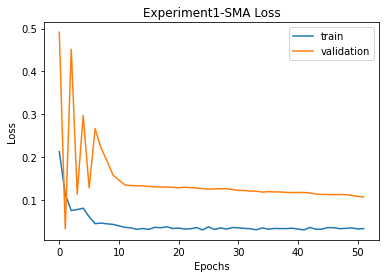


SMA
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 29.509403666146007 
RMSE:	 5.432255854260365 
MAPE:	 4.5288133477558885
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.43 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4231.556, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3761.238, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3532.227, Time=0.08 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3394.496, Time=0.09 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.88 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.64 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3396.496, Time=0

Epoch 1/500

Epoch 00001: val_loss improved from inf to 1.23130, saving model to LSTM1.h5
16/16 - 2s - loss: 0.1617 - val_loss: 1.2313 - lr: 0.0010 - 2s/epoch - 99ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 1.23130 to 0.03856, saving model to LSTM1.h5
16/16 - 0s - loss: 0.0921 - val_loss: 0.0386 - lr: 0.0010 - 176ms/epoch - 11ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.03856
16/16 - 0s - loss: 0.3979 - val_loss: 0.0917 - lr: 0.0010 - 160ms/epoch - 10ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.03856
16/16 - 0s - loss: 0.1546 - val_loss: 0.1976 - lr: 0.0010 - 147ms/epoch - 9ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.03856
16/16 - 0s - loss: 0.0758 - val_loss: 0.1013 - lr: 0.0010 - 143ms/epoch - 9ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.03856
16/16 - 0s - loss: 0.0642 - val_loss: 0.0943 - lr: 0.0010 - 158ms/epoch - 10ms/step
Epoch 7/500

Epoch 00007: ReduceLROnPlateau reducing learning

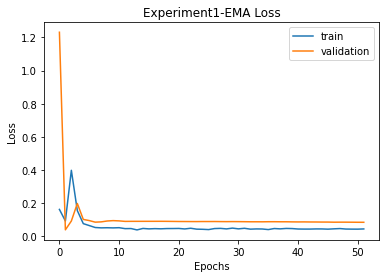


SMA
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 29.509403666146007 
RMSE:	 5.432255854260365 
MAPE:	 4.5288133477558885

EMA
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 28.603272766421263 
RMSE:	 5.348202760406646 
MAPE:	 4.3952252144553965
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.42 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4264.089, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3793.930, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.24 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3564.923, Time=0.07 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3427.258, Time=0.08 sec
 ARIMA(3,3,1)(0,0,0)

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.74867, saving model to LSTM1.h5
17/17 - 2s - loss: 0.4575 - val_loss: 0.7487 - lr: 0.0010 - 2s/epoch - 93ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.74867 to 0.25174, saving model to LSTM1.h5
17/17 - 0s - loss: 0.1118 - val_loss: 0.2517 - lr: 0.0010 - 195ms/epoch - 11ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.25174 to 0.15433, saving model to LSTM1.h5
17/17 - 0s - loss: 0.1083 - val_loss: 0.1543 - lr: 0.0010 - 172ms/epoch - 10ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.15433
17/17 - 0s - loss: 0.1324 - val_loss: 0.1817 - lr: 0.0010 - 162ms/epoch - 10ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.15433 to 0.09425, saving model to LSTM1.h5
17/17 - 0s - loss: 0.0746 - val_loss: 0.0942 - lr: 0.0010 - 174ms/epoch - 10ms/step
Epoch 6/500

Epoch 00006: val_loss improved from 0.09425 to 0.06911, saving model to LSTM1.h5
17/17 - 0s - loss: 0.0537 - val_loss: 0.0691 - lr: 0.

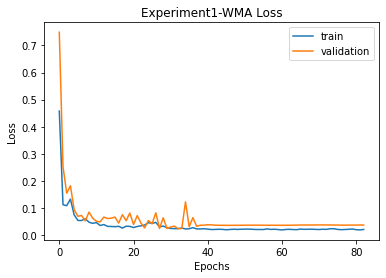


SMA
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 29.509403666146007 
RMSE:	 5.432255854260365 
MAPE:	 4.5288133477558885

EMA
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 28.603272766421263 
RMSE:	 5.348202760406646 
MAPE:	 4.3952252144553965

WMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 80.72598349686672 
RMSE:	 8.9847639644493 
MAPE:	 7.266216353433966
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.42 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4436.126, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3965.317, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.41242, saving model to LSTM1.h5
10/10 - 2s - loss: 0.3561 - val_loss: 0.4124 - lr: 0.0010 - 2s/epoch - 183ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.41242 to 0.05022, saving model to LSTM1.h5
10/10 - 0s - loss: 0.3033 - val_loss: 0.0502 - lr: 0.0010 - 121ms/epoch - 12ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.05022
10/10 - 0s - loss: 0.1002 - val_loss: 0.2789 - lr: 0.0010 - 100ms/epoch - 10ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.05022
10/10 - 0s - loss: 0.0701 - val_loss: 0.3588 - lr: 0.0010 - 110ms/epoch - 11ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.05022
10/10 - 0s - loss: 0.0564 - val_loss: 0.1735 - lr: 0.0010 - 102ms/epoch - 10ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.05022
10/10 - 0s - loss: 0.0572 - val_loss: 0.0565 - lr: 0.0010 - 113ms/epoch - 11ms/step
Epoch 7/500

Epoch 00007: val_loss improved from 0.05022 t

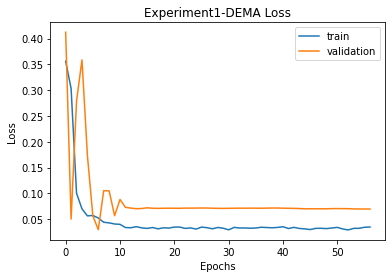


SMA
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 29.509403666146007 
RMSE:	 5.432255854260365 
MAPE:	 4.5288133477558885

EMA
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 28.603272766421263 
RMSE:	 5.348202760406646 
MAPE:	 4.3952252144553965

WMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 80.72598349686672 
RMSE:	 8.9847639644493 
MAPE:	 7.266216353433966

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 74.8946292448382 
RMSE:	 8.654168316183721 
MAPE:	 7.175854729849037
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.35 sec
 ARIMA(0,3,0)(

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.05005, saving model to LSTM1.h5
45/45 - 2s - loss: 0.2498 - val_loss: 0.0501 - lr: 0.0010 - 2s/epoch - 39ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.05005
45/45 - 0s - loss: 0.0990 - val_loss: 0.1124 - lr: 0.0010 - 421ms/epoch - 9ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.05005
45/45 - 1s - loss: 0.0618 - val_loss: 0.7416 - lr: 0.0010 - 527ms/epoch - 12ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.05005
45/45 - 0s - loss: 0.0480 - val_loss: 0.3445 - lr: 0.0010 - 390ms/epoch - 9ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.05005
45/45 - 0s - loss: 0.0459 - val_loss: 0.0789 - lr: 0.0010 - 392ms/epoch - 9ms/step
Epoch 6/500

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 00006: val_loss did not improve from 0.05005
45/45 - 0s - loss: 0.0464 - val_loss: 0.3272 - lr: 0.0010 - 390ms/epoch - 9ms/step
Epoch 7/500

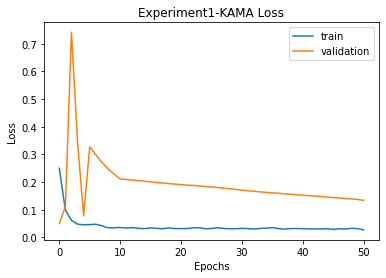


SMA
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 29.509403666146007 
RMSE:	 5.432255854260365 
MAPE:	 4.5288133477558885

EMA
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 28.603272766421263 
RMSE:	 5.348202760406646 
MAPE:	 4.3952252144553965

WMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 80.72598349686672 
RMSE:	 8.9847639644493 
MAPE:	 7.266216353433966

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 74.8946292448382 
RMSE:	 8.654168316183721 
MAPE:	 7.175854729849037

KAMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 23.77011386693893 
RMSE:	 4.87546037487117 
MAPE:	 3.900500517739451
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MIDPO

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.14279, saving model to LSTM1.h5
58/58 - 2s - loss: 0.1302 - val_loss: 0.1428 - lr: 0.0010 - 2s/epoch - 32ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.14279 to 0.01434, saving model to LSTM1.h5
58/58 - 1s - loss: 0.0798 - val_loss: 0.0143 - lr: 0.0010 - 526ms/epoch - 9ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.01434
58/58 - 1s - loss: 0.0806 - val_loss: 0.4012 - lr: 0.0010 - 519ms/epoch - 9ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.01434
58/58 - 0s - loss: 0.0506 - val_loss: 0.1824 - lr: 0.0010 - 496ms/epoch - 9ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.01434
58/58 - 1s - loss: 0.0458 - val_loss: 0.2783 - lr: 0.0010 - 514ms/epoch - 9ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.01434
58/58 - 0s - loss: 0.0477 - val_loss: 0.1316 - lr: 0.0010 - 489ms/epoch - 8ms/step
Epoch 7/500

Epoch 00007: ReduceLROnPlateau reducing learning ra

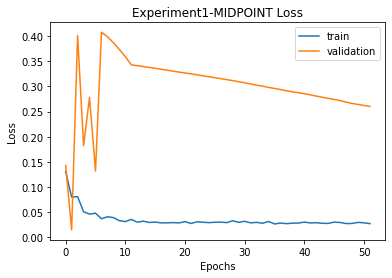


SMA
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 29.509403666146007 
RMSE:	 5.432255854260365 
MAPE:	 4.5288133477558885

EMA
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 28.603272766421263 
RMSE:	 5.348202760406646 
MAPE:	 4.3952252144553965

WMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 80.72598349686672 
RMSE:	 8.9847639644493 
MAPE:	 7.266216353433966

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 74.8946292448382 
RMSE:	 8.654168316183721 
MAPE:	 7.175854729849037

KAMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 23.77011386693893 
RMSE:	 4.87546037487117 
MAPE:	 3.900500517739451

MIDPOINT
Prediction vs Close:		48.88% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 53.557107319764015 
RMSE:	 7.318272153983071 
MAPE:	 6.3365268769325365
T3
T3([input_arrays], [tim

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.38569, saving model to LSTM1.h5
43/43 - 2s - loss: 0.3356 - val_loss: 0.3857 - lr: 0.0010 - 2s/epoch - 50ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.38569 to 0.08604, saving model to LSTM1.h5
43/43 - 0s - loss: 0.1240 - val_loss: 0.0860 - lr: 0.0010 - 374ms/epoch - 9ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.08604
43/43 - 0s - loss: 0.0693 - val_loss: 0.4426 - lr: 0.0010 - 350ms/epoch - 8ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.08604
43/43 - 0s - loss: 0.0472 - val_loss: 0.1786 - lr: 0.0010 - 374ms/epoch - 9ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.08604
43/43 - 0s - loss: 0.0524 - val_loss: 0.1600 - lr: 0.0010 - 366ms/epoch - 9ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.08604
43/43 - 0s - loss: 0.0428 - val_loss: 0.1204 - lr: 0.0010 - 356ms/epoch - 8ms/step
Epoch 7/500

Epoch 00007: ReduceLROnPlateau reducing learning ra

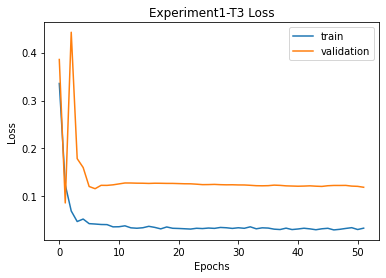


SMA
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 29.509403666146007 
RMSE:	 5.432255854260365 
MAPE:	 4.5288133477558885

EMA
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 28.603272766421263 
RMSE:	 5.348202760406646 
MAPE:	 4.3952252144553965

WMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 80.72598349686672 
RMSE:	 8.9847639644493 
MAPE:	 7.266216353433966

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 74.8946292448382 
RMSE:	 8.654168316183721 
MAPE:	 7.175854729849037

KAMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 23.77011386693893 
RMSE:	 4.87546037487117 
MAPE:	 3.900500517739451

MIDPOINT
Prediction vs Close:		48.88% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 53.557107319764015 
RMSE:	 7.318272153983071 
MAPE:	 6.3365268769325365

T3
Prediction vs Close:		

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.09097, saving model to LSTM1.h5
90/90 - 2s - loss: 0.1656 - val_loss: 0.0910 - lr: 0.0010 - 2s/epoch - 23ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.09097
90/90 - 1s - loss: 0.0915 - val_loss: 0.5898 - lr: 0.0010 - 711ms/epoch - 8ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.09097
90/90 - 1s - loss: 0.0636 - val_loss: 0.1137 - lr: 0.0010 - 679ms/epoch - 8ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.09097
90/90 - 1s - loss: 0.0600 - val_loss: 0.1295 - lr: 0.0010 - 689ms/epoch - 8ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.09097
90/90 - 1s - loss: 0.0556 - val_loss: 0.6111 - lr: 0.0010 - 743ms/epoch - 8ms/step
Epoch 6/500

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 00006: val_loss did not improve from 0.09097
90/90 - 1s - loss: 0.0589 - val_loss: 0.4250 - lr: 0.0010 - 706ms/epoch - 8ms/step
Epoch 7/500


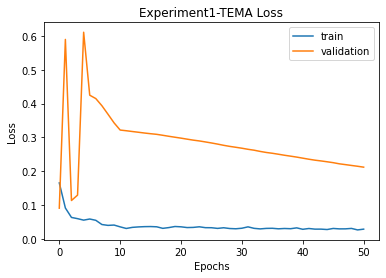


SMA
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 29.509403666146007 
RMSE:	 5.432255854260365 
MAPE:	 4.5288133477558885

EMA
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 28.603272766421263 
RMSE:	 5.348202760406646 
MAPE:	 4.3952252144553965

WMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 80.72598349686672 
RMSE:	 8.9847639644493 
MAPE:	 7.266216353433966

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 74.8946292448382 
RMSE:	 8.654168316183721 
MAPE:	 7.175854729849037

KAMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 23.77011386693893 
RMSE:	 4.87546037487117 
MAPE:	 3.900500517739451

MIDPOINT
Prediction vs Close:		48.88% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 53.557107319764015 
RMSE:	 7.318272153983071 
MAPE:	 6.3365268769325365

T3
Prediction vs Close:		

In [103]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation1 = {}
    imgfile = 'Experiment1'
    for ma in optimized_period:
              print(ma)
              print(functions[ma])
              print ( int( optimized_period[ma]))
            # if ma == 'SMA':
              low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
              low_vol = low_vol.fillna(0)
              low_vol_data = df['close']
              high_vol = pd.DataFrame()
              df2 = df.copy()
              for i in df2.columns:
                if i in low_vol.columns:
                  high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
              high_vol_data = df['close']
              ## *****************************************************
              # Generate ARIMA and LSTM predictions
              print('\nWorking on ' + ma + ' predictions')
              try:
                print('parameters used : ', train_len, test_len)
                low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima(low_vol,low_vol_data, train_len, test_len)
              except:
                  print('ARIMA error, skipping to next MA type')
                  continue
              Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
              final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
              mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
              rmse_ftr = mse_ftr ** 0.5
              mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
              mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

              final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
              mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
              rmse = mse ** 0.5
              mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              # Generate prediction accuracy
              actual = df['close'].tail(test_len).values
              result_1 = []
              result_2 = []
              for i in range(1, len(final_prediction)):
                  # Compare prediction to previous close price
                  if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                      result_1.append(1)
                  elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                      result_1.append(1)
                  else:
                      result_1.append(0)

                  # Compare prediction to previous prediction
                  if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                      result_2.append(1)
                  elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                      result_2.append(1)
                  else:
                      result_2.append(0)

              accuracy_1 = np.mean(result_1)
              accuracy_2 = np.mean(result_2)

              simulation1[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                            'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                            'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                            'rmse': rmse_ftr, 'mae' : mae_ftr},
                                'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                          'rmse': rmse, 'mae': mae },
                                'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

              # save simulation data here as checkpoint
              with open('simulation1_data.json', 'w') as fp:
                  json.dump(simulation1, fp)

              for ma in simulation1.keys():
                  print('\n' + ma)
                  print('Prediction vs Close:\t\t' + str(round(100*simulation1[ma]['accuracy']['prediction vs close'], 2))
                        + '% Accuracy')
                  print('Prediction vs Prediction:\t' + str(round(100*simulation1[ma]['accuracy']['prediction vs prediction'], 2))
                        + '% Accuracy')
                  print('MSE:\t', simulation1[ma]['final']['mse'],
                        '\nRMSE:\t', simulation1[ma]['final']['rmse'],
                        '\nMAPE:\t', simulation1[ma]['final']['mae'])#,
                        # '\nMAPE:\t', simulation[ma]['final']['mape'])
            # else:
            #   break
            # code you want to evaluate
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture used

In [104]:
from google.colab import files
import cv2
uploaded = files.upload()

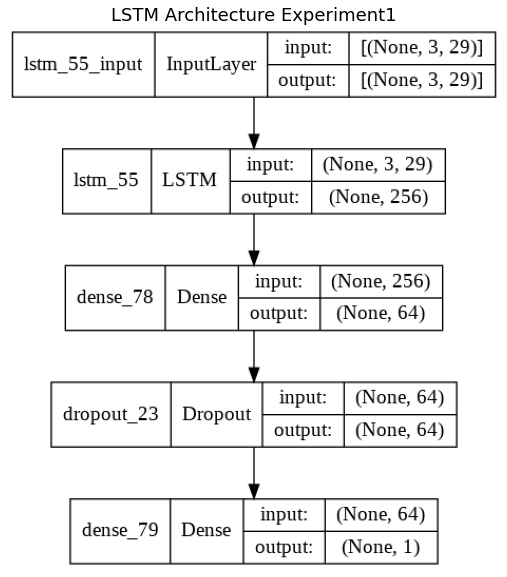

In [105]:
img = cv2.imread('Experiment1.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

Excess kurtosis is a metric that compares the kurtosis of a distribution against the kurtosis of a normal distribution. The kurtosis of a normal distribution equals 3. Therefore, the excess kurtosis is found using the formula below:

Excess Kurtosis = Kurtosis – 3

### Model Plots

In [106]:
np.save("X_train_appl.npy", X_train)
np.save("y_train_appl.npy", y_train)
np.save("X_test_appl.npy", X_test)
np.save("y_test_appl.npy", y_test)
np.save("yc_train_appl.npy", yc_train)
np.save("yc_test_appl.npy", yc_test)
np.save('index_train_appl.npy', index_train)
np.save('index_test_appl.npy', index_test)

In [107]:
list(simulation1.keys())

['SMA', 'EMA', 'WMA', 'DEMA', 'KAMA', 'MIDPOINT', 'T3', 'TEMA']

In [116]:
with open('simulation1_data.json') as json_file:
    simulation1 = json.load(json_file)
fileimg = 'Experiment1'

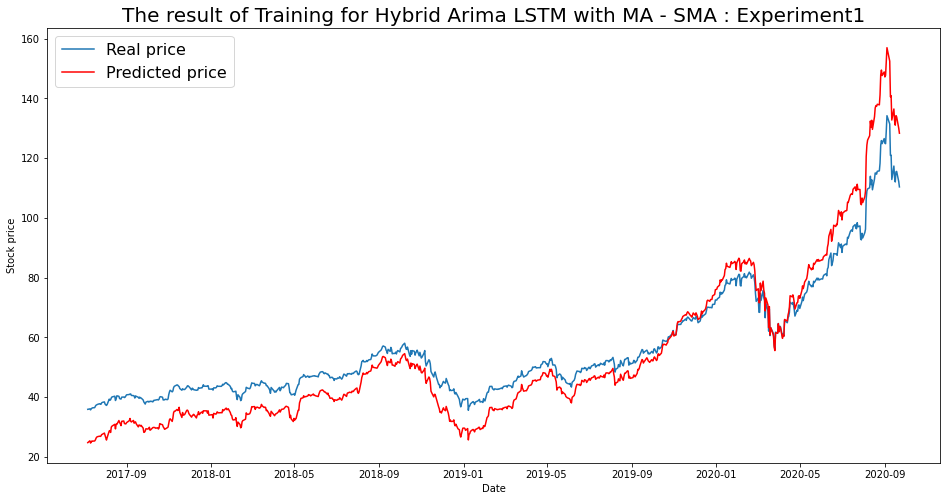

----- Train RMSE for SMA ----- 7.895573621826288
----- Train_MSE_LSTM for SMA ----- 62.34008281767908
----- Train MAE LSTM for SMA ----- 6.764936516294256


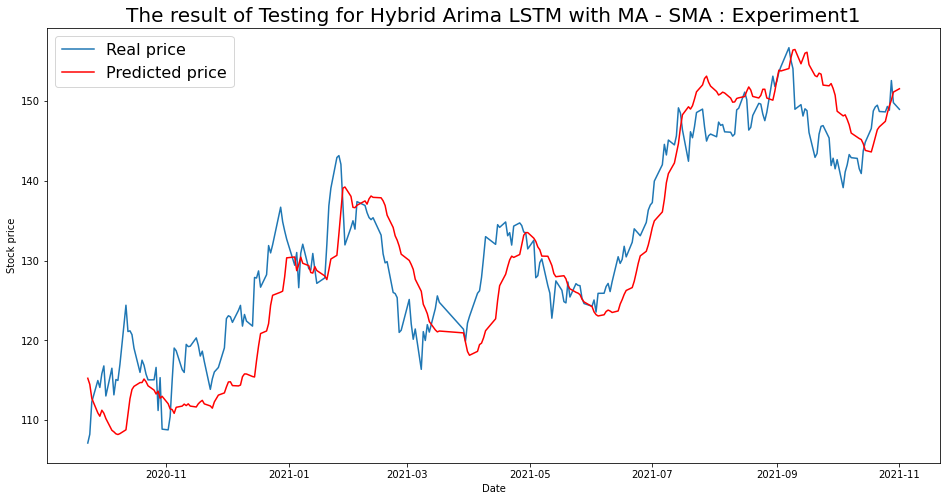

----- Test RMSE for SMA----- 5.432255854260365
----- Test_MSE_LSTM for SMA----- 29.509403666146007
----- Test_MAE_LSTM for SMA----- 4.5288133477558885


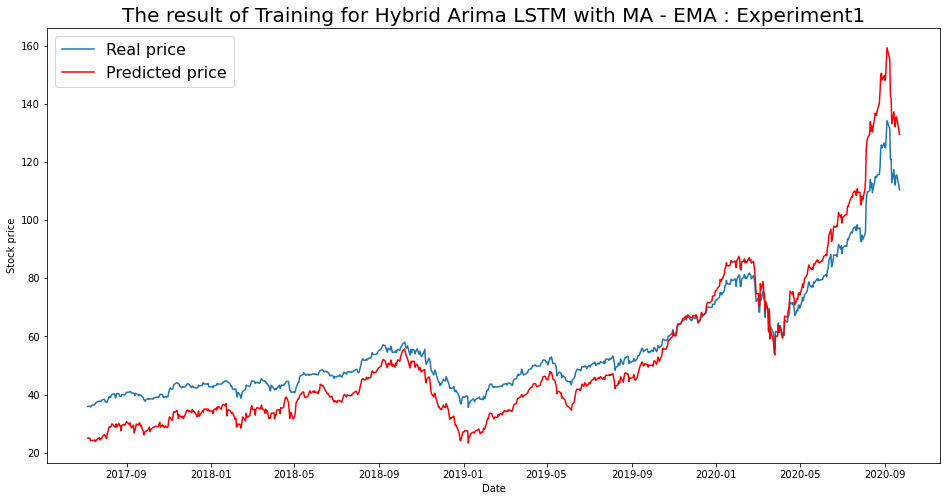

----- Train RMSE for EMA ----- 8.87769382903084
----- Train_MSE_LSTM for EMA ----- 78.81344772201226
----- Train MAE LSTM for EMA ----- 7.790667497096491


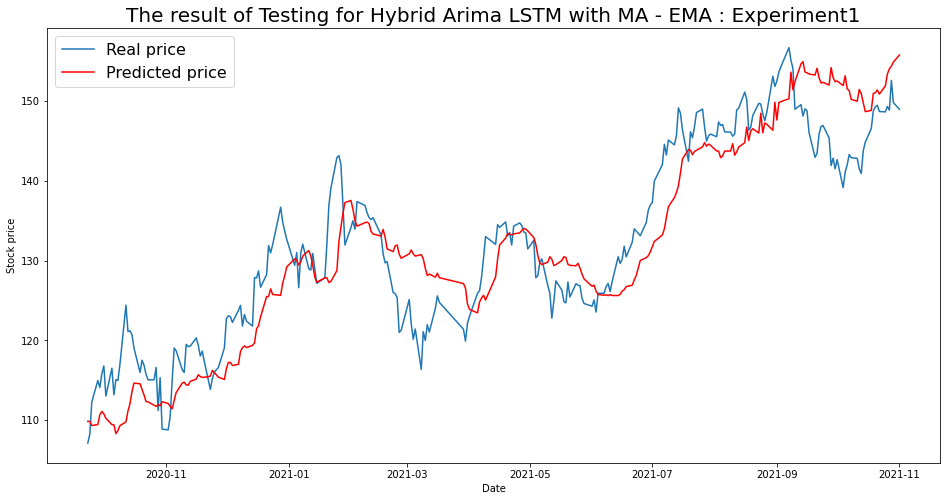

----- Test RMSE for EMA----- 5.348202760406646
----- Test_MSE_LSTM for EMA----- 28.603272766421263
----- Test_MAE_LSTM for EMA----- 4.3952252144553965


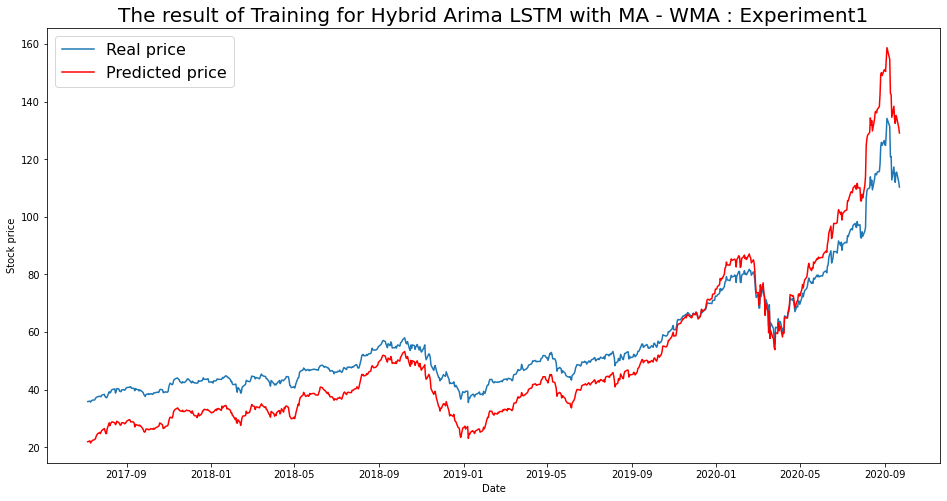

----- Train RMSE for WMA ----- 9.703993025462333
----- Train_MSE_LSTM for WMA ----- 94.16748063822159
----- Train MAE LSTM for WMA ----- 8.628062737580057


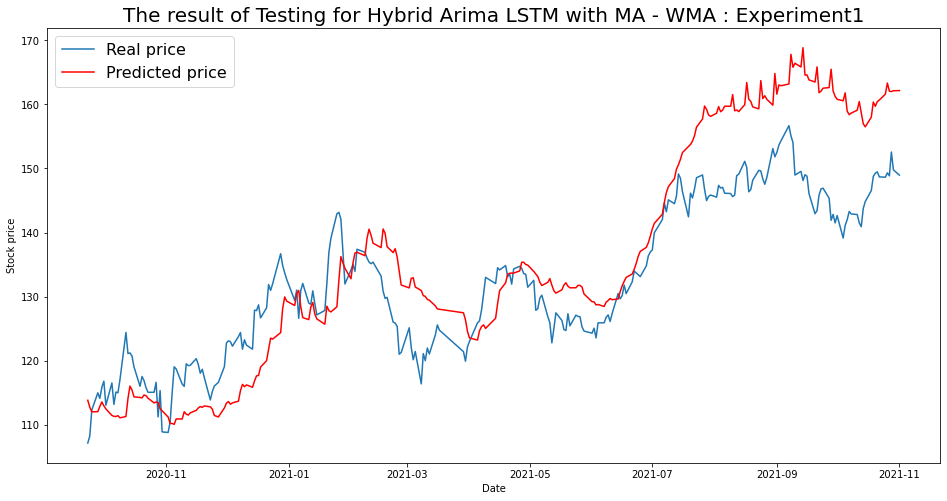

----- Test RMSE for WMA----- 8.9847639644493
----- Test_MSE_LSTM for WMA----- 80.72598349686672
----- Test_MAE_LSTM for WMA----- 7.266216353433966


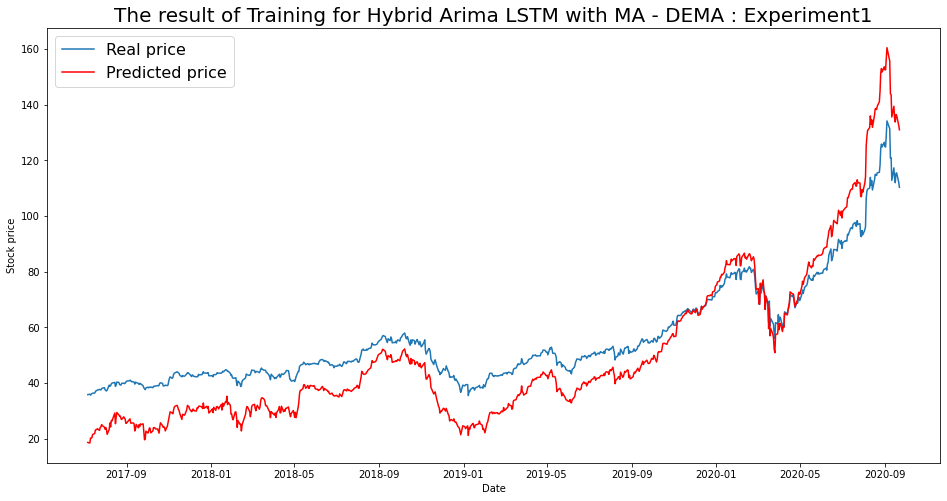

----- Train RMSE for DEMA ----- 11.240117396029953
----- Train_MSE_LSTM for DEMA ----- 126.3402390765352
----- Train MAE LSTM for DEMA ----- 10.016611697382782


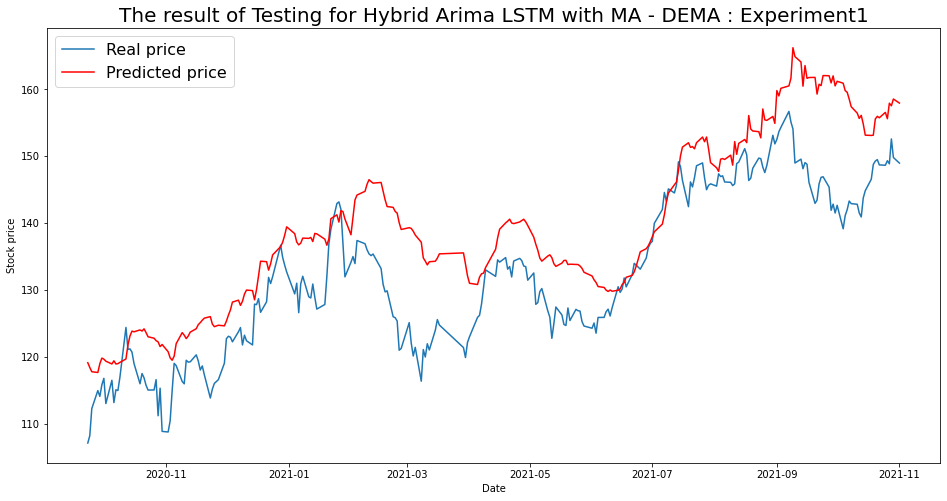

----- Test RMSE for DEMA----- 8.654168316183721
----- Test_MSE_LSTM for DEMA----- 74.8946292448382
----- Test_MAE_LSTM for DEMA----- 7.175854729849037


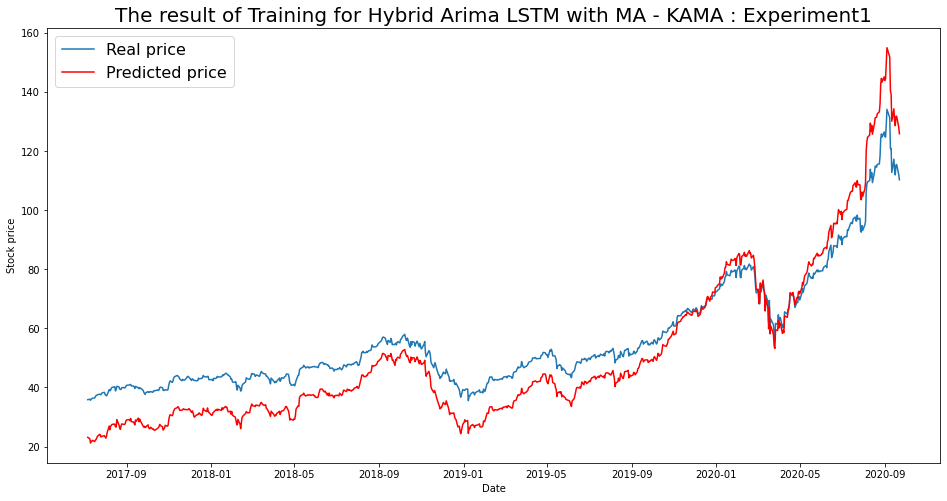

----- Train RMSE for KAMA ----- 9.358621140016876
----- Train_MSE_LSTM for KAMA ----- 87.58378964237077
----- Train MAE LSTM for KAMA ----- 8.463473867850913


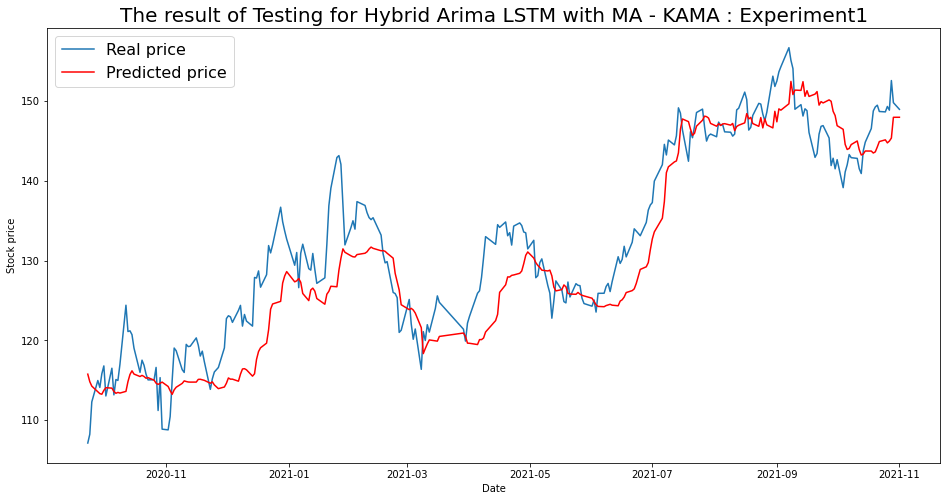

----- Test RMSE for KAMA----- 4.87546037487117
----- Test_MSE_LSTM for KAMA----- 23.77011386693893
----- Test_MAE_LSTM for KAMA----- 3.900500517739451


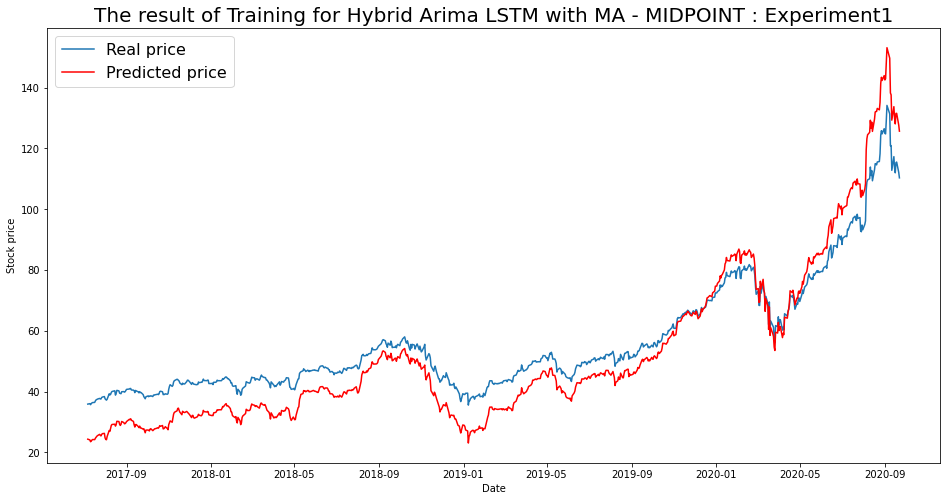

----- Train RMSE for MIDPOINT ----- 8.349312336425948
----- Train_MSE_LSTM for MIDPOINT ----- 69.71101649119451
----- Train MAE LSTM for MIDPOINT ----- 7.472949316300968


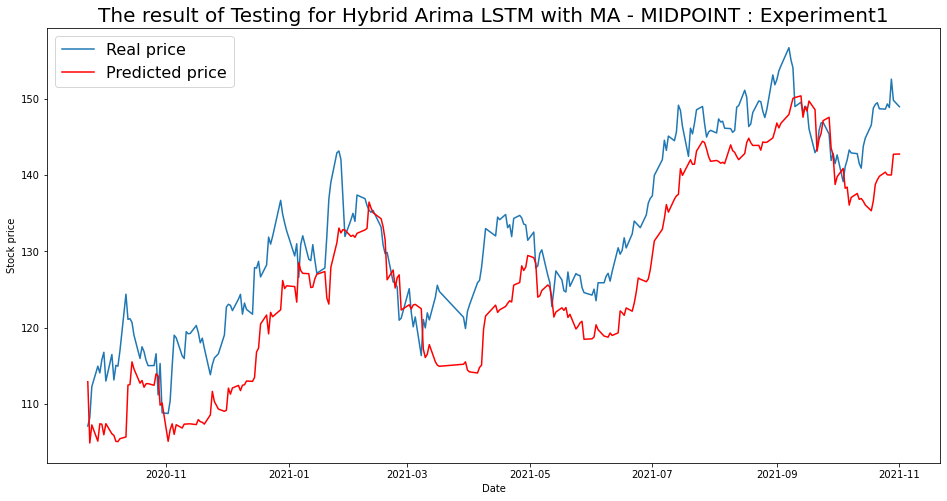

----- Test RMSE for MIDPOINT----- 7.318272153983071
----- Test_MSE_LSTM for MIDPOINT----- 53.557107319764015
----- Test_MAE_LSTM for MIDPOINT----- 6.3365268769325365


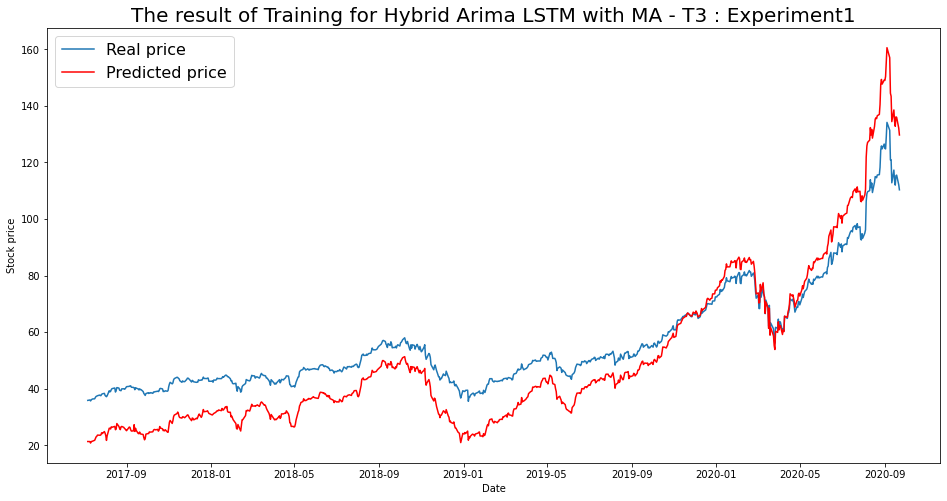

----- Train RMSE for T3 ----- 10.91415603392602
----- Train_MSE_LSTM for T3 ----- 119.11880193288376
----- Train MAE LSTM for T3 ----- 9.801440406699038


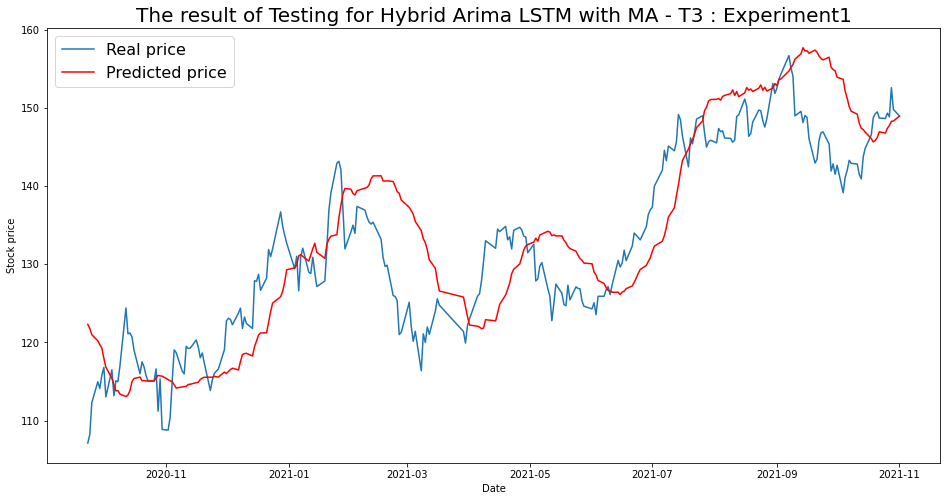

----- Test RMSE for T3----- 6.640488797834165
----- Test_MSE_LSTM for T3----- 44.09609147416104
----- Test_MAE_LSTM for T3----- 5.406095596816415


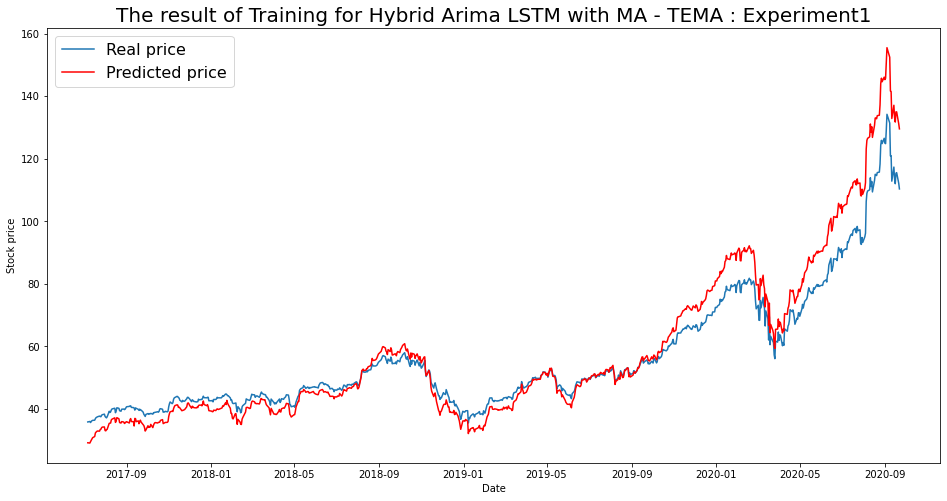

----- Train RMSE for TEMA ----- 6.523327083998898
----- Train_MSE_LSTM for TEMA ----- 42.55379624483356
----- Train MAE LSTM for TEMA ----- 4.644936803645353


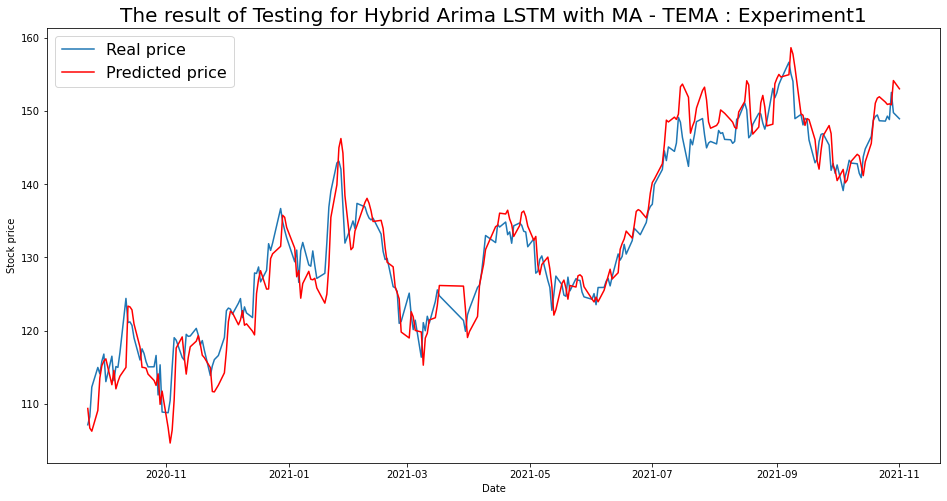

----- Test RMSE for TEMA----- 3.0926372716336124
----- Test_MSE_LSTM for TEMA----- 9.564405293897392
----- Test_MAE_LSTM for TEMA----- 2.44888799215368


In [117]:
for i in range(len(list(simulation1.keys()))):
  SIM = list(simulation1.keys())[i]
  plot_train(simulation1,SIM)
  plot_test(simulation1,SIM)

## Univariate Arima Multistep MutiVariate LSTM Hybrid Model Experiment 2

In [87]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # # Option 1
    # # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # option 2
    model = Sequential()
    model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    model.add(Dense(64))
    model.add(Dense(units=output_dim))
    model.compile(optimizer=Adam(learning_rate = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM2.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()




    # Option 3
    # define custom activation
    # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.49 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4157.020, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3687.148, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.20 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3458.651, Time=0.07 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3322.133, Time=0.09 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.78 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.78 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3324.133, Time=0.23 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 2.721 seconds
                               SARIMAX Results                                
Dep.

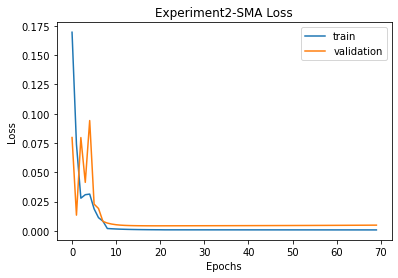


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 75.20110458138421 
RMSE:	 8.67185704341257 
MAPE:	 7.0799160587584336
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.40 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4231.556, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3761.238, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.30 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3532.227, Time=0.07 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3394.496, Time=0.09 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.84 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.62 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3396.496, Time=0.2

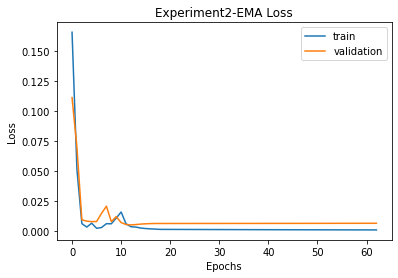


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 75.20110458138421 
RMSE:	 8.67185704341257 
MAPE:	 7.0799160587584336

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 61.82384712230415 
RMSE:	 7.862814198638052 
MAPE:	 6.504666247736678
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.40 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4264.089, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3793.930, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3564.923, Time=0.07 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3427.258, Time=0.08 sec
 ARIMA(3,3,1)(0,0,0)[0] 

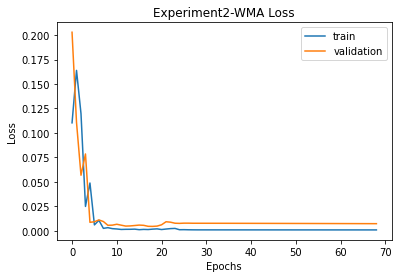


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 75.20110458138421 
RMSE:	 8.67185704341257 
MAPE:	 7.0799160587584336

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 61.82384712230415 
RMSE:	 7.862814198638052 
MAPE:	 6.504666247736678

WMA
Prediction vs Close:		56.34% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 78.06346997131263 
RMSE:	 8.835353415190172 
MAPE:	 6.948265794170055
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.43 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4436.126, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3965.317, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=i

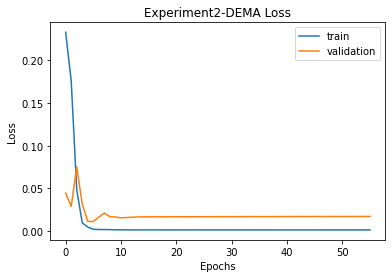


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 75.20110458138421 
RMSE:	 8.67185704341257 
MAPE:	 7.0799160587584336

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 61.82384712230415 
RMSE:	 7.862814198638052 
MAPE:	 6.504666247736678

WMA
Prediction vs Close:		56.34% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 78.06346997131263 
RMSE:	 8.835353415190172 
MAPE:	 6.948265794170055

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 153.59400995187858 
RMSE:	 12.39330504554288 
MAPE:	 11.203775482220726
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.38 sec
 ARIMA(0,3,0)

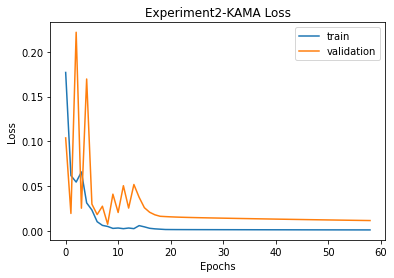


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 75.20110458138421 
RMSE:	 8.67185704341257 
MAPE:	 7.0799160587584336

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 61.82384712230415 
RMSE:	 7.862814198638052 
MAPE:	 6.504666247736678

WMA
Prediction vs Close:		56.34% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 78.06346997131263 
RMSE:	 8.835353415190172 
MAPE:	 6.948265794170055

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 153.59400995187858 
RMSE:	 12.39330504554288 
MAPE:	 11.203775482220726

KAMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 121.28941541171922 
RMSE:	 11.013147388994629 
MAPE:	 9.175643045864026
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on 

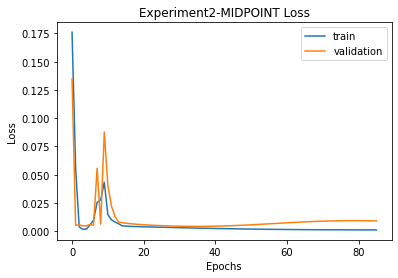


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 75.20110458138421 
RMSE:	 8.67185704341257 
MAPE:	 7.0799160587584336

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 61.82384712230415 
RMSE:	 7.862814198638052 
MAPE:	 6.504666247736678

WMA
Prediction vs Close:		56.34% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 78.06346997131263 
RMSE:	 8.835353415190172 
MAPE:	 6.948265794170055

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 153.59400995187858 
RMSE:	 12.39330504554288 
MAPE:	 11.203775482220726

KAMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 121.28941541171922 
RMSE:	 11.013147388994629 
MAPE:	 9.175643045864026

MIDPOINT
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 110.09412594018622 
RMSE:	 10.492574800314088 
MAPE:	 8.796456301428389
T3
T3([input_arrays],

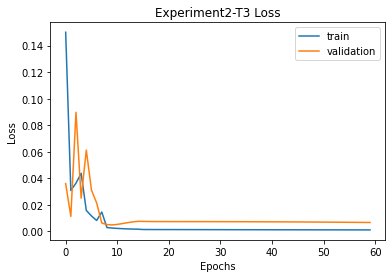


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 75.20110458138421 
RMSE:	 8.67185704341257 
MAPE:	 7.0799160587584336

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 61.82384712230415 
RMSE:	 7.862814198638052 
MAPE:	 6.504666247736678

WMA
Prediction vs Close:		56.34% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 78.06346997131263 
RMSE:	 8.835353415190172 
MAPE:	 6.948265794170055

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 153.59400995187858 
RMSE:	 12.39330504554288 
MAPE:	 11.203775482220726

KAMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 121.28941541171922 
RMSE:	 11.013147388994629 
MAPE:	 9.175643045864026

MIDPOINT
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 110.09412594018622 
RMSE:	 10.492574800314088 
MAPE:	 8.796456301428389

T3
Prediction vs Clo

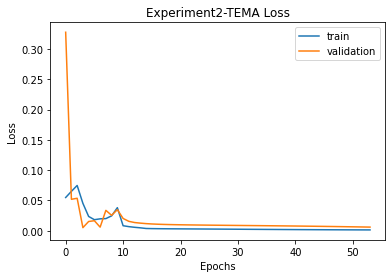


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 75.20110458138421 
RMSE:	 8.67185704341257 
MAPE:	 7.0799160587584336

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 61.82384712230415 
RMSE:	 7.862814198638052 
MAPE:	 6.504666247736678

WMA
Prediction vs Close:		56.34% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 78.06346997131263 
RMSE:	 8.835353415190172 
MAPE:	 6.948265794170055

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 153.59400995187858 
RMSE:	 12.39330504554288 
MAPE:	 11.203775482220726

KAMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 121.28941541171922 
RMSE:	 11.013147388994629 
MAPE:	 9.175643045864026

MIDPOINT
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 110.09412594018622 
RMSE:	 10.492574800314088 
MAPE:	 8.796456301428389

T3
Prediction vs Clo

In [88]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation2 = {}
    imgfile = 'Experiment2'
    for ma in optimized_period:
              print(ma)
              print(functions[ma])
              print ( int( optimized_period[ma]))
            # if ma == 'SMA':
              low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
              low_vol = low_vol.fillna(0)
              low_vol_data = df['close']
              high_vol = pd.DataFrame()
              df2 = df.copy()
              for i in df2.columns:
                if i in low_vol.columns:
                  high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
              high_vol_data = df['close']
              ## *****************************************************
              # Generate ARIMA and LSTM predictions
              print('\nWorking on ' + ma + ' predictions')
              try:
                print('parameters used : ', train_len, test_len)
                low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima(low_vol,low_vol_data, train_len, test_len)
              except:
                  print('ARIMA error, skipping to next MA type')
                  continue
              Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
              final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
              mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
              rmse_ftr = mse_ftr ** 0.5
              mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
              mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

              final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
              mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
              rmse = mse ** 0.5
              mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              # Generate prediction accuracy
              actual = df['close'].tail(test_len).values
              result_1 = []
              result_2 = []
              for i in range(1, len(final_prediction)):
                  # Compare prediction to previous close price
                  if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                      result_1.append(1)
                  elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                      result_1.append(1)
                  else:
                      result_1.append(0)

                  # Compare prediction to previous prediction
                  if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                      result_2.append(1)
                  elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                      result_2.append(1)
                  else:
                      result_2.append(0)

              accuracy_1 = np.mean(result_1)
              accuracy_2 = np.mean(result_2)

              simulation2[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                            'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                            'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                            'rmse': rmse_ftr, 'mae' : mae_ftr},
                                'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                          'rmse': rmse, 'mae': mae },
                                'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

              # save simulation data here as checkpoint
              with open('simulation2_data.json', 'w') as fp:
                  json.dump(simulation2, fp)

              for ma in simulation2.keys():
                  print('\n' + ma)
                  print('Prediction vs Close:\t\t' + str(round(100*simulation2[ma]['accuracy']['prediction vs close'], 2))
                        + '% Accuracy')
                  print('Prediction vs Prediction:\t' + str(round(100*simulation2[ma]['accuracy']['prediction vs prediction'], 2))
                        + '% Accuracy')
                  print('MSE:\t', simulation2[ma]['final']['mse'],
                        '\nRMSE:\t', simulation2[ma]['final']['rmse'],
                        '\nMAPE:\t', simulation2[ma]['final']['mae'])#,
                        # '\nMAPE:\t', simulation[ma]['final']['mape'])
            # else:
            #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [89]:
from google.colab import files
import cv2
uploaded = files.upload()

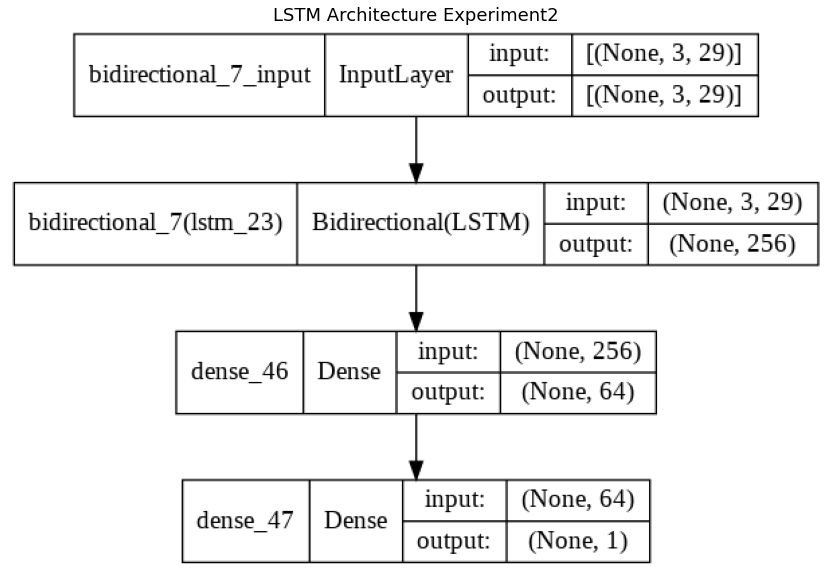

In [90]:
img = cv2.imread('Experiment2.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [118]:
with open('simulation2_data.json') as json_file:
    simulation2 = json.load(json_file)
fileimg = 'Experiment2'

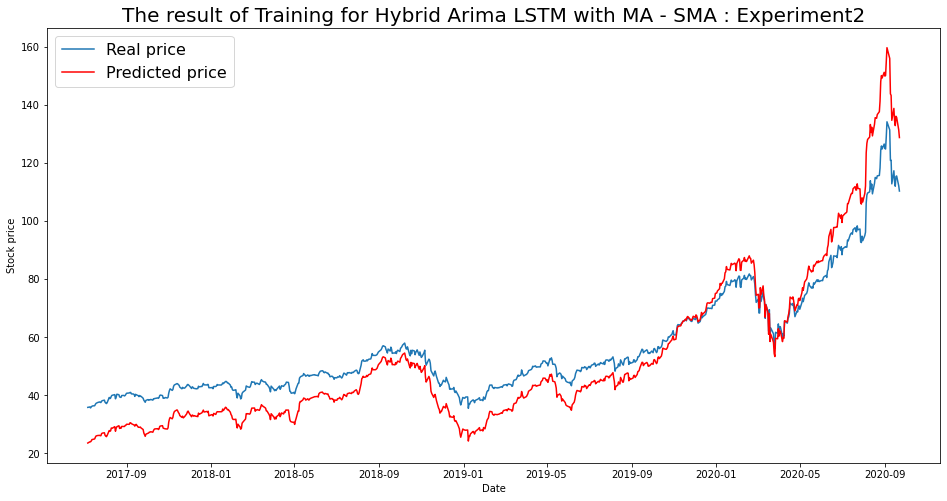

----- Train RMSE for SMA ----- 8.871298903186338
----- Train_MSE_LSTM for SMA ----- 78.69994422967511
----- Train MAE LSTM for SMA ----- 7.764003126570808


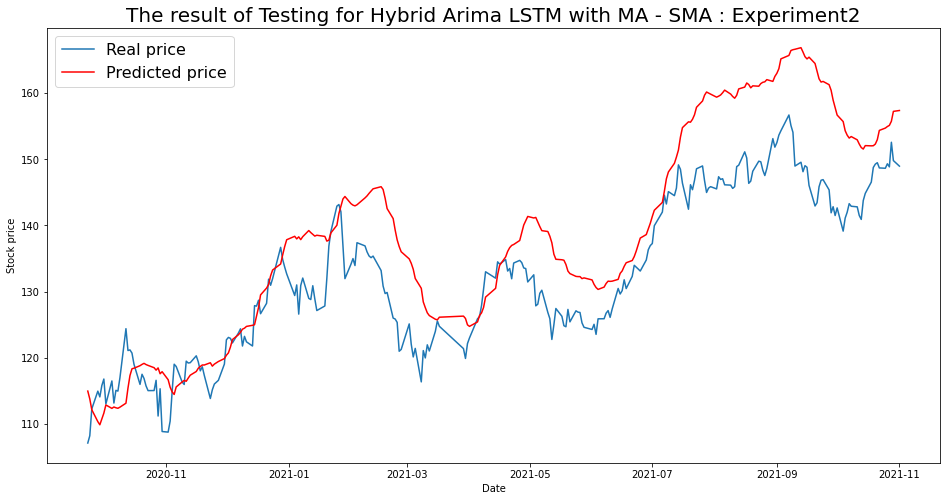

----- Test RMSE for SMA----- 8.67185704341257
----- Test_MSE_LSTM for SMA----- 75.20110458138421
----- Test_MAE_LSTM for SMA----- 7.0799160587584336


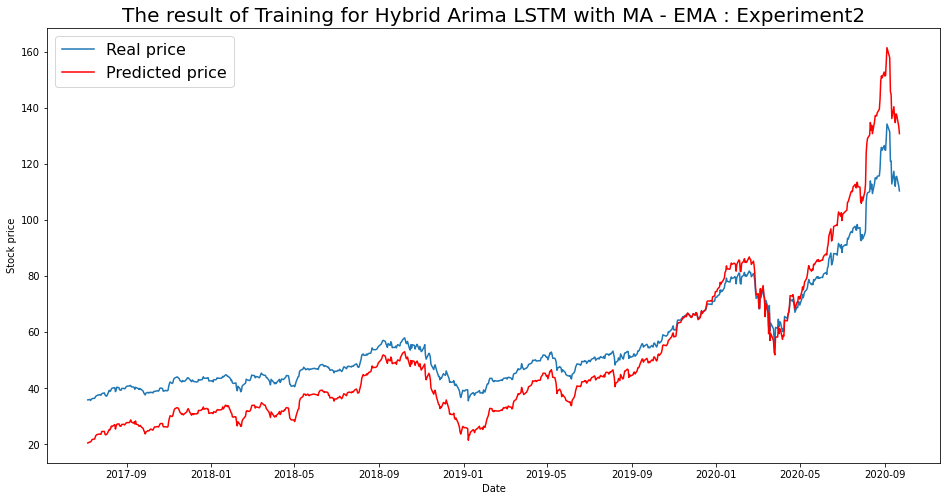

----- Train RMSE for EMA ----- 10.179800509177445
----- Train_MSE_LSTM for EMA ----- 103.62833840664938
----- Train MAE LSTM for EMA ----- 8.952723233047472


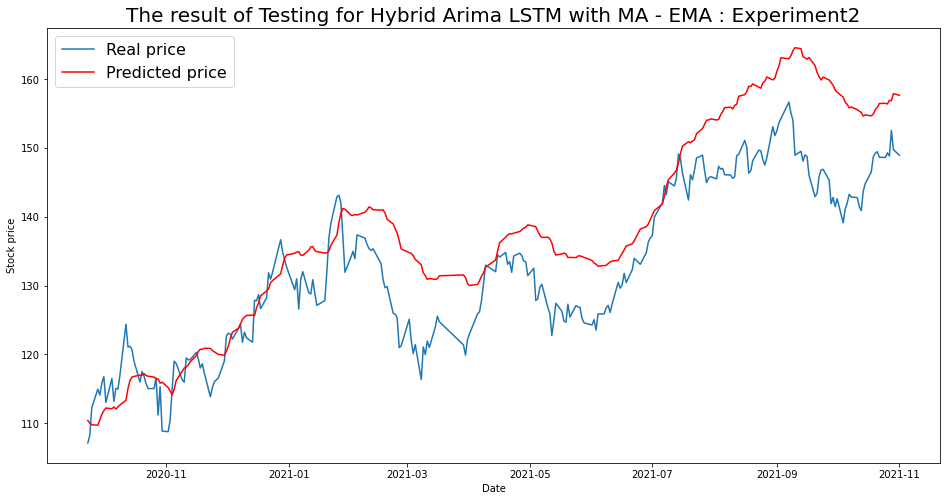

----- Test RMSE for EMA----- 7.862814198638052
----- Test_MSE_LSTM for EMA----- 61.82384712230415
----- Test_MAE_LSTM for EMA----- 6.504666247736678


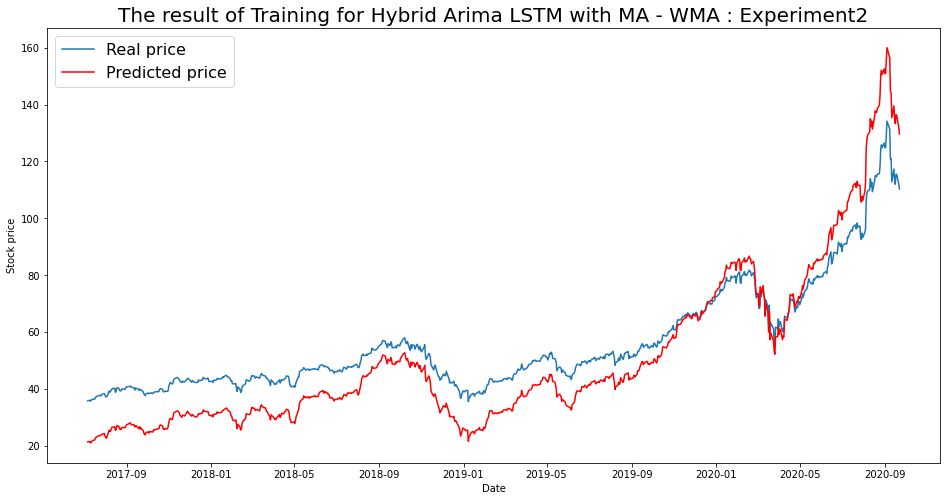

----- Train RMSE for WMA ----- 10.496291718330035
----- Train_MSE_LSTM for WMA ----- 110.17213983628366
----- Train MAE LSTM for WMA ----- 9.343427695739683


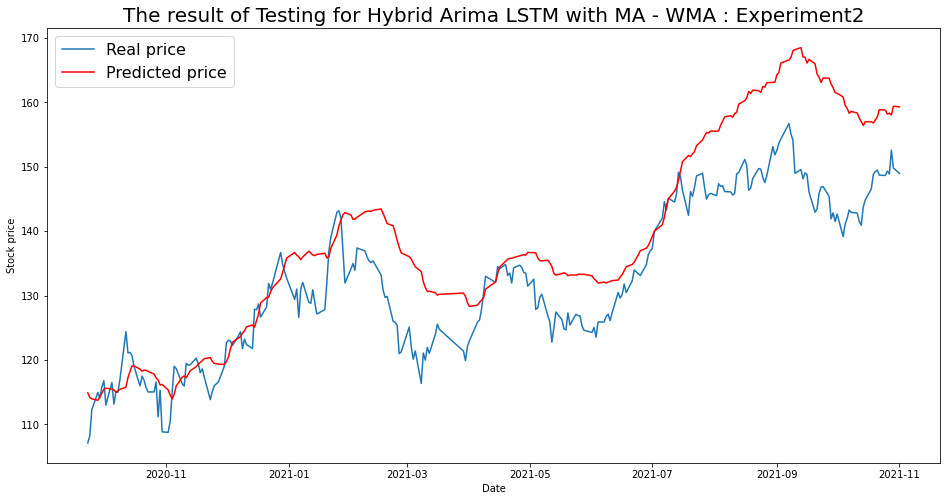

----- Test RMSE for WMA----- 8.835353415190172
----- Test_MSE_LSTM for WMA----- 78.06346997131263
----- Test_MAE_LSTM for WMA----- 6.948265794170055


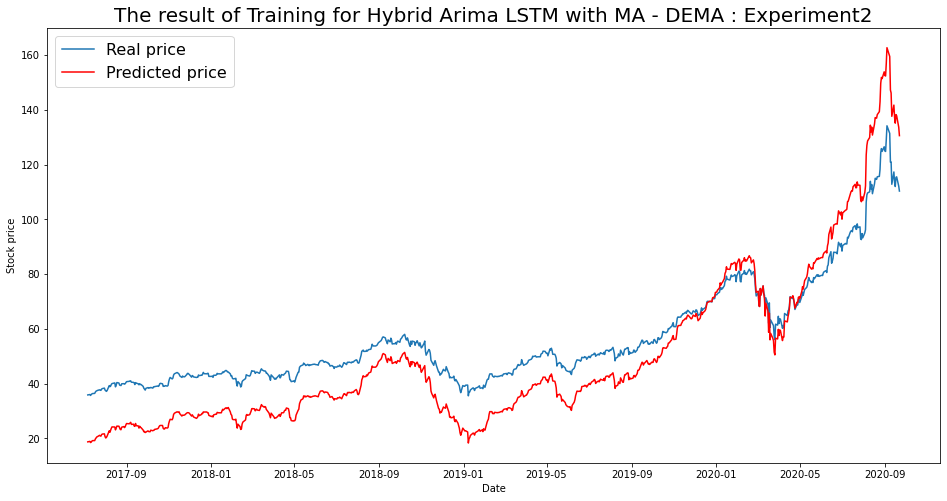

----- Train RMSE for DEMA ----- 12.115569265976841
----- Train_MSE_LSTM for DEMA ----- 146.7870186386826
----- Train MAE LSTM for DEMA ----- 10.916550872639965


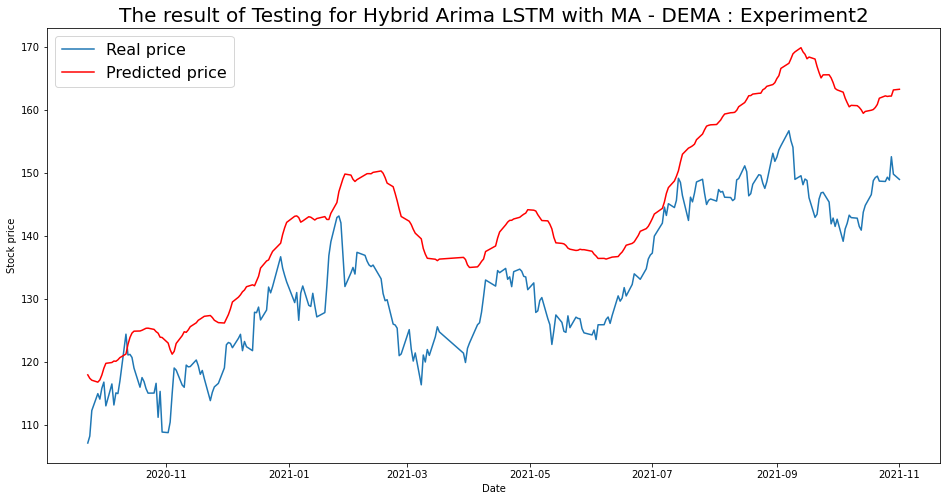

----- Test RMSE for DEMA----- 12.39330504554288
----- Test_MSE_LSTM for DEMA----- 153.59400995187858
----- Test_MAE_LSTM for DEMA----- 11.203775482220726


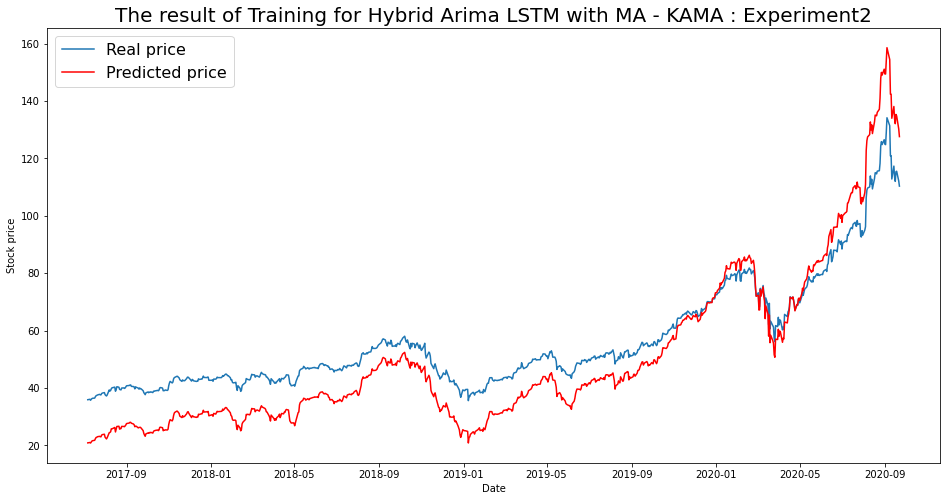

----- Train RMSE for KAMA ----- 10.558696520648454
----- Train_MSE_LSTM for KAMA ----- 111.48607221515375
----- Train MAE LSTM for KAMA ----- 9.496371790900133


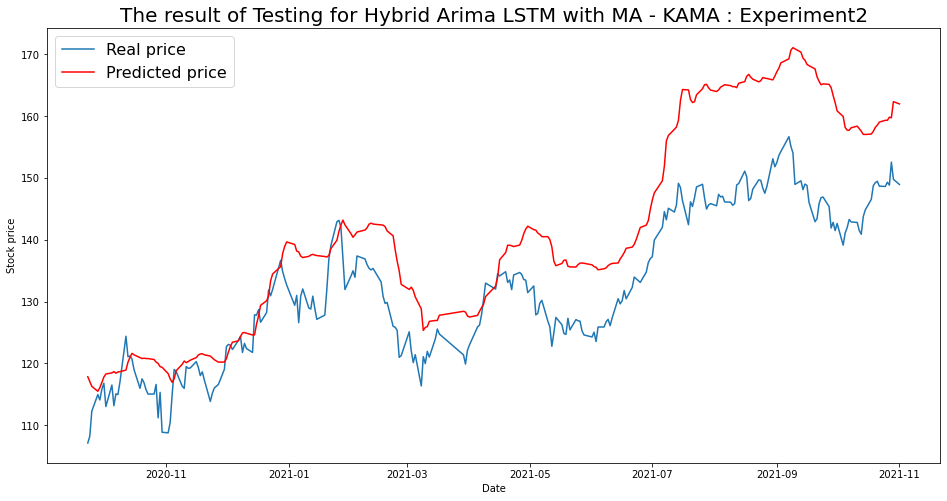

----- Test RMSE for KAMA----- 11.013147388994629
----- Test_MSE_LSTM for KAMA----- 121.28941541171922
----- Test_MAE_LSTM for KAMA----- 9.175643045864026


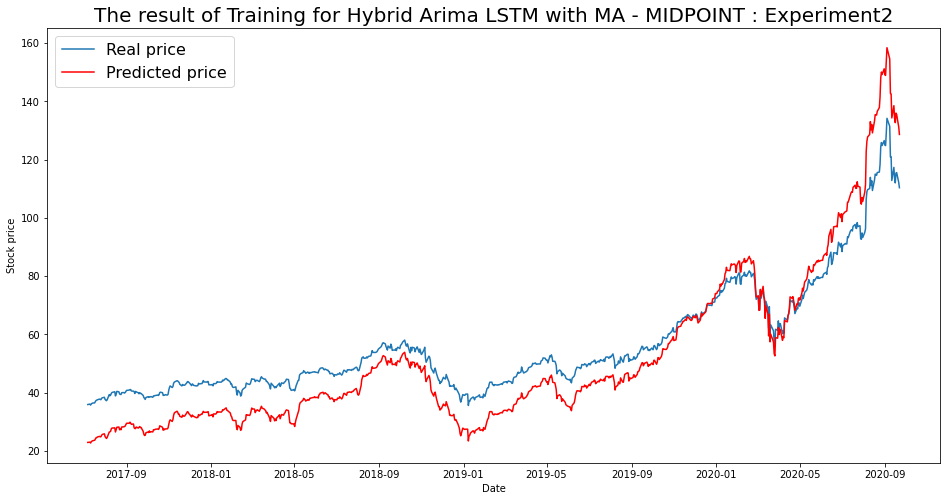

----- Train RMSE for MIDPOINT ----- 9.458884562735138
----- Train_MSE_LSTM for MIDPOINT ----- 89.47049717114909
----- Train MAE LSTM for MIDPOINT ----- 8.375965095480147


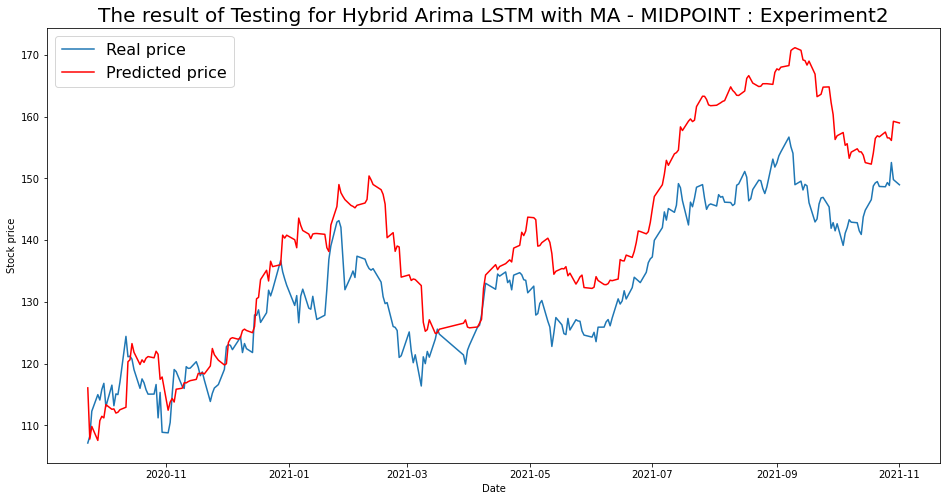

----- Test RMSE for MIDPOINT----- 10.492574800314088
----- Test_MSE_LSTM for MIDPOINT----- 110.09412594018622
----- Test_MAE_LSTM for MIDPOINT----- 8.796456301428389


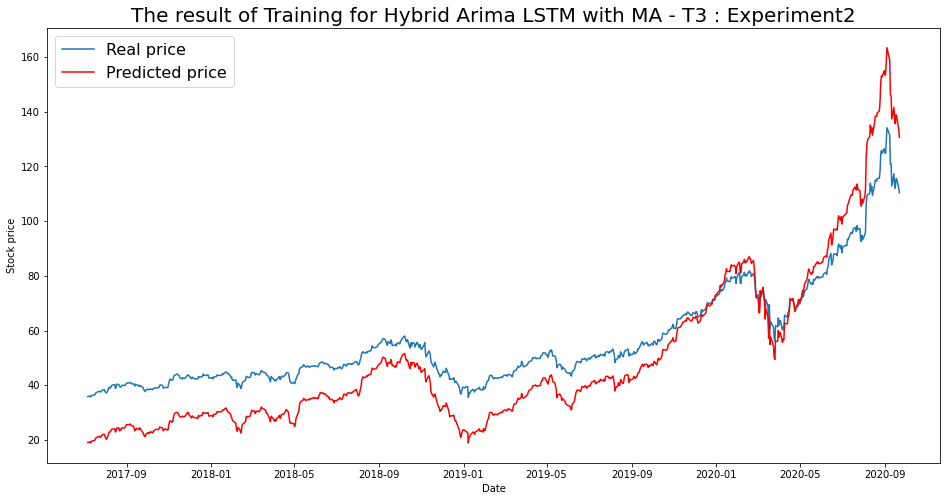

----- Train RMSE for T3 ----- 12.046185882632866
----- Train_MSE_LSTM for T3 ----- 145.11059431894336
----- Train MAE LSTM for T3 ----- 10.824884583380554


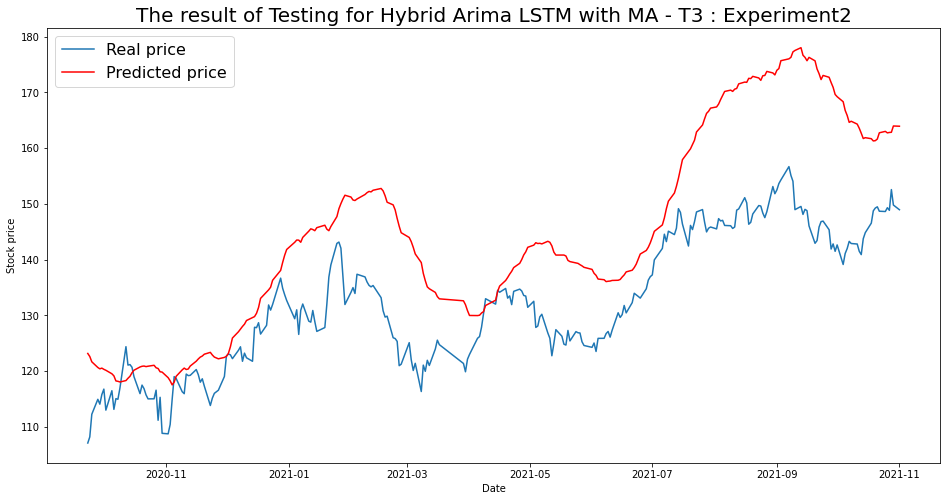

----- Test RMSE for T3----- 15.024615520410403
----- Test_MSE_LSTM for T3----- 225.73907153615718
----- Test_MAE_LSTM for T3----- 12.611725131734374


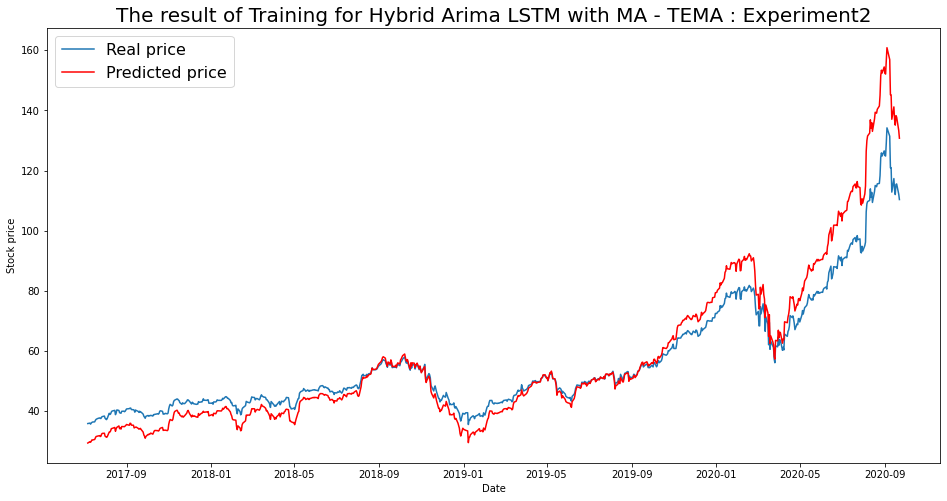

----- Train RMSE for TEMA ----- 7.429673273539691
----- Train_MSE_LSTM for TEMA ----- 55.20004495154998
----- Train MAE LSTM for TEMA ----- 5.060762752805627


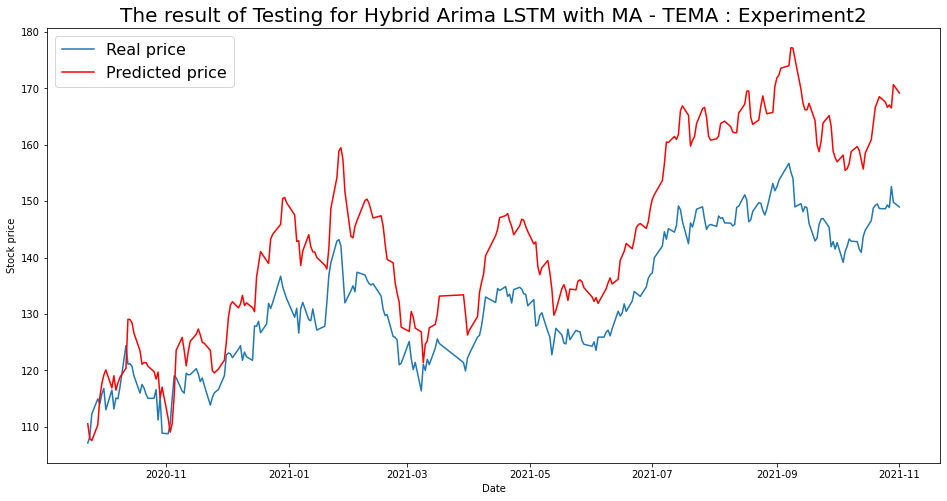

----- Test RMSE for TEMA----- 12.531951213144364
----- Test_MSE_LSTM for TEMA----- 157.04980120863047
----- Test_MAE_LSTM for TEMA----- 11.294114614846999


In [119]:
for i in range(len(list(simulation2.keys()))):
  SIM = list(simulation2.keys())[i]
  plot_train(simulation2,SIM)
  plot_test(simulation2,SIM)

## Univariate Arima Multistep MutiVariate LSTM Hybrid Model Experiment 3

In [92]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # # Option 1
    # # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()




    # Option 3
    # define custom activation
    # 
    class Double_Tanh(Activation):
        def __init__(self, activation, **kwargs):
            super(Double_Tanh, self).__init__(activation, **kwargs)
            self.__name__ = 'double_tanh'

    def double_tanh(x):
        return (K.tanh(x) * 2)

    get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
        # Model Generation
    model = Sequential()
    #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    model.add(Dense(1))
    model.add(Activation(double_tanh))
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM3.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.51 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4157.020, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3687.148, Time=0.05 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.19 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3458.651, Time=0.08 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3322.133, Time=0.09 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.77 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.82 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3324.133, Time=0.22 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 2.752 seconds
                               SARIMAX Results                                
Dep.

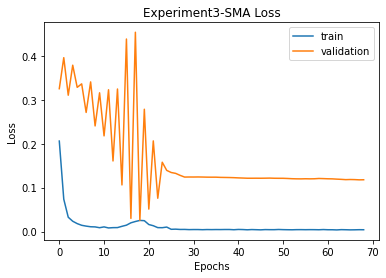


SMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 32.725767438505336 
RMSE:	 5.7206439706125165 
MAPE:	 4.798603095387009
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.41 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4231.556, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3761.238, Time=0.05 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3532.227, Time=0.07 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3394.496, Time=0.09 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.87 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.62 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3396.496, Time=0

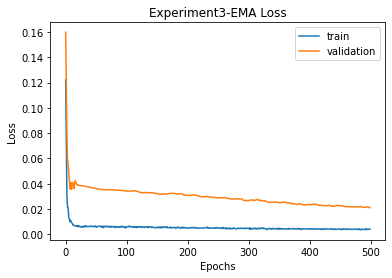


SMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 32.725767438505336 
RMSE:	 5.7206439706125165 
MAPE:	 4.798603095387009

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 143.9522591181831 
RMSE:	 11.998010631691534 
MAPE:	 10.07848404711658
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.40 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4264.089, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3793.930, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.26 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3564.923, Time=0.07 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3427.258, Time=0.08 sec
 ARIMA(3,3,1)(0,0,0)[0

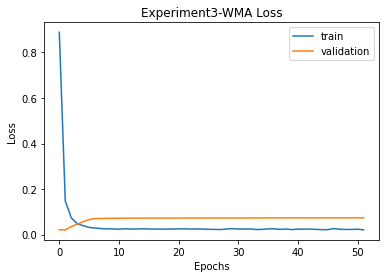


SMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 32.725767438505336 
RMSE:	 5.7206439706125165 
MAPE:	 4.798603095387009

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 143.9522591181831 
RMSE:	 11.998010631691534 
MAPE:	 10.07848404711658

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 24.586224407987817 
RMSE:	 4.958449798877449 
MAPE:	 3.970226889097132
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.42 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4436.126, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3965.317, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AI

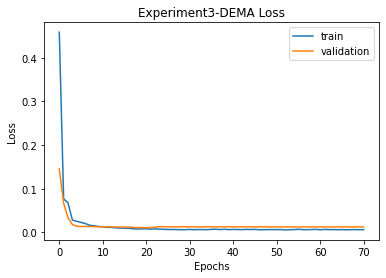


SMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 32.725767438505336 
RMSE:	 5.7206439706125165 
MAPE:	 4.798603095387009

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 143.9522591181831 
RMSE:	 11.998010631691534 
MAPE:	 10.07848404711658

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 24.586224407987817 
RMSE:	 4.958449798877449 
MAPE:	 3.970226889097132

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	51.49% Accuracy
MSE:	 207.2547601932076 
RMSE:	 14.3963453762824 
MAPE:	 12.894635987621164
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(0,3,0

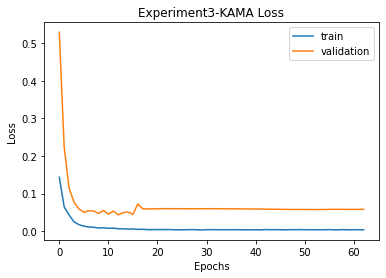


SMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 32.725767438505336 
RMSE:	 5.7206439706125165 
MAPE:	 4.798603095387009

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 143.9522591181831 
RMSE:	 11.998010631691534 
MAPE:	 10.07848404711658

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 24.586224407987817 
RMSE:	 4.958449798877449 
MAPE:	 3.970226889097132

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	51.49% Accuracy
MSE:	 207.2547601932076 
RMSE:	 14.3963453762824 
MAPE:	 12.894635987621164

KAMA
Prediction vs Close:		50.75% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 23.743754657069395 
RMSE:	 4.872756371610364 
MAPE:	 3.7850733762502107
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on 

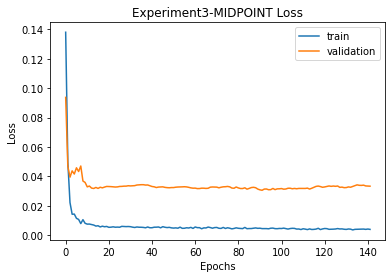


SMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 32.725767438505336 
RMSE:	 5.7206439706125165 
MAPE:	 4.798603095387009

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 143.9522591181831 
RMSE:	 11.998010631691534 
MAPE:	 10.07848404711658

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 24.586224407987817 
RMSE:	 4.958449798877449 
MAPE:	 3.970226889097132

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	51.49% Accuracy
MSE:	 207.2547601932076 
RMSE:	 14.3963453762824 
MAPE:	 12.894635987621164

KAMA
Prediction vs Close:		50.75% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 23.743754657069395 
RMSE:	 4.872756371610364 
MAPE:	 3.7850733762502107

MIDPOINT
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 35.62442093531873 
RMSE:	 5.968619684258559 
MAPE:	 5.0490603478808165
T3
T3([input_arrays], [

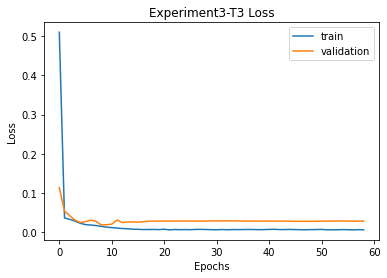


SMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 32.725767438505336 
RMSE:	 5.7206439706125165 
MAPE:	 4.798603095387009

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 143.9522591181831 
RMSE:	 11.998010631691534 
MAPE:	 10.07848404711658

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 24.586224407987817 
RMSE:	 4.958449798877449 
MAPE:	 3.970226889097132

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	51.49% Accuracy
MSE:	 207.2547601932076 
RMSE:	 14.3963453762824 
MAPE:	 12.894635987621164

KAMA
Prediction vs Close:		50.75% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 23.743754657069395 
RMSE:	 4.872756371610364 
MAPE:	 3.7850733762502107

MIDPOINT
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 35.62442093531873 
RMSE:	 5.968619684258559 
MAPE:	 5.0490603478808165

T3
Prediction vs Close

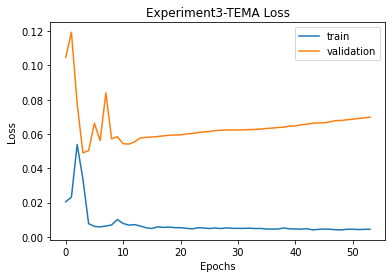


SMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 32.725767438505336 
RMSE:	 5.7206439706125165 
MAPE:	 4.798603095387009

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 143.9522591181831 
RMSE:	 11.998010631691534 
MAPE:	 10.07848404711658

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 24.586224407987817 
RMSE:	 4.958449798877449 
MAPE:	 3.970226889097132

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	51.49% Accuracy
MSE:	 207.2547601932076 
RMSE:	 14.3963453762824 
MAPE:	 12.894635987621164

KAMA
Prediction vs Close:		50.75% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 23.743754657069395 
RMSE:	 4.872756371610364 
MAPE:	 3.7850733762502107

MIDPOINT
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 35.62442093531873 
RMSE:	 5.968619684258559 
MAPE:	 5.0490603478808165

T3
Prediction vs Close

In [93]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation3 = {}
    imgfile = 'Experiment3'
    for ma in optimized_period:
              print(ma)
              print(functions[ma])
              print ( int( optimized_period[ma]))
            # if ma == 'SMA':
              low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
              low_vol = low_vol.fillna(0)
              low_vol_data = df['close']
              high_vol = pd.DataFrame()
              df2 = df.copy()
              for i in df2.columns:
                if i in low_vol.columns:
                  high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
              high_vol_data = df['close']
              ## *****************************************************
              # Generate ARIMA and LSTM predictions
              print('\nWorking on ' + ma + ' predictions')
              try:
                print('parameters used : ', train_len, test_len)
                low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima(low_vol,low_vol_data, train_len, test_len)
              except:
                  print('ARIMA error, skipping to next MA type')
                  continue
              Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
              final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
              mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
              rmse_ftr = mse_ftr ** 0.5
              mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
              mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

              final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
              mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
              rmse = mse ** 0.5
              mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              # Generate prediction accuracy
              actual = df['close'].tail(test_len).values
              result_1 = []
              result_2 = []
              for i in range(1, len(final_prediction)):
                  # Compare prediction to previous close price
                  if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                      result_1.append(1)
                  elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                      result_1.append(1)
                  else:
                      result_1.append(0)

                  # Compare prediction to previous prediction
                  if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                      result_2.append(1)
                  elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                      result_2.append(1)
                  else:
                      result_2.append(0)

              accuracy_1 = np.mean(result_1)
              accuracy_2 = np.mean(result_2)

              simulation3[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                            'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                            'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                            'rmse': rmse_ftr, 'mae' : mae_ftr},
                                'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                          'rmse': rmse, 'mae': mae },
                                'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

              # save simulation data here as checkpoint
              with open('simulation3_data.json', 'w') as fp:
                  json.dump(simulation3, fp)

              for ma in simulation3.keys():
                  print('\n' + ma)
                  print('Prediction vs Close:\t\t' + str(round(100*simulation3[ma]['accuracy']['prediction vs close'], 2))
                        + '% Accuracy')
                  print('Prediction vs Prediction:\t' + str(round(100*simulation3[ma]['accuracy']['prediction vs prediction'], 2))
                        + '% Accuracy')
                  print('MSE:\t', simulation3[ma]['final']['mse'],
                        '\nRMSE:\t', simulation3[ma]['final']['rmse'],
                        '\nMAPE:\t', simulation3[ma]['final']['mae'])#,
                        # '\nMAPE:\t', simulation[ma]['final']['mape'])
            # else:
            #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [94]:
from google.colab import files
import cv2
uploaded = files.upload()

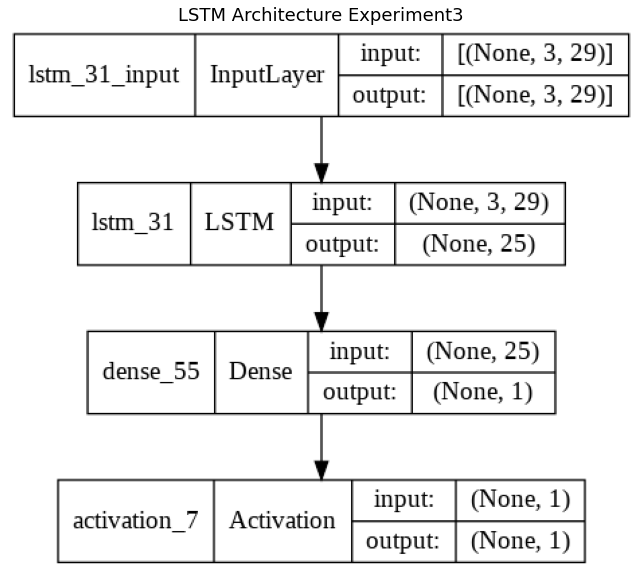

In [95]:
img = cv2.imread('Experiment3.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [120]:
with open('simulation3_data.json') as json_file:
    simulation3 = json.load(json_file)
fileimg = 'Experiment3'

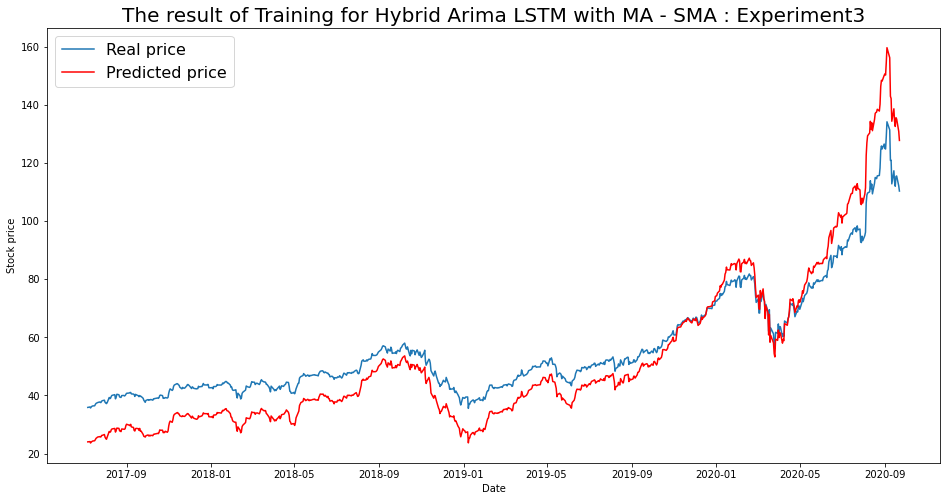

----- Train RMSE for SMA ----- 9.155996008701845
----- Train_MSE_LSTM for SMA ----- 83.8322629113641
----- Train MAE LSTM for SMA ----- 8.009066904332526


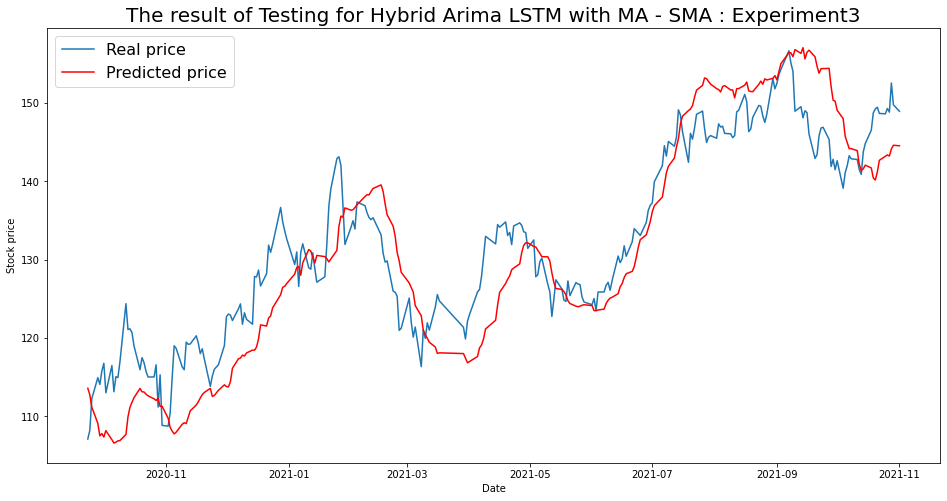

----- Test RMSE for SMA----- 5.7206439706125165
----- Test_MSE_LSTM for SMA----- 32.725767438505336
----- Test_MAE_LSTM for SMA----- 4.798603095387009


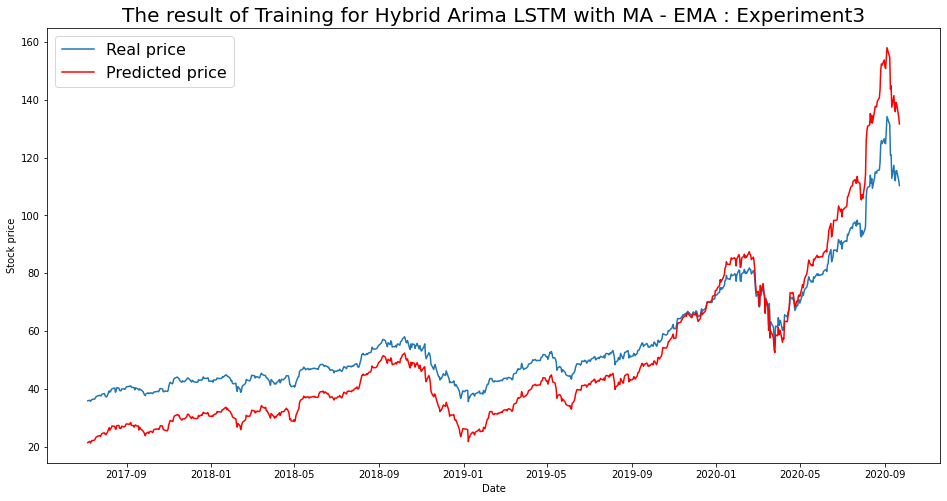

----- Train RMSE for EMA ----- 10.577937809273275
----- Train_MSE_LSTM for EMA ----- 111.89276829685309
----- Train MAE LSTM for EMA ----- 9.432194934544697


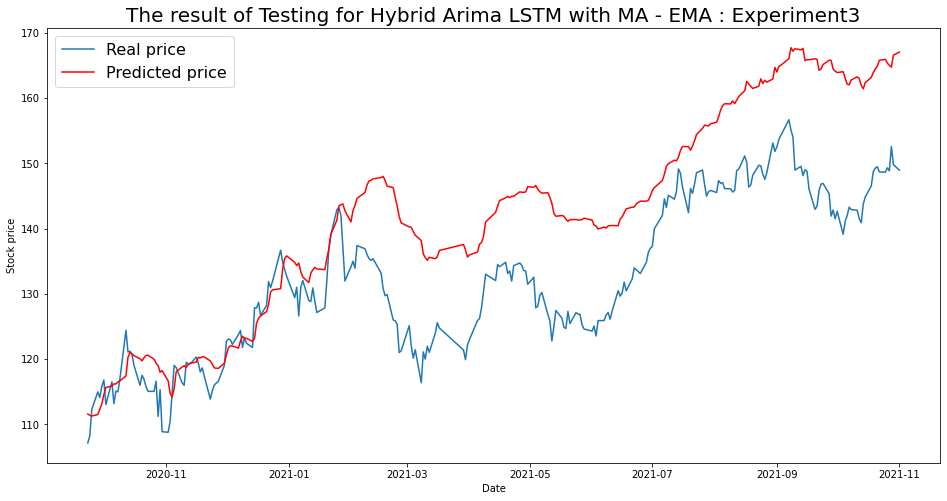

----- Test RMSE for EMA----- 11.998010631691534
----- Test_MSE_LSTM for EMA----- 143.9522591181831
----- Test_MAE_LSTM for EMA----- 10.07848404711658


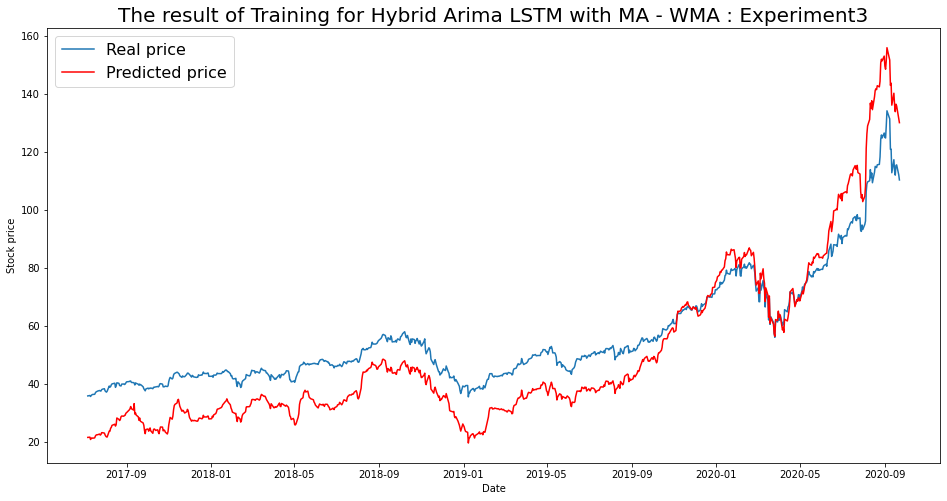

----- Train RMSE for WMA ----- 11.6464497844428
----- Train_MSE_LSTM for WMA ----- 135.63979258154774
----- Train MAE LSTM for WMA ----- 10.44059237611322


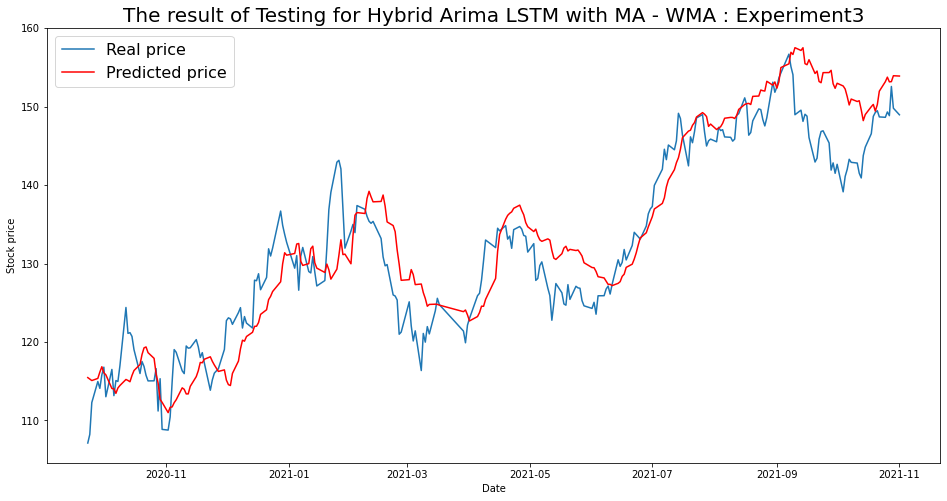

----- Test RMSE for WMA----- 4.958449798877449
----- Test_MSE_LSTM for WMA----- 24.586224407987817
----- Test_MAE_LSTM for WMA----- 3.970226889097132


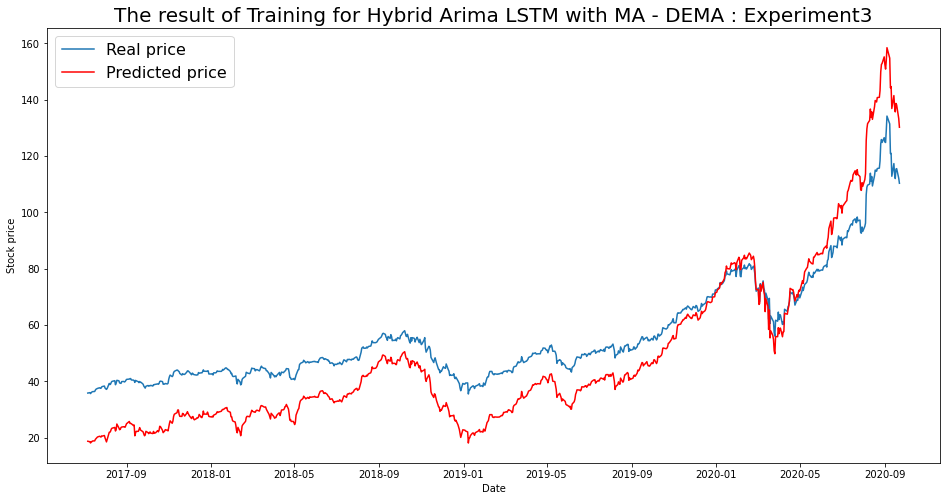

----- Train RMSE for DEMA ----- 12.798003878729565
----- Train_MSE_LSTM for DEMA ----- 163.78890327997698
----- Train MAE LSTM for DEMA ----- 11.593951105370675


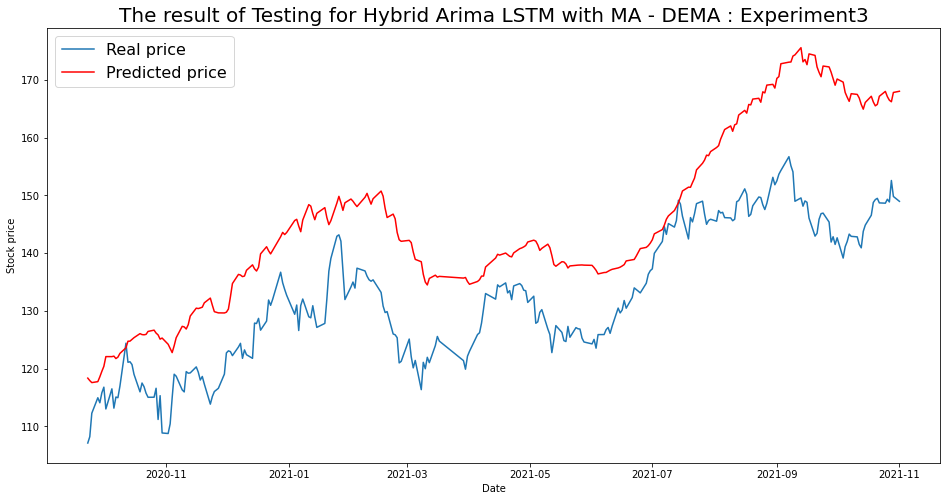

----- Test RMSE for DEMA----- 14.3963453762824
----- Test_MSE_LSTM for DEMA----- 207.2547601932076
----- Test_MAE_LSTM for DEMA----- 12.894635987621164


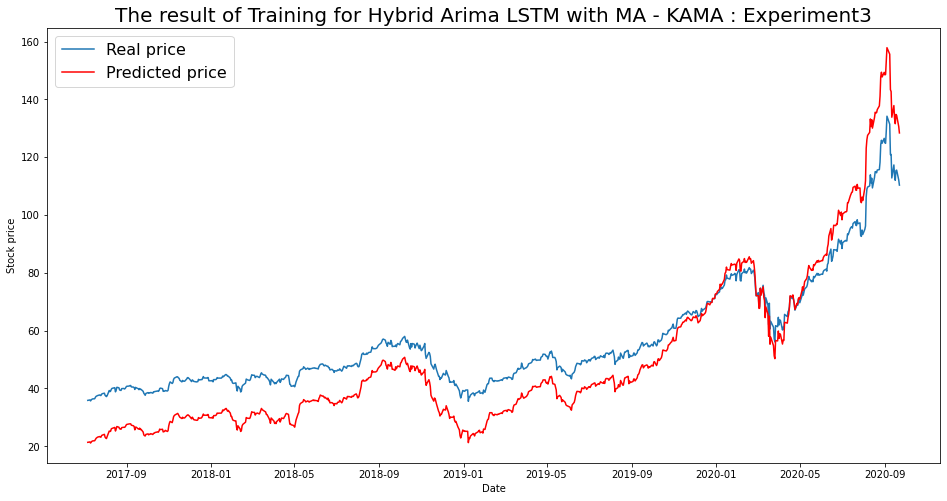

----- Train RMSE for KAMA ----- 10.917779337092348
----- Train_MSE_LSTM for KAMA ----- 119.19790565344064
----- Train MAE LSTM for KAMA ----- 9.91727143279415


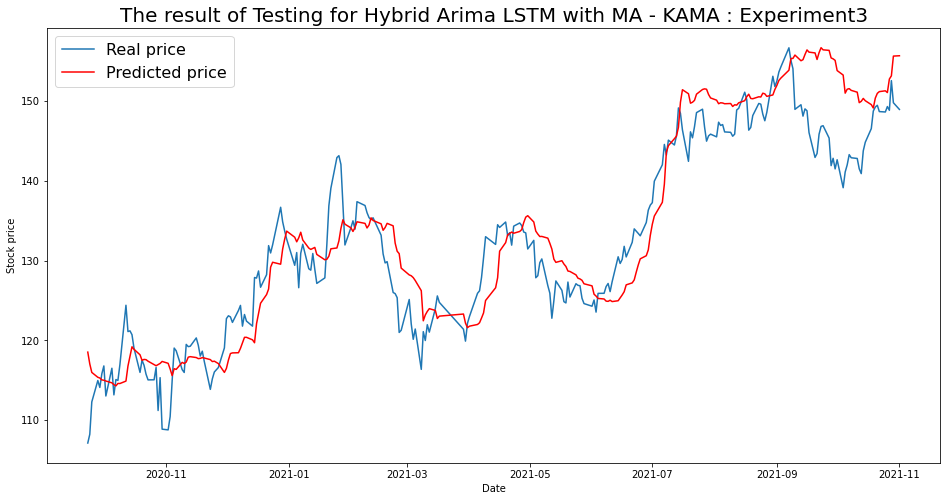

----- Test RMSE for KAMA----- 4.872756371610364
----- Test_MSE_LSTM for KAMA----- 23.743754657069395
----- Test_MAE_LSTM for KAMA----- 3.7850733762502107


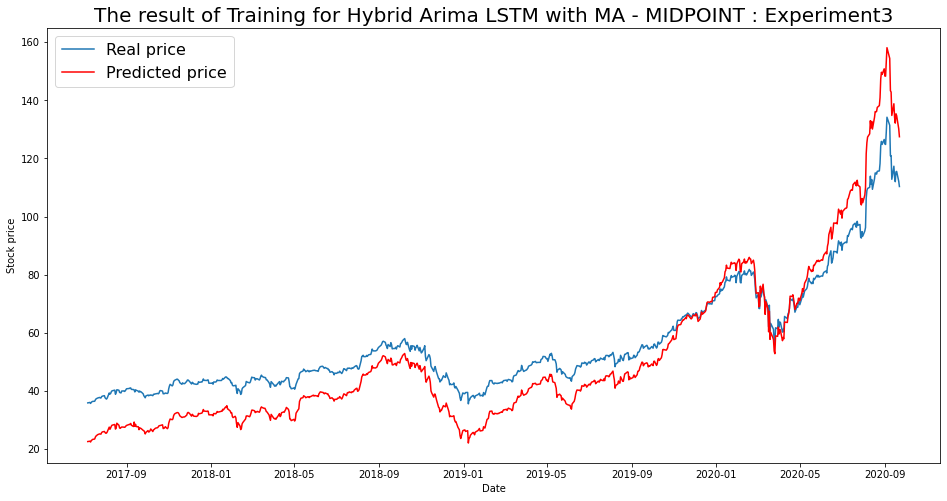

----- Train RMSE for MIDPOINT ----- 9.672965115616142
----- Train_MSE_LSTM for MIDPOINT ----- 93.56625412792681
----- Train MAE LSTM for MIDPOINT ----- 8.607510758185814


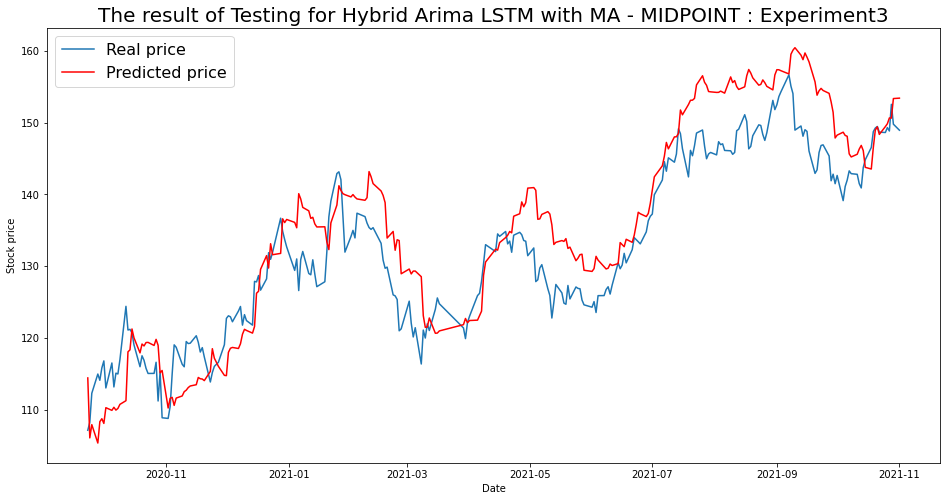

----- Test RMSE for MIDPOINT----- 5.968619684258559
----- Test_MSE_LSTM for MIDPOINT----- 35.62442093531873
----- Test_MAE_LSTM for MIDPOINT----- 5.0490603478808165


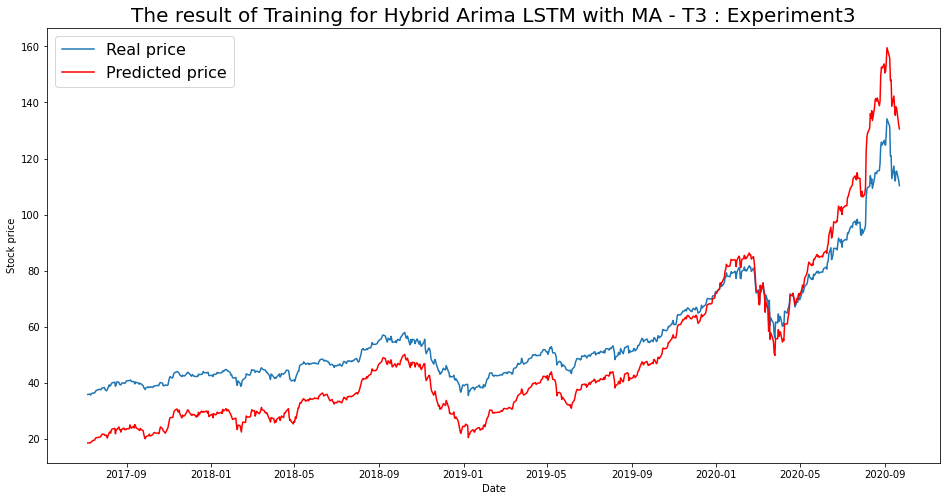

----- Train RMSE for T3 ----- 12.322513146591183
----- Train_MSE_LSTM for T3 ----- 151.84433024791252
----- Train MAE LSTM for T3 ----- 11.162838602510032


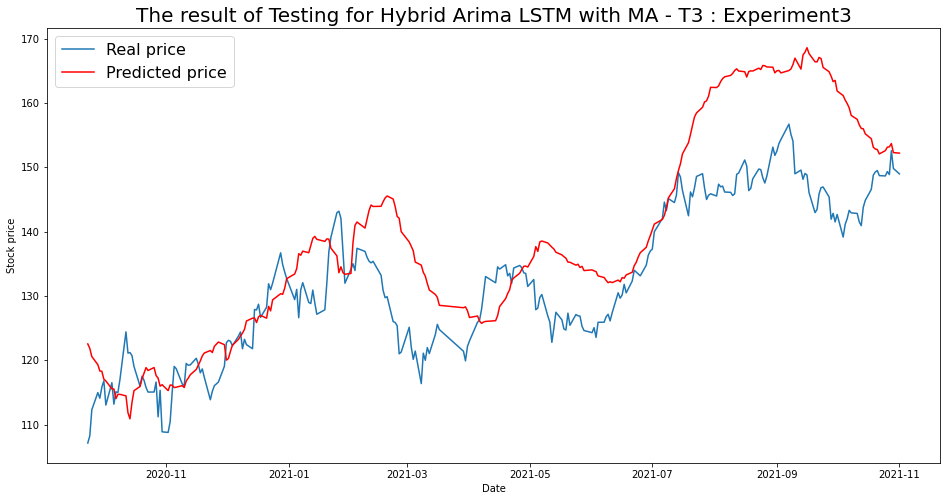

----- Test RMSE for T3----- 10.185055542763655
----- Test_MSE_LSTM for T3----- 103.73535640918065
----- Test_MAE_LSTM for T3----- 8.016244139827235


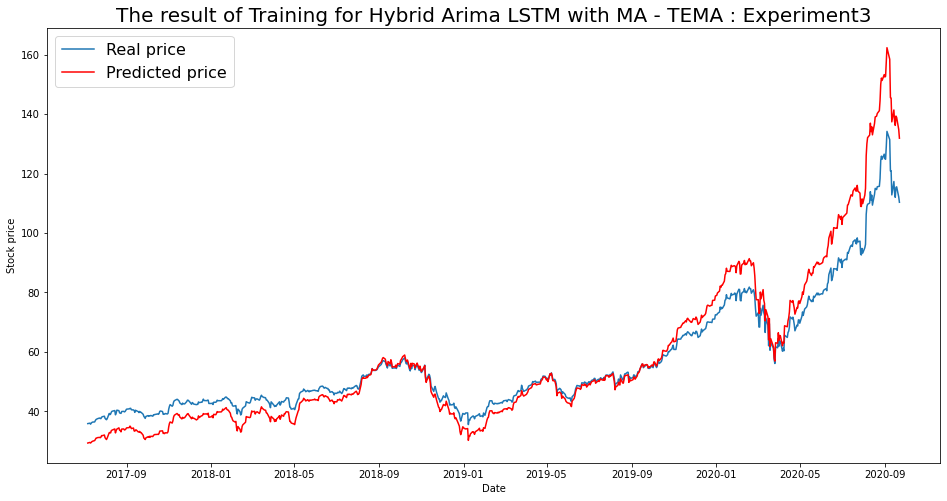

----- Train RMSE for TEMA ----- 7.464720413063123
----- Train_MSE_LSTM for TEMA ----- 55.72205084520128
----- Train MAE LSTM for TEMA ----- 5.129409694220032


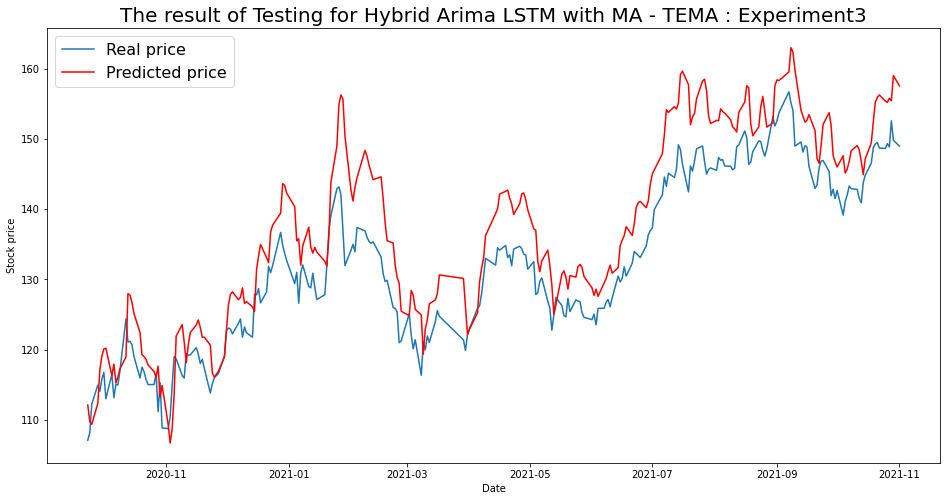

----- Test RMSE for TEMA----- 6.316228397668807
----- Test_MSE_LSTM for TEMA----- 39.894741171517865
----- Test_MAE_LSTM for TEMA----- 5.481705479796751


In [121]:
for i in range(len(list(simulation3.keys()))):
  SIM = list(simulation3.keys())[i]
  plot_train(simulation3,SIM)
  plot_test(simulation3,SIM)

## Univariate Arima Multistep MutiVariate LSTM Hybrid Model Experiment 4

From  the above experiments it is evident that with Higher moving averages the loss plots show unreoresented data and underfitting, hence keeping only the MA's that have smaller periods like T3 OR TRIMA. Going forward EMA, WMA & DEMA will be ignored.

In [97]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # # Option 1
    # # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()




    # # Option 3
    # # define custom activation
    # # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    model = Sequential()
    model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(input_dim, feature_size)))
    model.add(LSTM(units=int(lstm_len/2)))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='mean_squared_error', optimizer='adam')
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM4.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = (y_scaler.inverse_transform(predictiontr)-det).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte =( y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.54 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4157.020, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3687.148, Time=0.05 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.19 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3458.651, Time=0.08 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3322.133, Time=0.09 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.76 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.82 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3324.133, Time=0.19 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 2.749 seconds
                               SARIMAX Results                                
Dep.

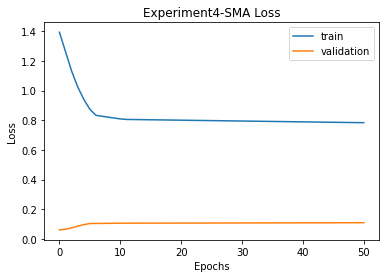


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 19.776724587061057 
RMSE:	 4.447102943159856 
MAPE:	 3.587879520041786
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.42 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4231.556, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3761.238, Time=0.05 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3532.227, Time=0.07 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3394.496, Time=0.10 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.87 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.64 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3396.496, Time=0.22

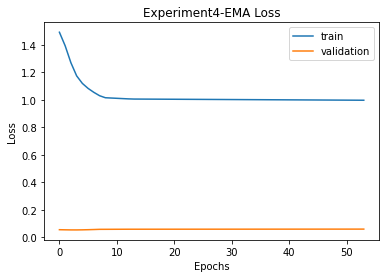


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 19.776724587061057 
RMSE:	 4.447102943159856 
MAPE:	 3.587879520041786

EMA
Prediction vs Close:		57.09% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 31.621751516368622 
RMSE:	 5.623322106759368 
MAPE:	 4.355106062590965
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.43 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4264.089, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3793.930, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.24 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3564.923, Time=0.07 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3427.258, Time=0.09 sec
 ARIMA(3,3,1)(0,0,0)[0] 

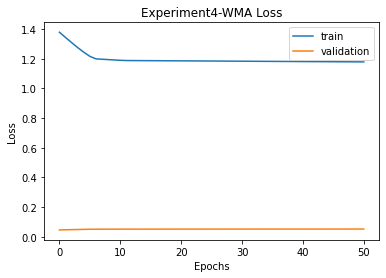


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 19.776724587061057 
RMSE:	 4.447102943159856 
MAPE:	 3.587879520041786

EMA
Prediction vs Close:		57.09% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 31.621751516368622 
RMSE:	 5.623322106759368 
MAPE:	 4.355106062590965

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 52.4753296205182 
RMSE:	 7.2439857551294375 
MAPE:	 5.852253139584933
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.44 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4436.126, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3965.317, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=i

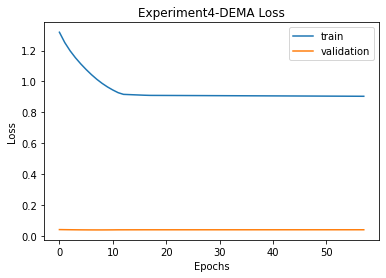


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 19.776724587061057 
RMSE:	 4.447102943159856 
MAPE:	 3.587879520041786

EMA
Prediction vs Close:		57.09% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 31.621751516368622 
RMSE:	 5.623322106759368 
MAPE:	 4.355106062590965

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 52.4753296205182 
RMSE:	 7.2439857551294375 
MAPE:	 5.852253139584933

DEMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 146.44755629127866 
RMSE:	 12.10155181335347 
MAPE:	 10.943210296434415
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(0,3,0)

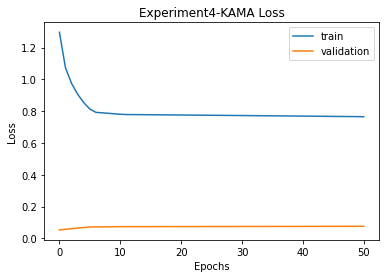


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 19.776724587061057 
RMSE:	 4.447102943159856 
MAPE:	 3.587879520041786

EMA
Prediction vs Close:		57.09% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 31.621751516368622 
RMSE:	 5.623322106759368 
MAPE:	 4.355106062590965

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 52.4753296205182 
RMSE:	 7.2439857551294375 
MAPE:	 5.852253139584933

DEMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 146.44755629127866 
RMSE:	 12.10155181335347 
MAPE:	 10.943210296434415

KAMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 19.64215945229788 
RMSE:	 4.4319475913302355 
MAPE:	 3.5686191181651687
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on M

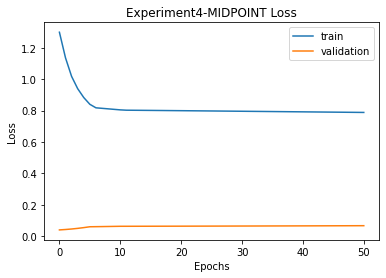


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 19.776724587061057 
RMSE:	 4.447102943159856 
MAPE:	 3.587879520041786

EMA
Prediction vs Close:		57.09% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 31.621751516368622 
RMSE:	 5.623322106759368 
MAPE:	 4.355106062590965

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 52.4753296205182 
RMSE:	 7.2439857551294375 
MAPE:	 5.852253139584933

DEMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 146.44755629127866 
RMSE:	 12.10155181335347 
MAPE:	 10.943210296434415

KAMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 19.64215945229788 
RMSE:	 4.4319475913302355 
MAPE:	 3.5686191181651687

MIDPOINT
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 19.83404242536117 
RMSE:	 4.453542682557468 
MAPE:	 3.5743844299716057
T3
T3([input_arrays], [

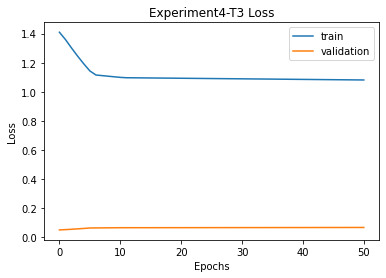


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 19.776724587061057 
RMSE:	 4.447102943159856 
MAPE:	 3.587879520041786

EMA
Prediction vs Close:		57.09% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 31.621751516368622 
RMSE:	 5.623322106759368 
MAPE:	 4.355106062590965

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 52.4753296205182 
RMSE:	 7.2439857551294375 
MAPE:	 5.852253139584933

DEMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 146.44755629127866 
RMSE:	 12.10155181335347 
MAPE:	 10.943210296434415

KAMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 19.64215945229788 
RMSE:	 4.4319475913302355 
MAPE:	 3.5686191181651687

MIDPOINT
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 19.83404242536117 
RMSE:	 4.453542682557468 
MAPE:	 3.5743844299716057

T3
Prediction vs Close

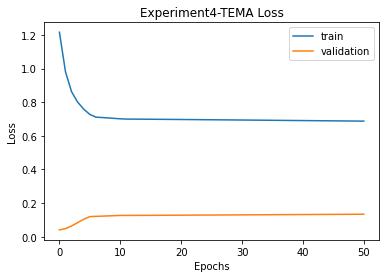


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 19.776724587061057 
RMSE:	 4.447102943159856 
MAPE:	 3.587879520041786

EMA
Prediction vs Close:		57.09% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 31.621751516368622 
RMSE:	 5.623322106759368 
MAPE:	 4.355106062590965

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 52.4753296205182 
RMSE:	 7.2439857551294375 
MAPE:	 5.852253139584933

DEMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 146.44755629127866 
RMSE:	 12.10155181335347 
MAPE:	 10.943210296434415

KAMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 19.64215945229788 
RMSE:	 4.4319475913302355 
MAPE:	 3.5686191181651687

MIDPOINT
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 19.83404242536117 
RMSE:	 4.453542682557468 
MAPE:	 3.5743844299716057

T3
Prediction vs Close

In [98]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation4 = {}
    imgfile = 'Experiment4'
    for ma in optimized_period:
              print(ma)
              print(functions[ma])
              print ( int( optimized_period[ma]))
            # if ma == 'SMA':
              low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
              low_vol = low_vol.fillna(0)
              low_vol_data = df['close']
              high_vol = pd.DataFrame()
              df2 = df.copy()
              for i in df2.columns:
                if i in low_vol.columns:
                  high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
              high_vol_data = df['close']
              ## *****************************************************
              # Generate ARIMA and LSTM predictions
              print('\nWorking on ' + ma + ' predictions')
              try:
                print('parameters used : ', train_len, test_len)
                low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima(low_vol,low_vol_data, train_len, test_len)
              except:
                  print('ARIMA error, skipping to next MA type')
                  continue
              Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
              final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
              mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
              rmse_ftr = mse_ftr ** 0.5
              mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
              mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

              final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
              mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
              rmse = mse ** 0.5
              mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              # Generate prediction accuracy
              actual = df['close'].tail(test_len).values
              result_1 = []
              result_2 = []
              for i in range(1, len(final_prediction)):
                  # Compare prediction to previous close price
                  if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                      result_1.append(1)
                  elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                      result_1.append(1)
                  else:
                      result_1.append(0)

                  # Compare prediction to previous prediction
                  if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                      result_2.append(1)
                  elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                      result_2.append(1)
                  else:
                      result_2.append(0)

              accuracy_1 = np.mean(result_1)
              accuracy_2 = np.mean(result_2)

              simulation4[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                            'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                            'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                            'rmse': rmse_ftr, 'mae' : mae_ftr},
                                'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                          'rmse': rmse, 'mae': mae },
                                'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

              # save simulation data here as checkpoint
              with open('simulation4_data.json', 'w') as fp:
                  json.dump(simulation4, fp)

              for ma in simulation4.keys():
                  print('\n' + ma)
                  print('Prediction vs Close:\t\t' + str(round(100*simulation4[ma]['accuracy']['prediction vs close'], 2))
                        + '% Accuracy')
                  print('Prediction vs Prediction:\t' + str(round(100*simulation4[ma]['accuracy']['prediction vs prediction'], 2))
                        + '% Accuracy')
                  print('MSE:\t', simulation4[ma]['final']['mse'],
                        '\nRMSE:\t', simulation4[ma]['final']['rmse'],
                        '\nMAPE:\t', simulation4[ma]['final']['mae'])#,
                        # '\nMAPE:\t', simulation[ma]['final']['mape'])
            # else:
            #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [99]:
from google.colab import files
import cv2
uploaded = files.upload()

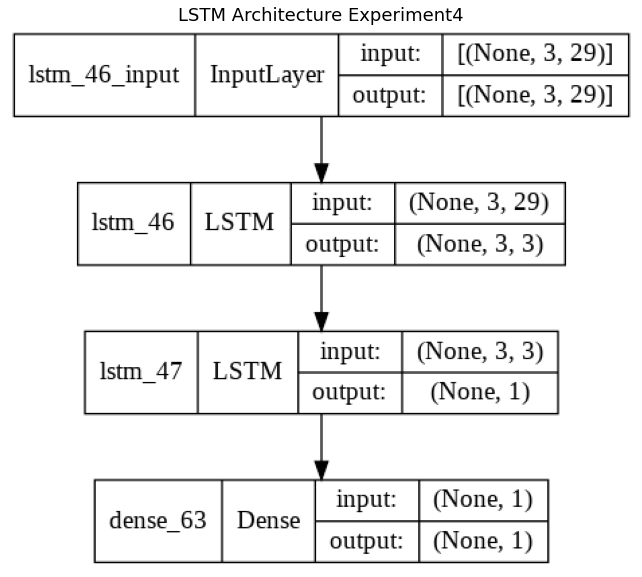

In [100]:
img = cv2.imread('Experiment4.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [122]:
with open('simulation4_data.json') as json_file:
    simulation4 = json.load(json_file)
fileimg = 'Experiment4'

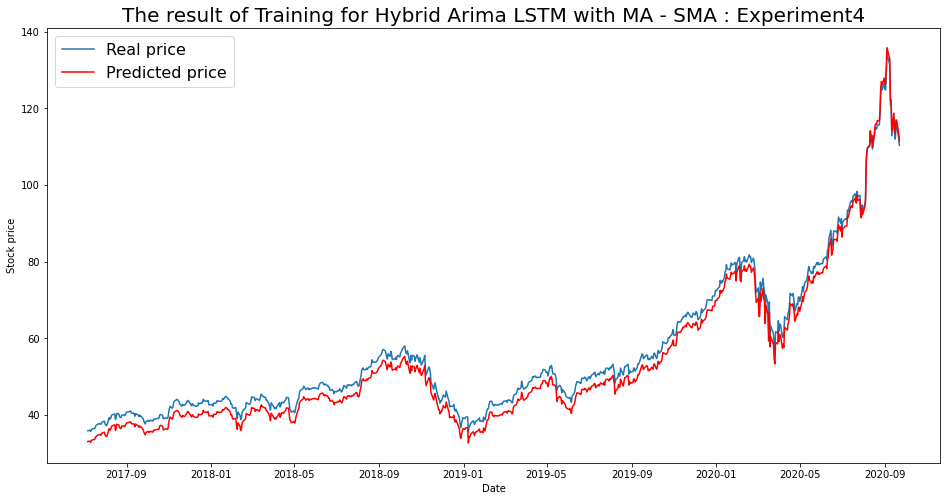

----- Train RMSE for SMA ----- 2.7003156237977874
----- Train_MSE_LSTM for SMA ----- 7.291704468126434
----- Train MAE LSTM for SMA ----- 2.660792327163243


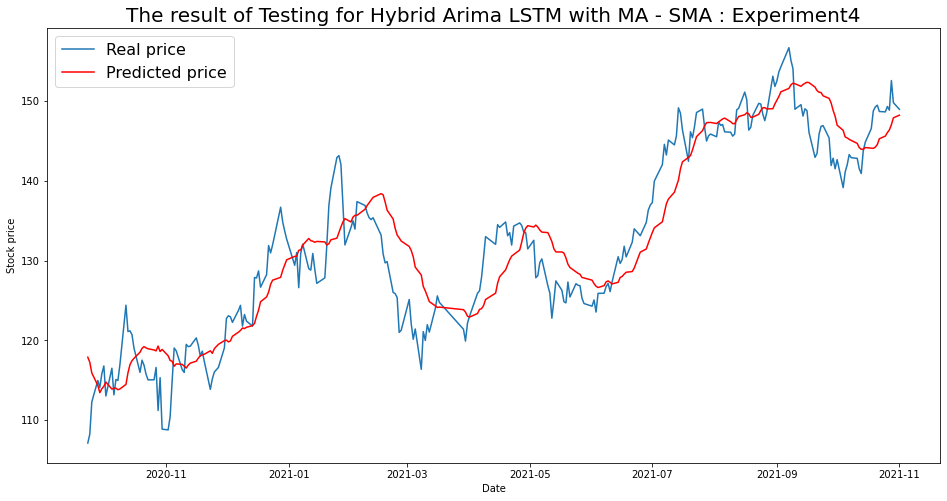

----- Test RMSE for SMA----- 4.447102943159856
----- Test_MSE_LSTM for SMA----- 19.776724587061057
----- Test_MAE_LSTM for SMA----- 3.587879520041786


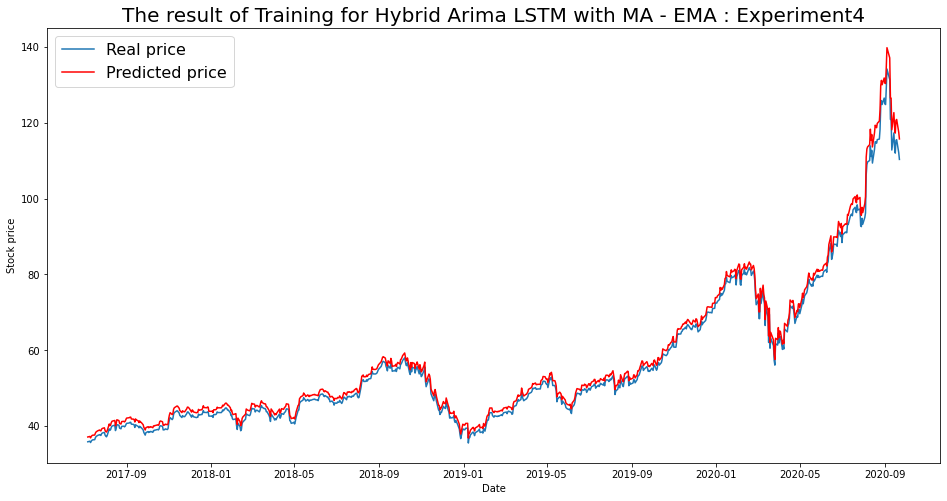

----- Train RMSE for EMA ----- 1.713593446317321
----- Train_MSE_LSTM for EMA ----- 2.9364024992616735
----- Train MAE LSTM for EMA ----- 1.5223039660123314


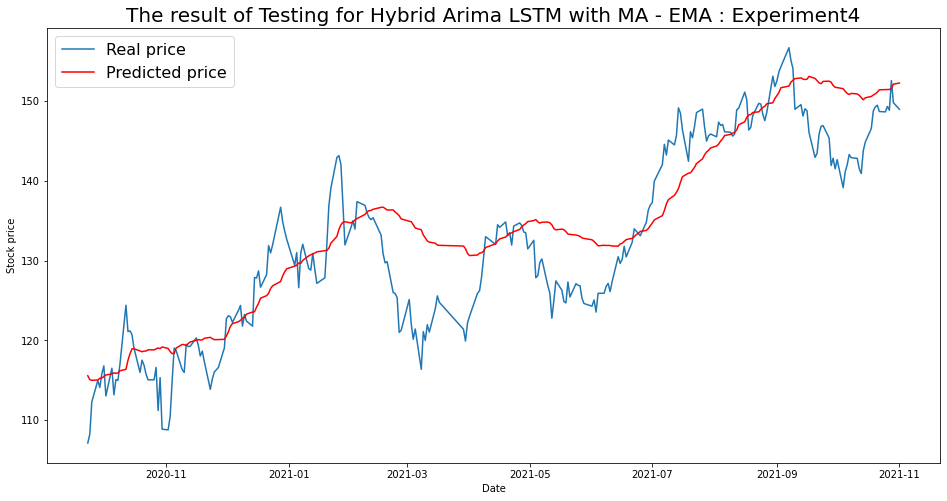

----- Test RMSE for EMA----- 5.623322106759368
----- Test_MSE_LSTM for EMA----- 31.621751516368622
----- Test_MAE_LSTM for EMA----- 4.355106062590965


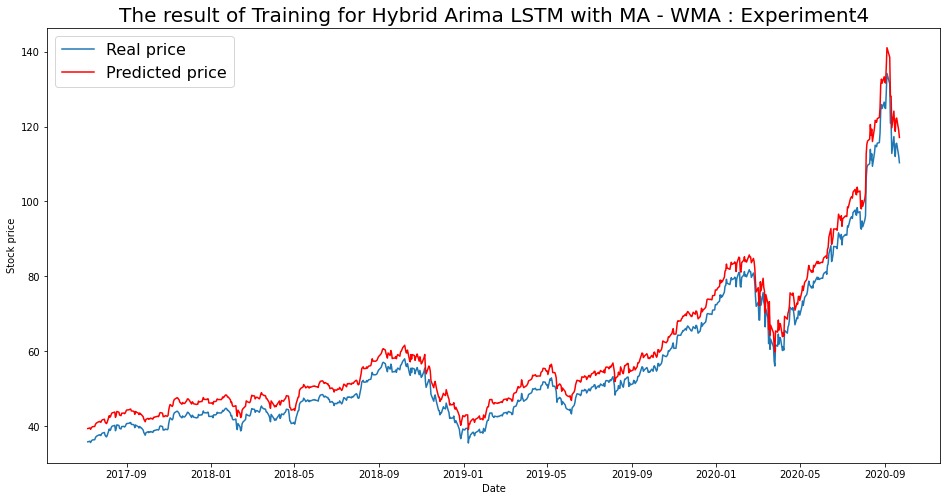

----- Train RMSE for WMA ----- 3.927450398854089
----- Train_MSE_LSTM for WMA ----- 15.424866635459145
----- Train MAE LSTM for WMA ----- 3.865711769255081


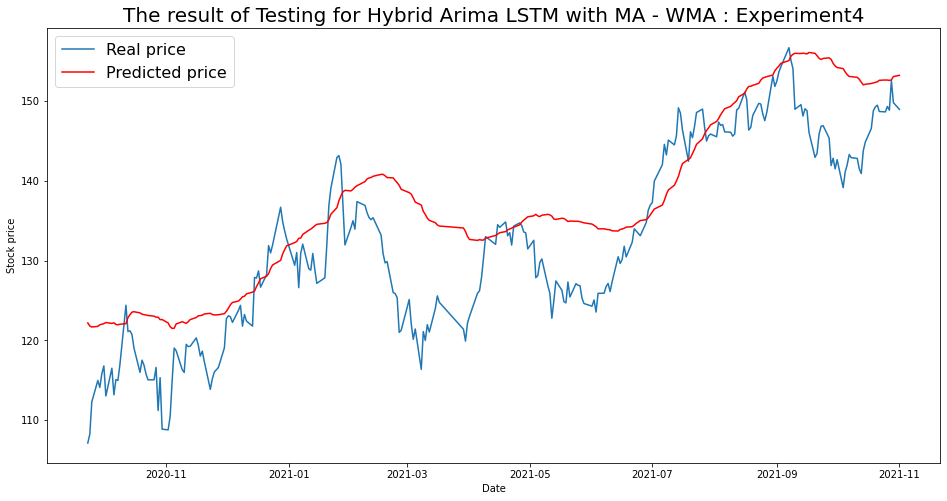

----- Test RMSE for WMA----- 7.2439857551294375
----- Test_MSE_LSTM for WMA----- 52.4753296205182
----- Test_MAE_LSTM for WMA----- 5.852253139584933


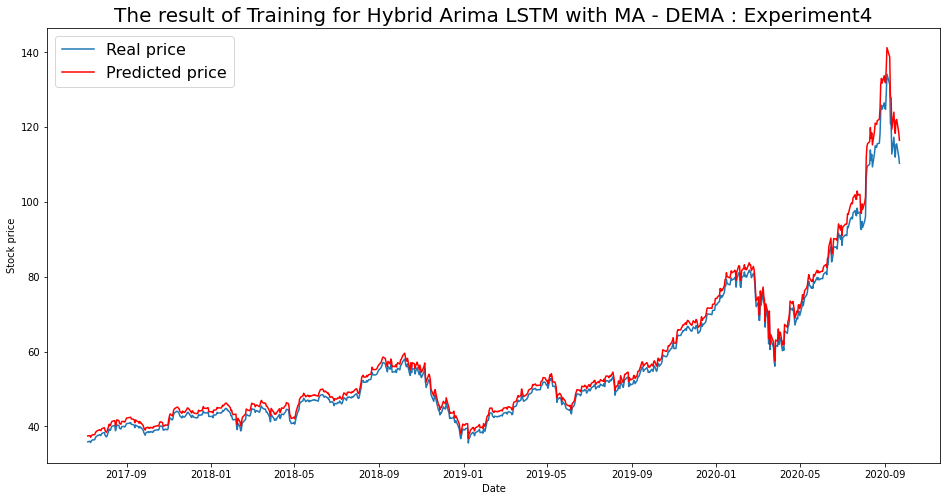

----- Train RMSE for DEMA ----- 2.0481672182170936
----- Train_MSE_LSTM for DEMA ----- 4.194988953779147
----- Train MAE LSTM for DEMA ----- 1.7103755544907977


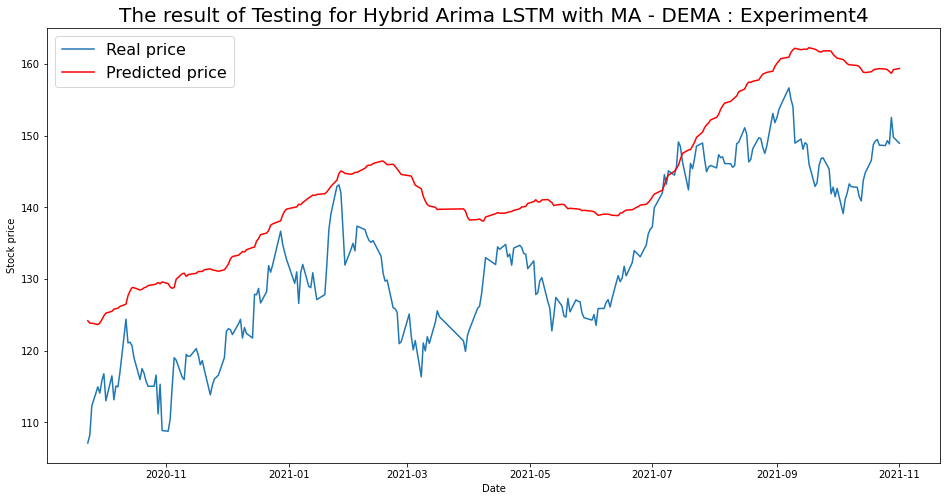

----- Test RMSE for DEMA----- 12.10155181335347
----- Test_MSE_LSTM for DEMA----- 146.44755629127866
----- Test_MAE_LSTM for DEMA----- 10.943210296434415


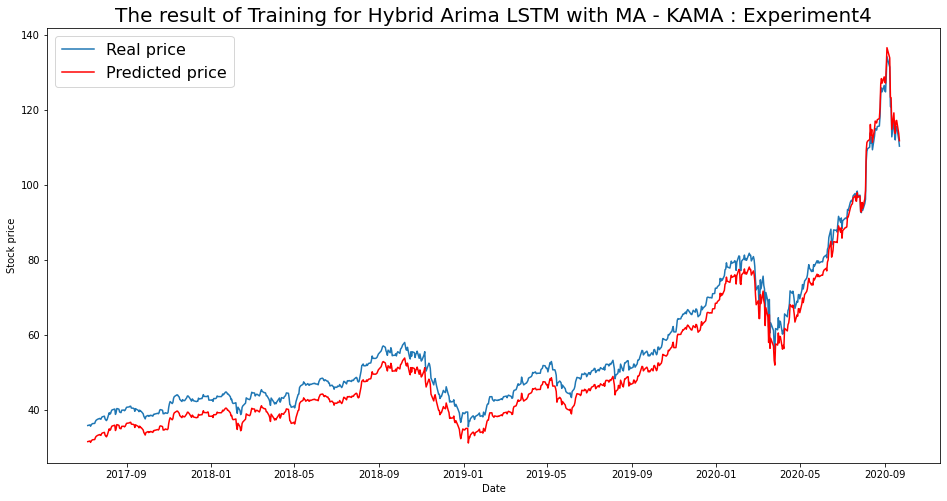

----- Train RMSE for KAMA ----- 4.06602280300264
----- Train_MSE_LSTM for KAMA ----- 16.532541434537443
----- Train MAE LSTM for KAMA ----- 4.004387627733816


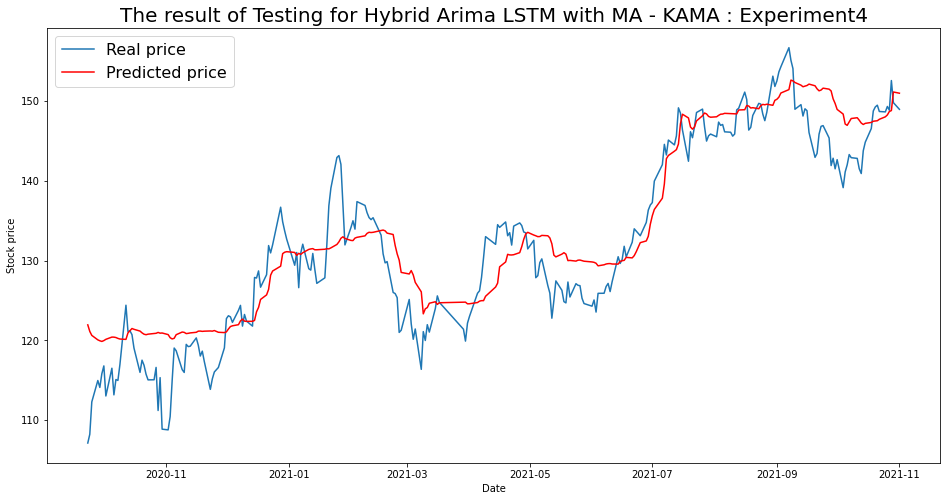

----- Test RMSE for KAMA----- 4.4319475913302355
----- Test_MSE_LSTM for KAMA----- 19.64215945229788
----- Test_MAE_LSTM for KAMA----- 3.5686191181651687


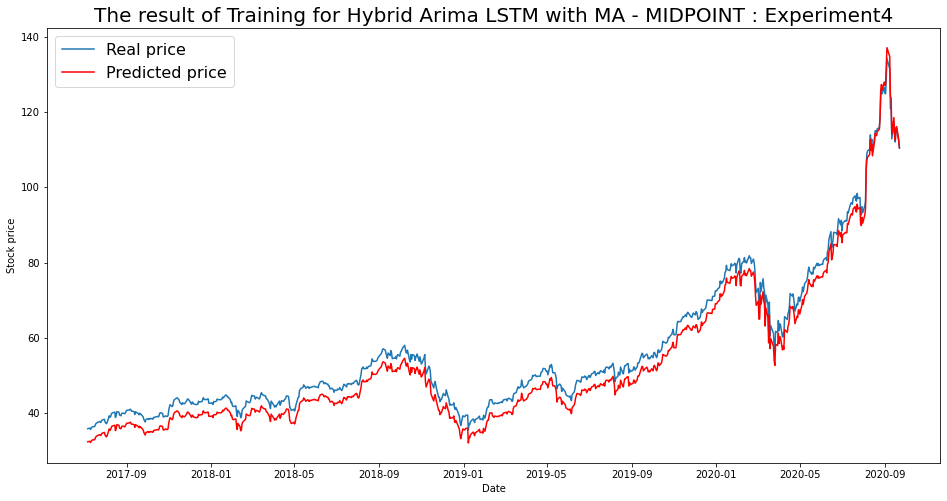

----- Train RMSE for MIDPOINT ----- 3.3807826675549606
----- Train_MSE_LSTM for MIDPOINT ----- 11.429691445240035
----- Train MAE LSTM for MIDPOINT ----- 3.34850282244163


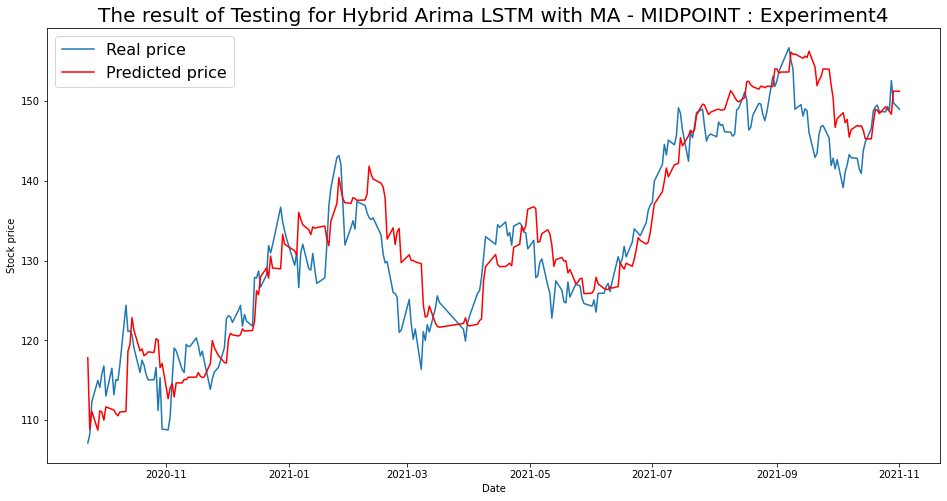

----- Test RMSE for MIDPOINT----- 4.453542682557468
----- Test_MSE_LSTM for MIDPOINT----- 19.83404242536117
----- Test_MAE_LSTM for MIDPOINT----- 3.5743844299716057


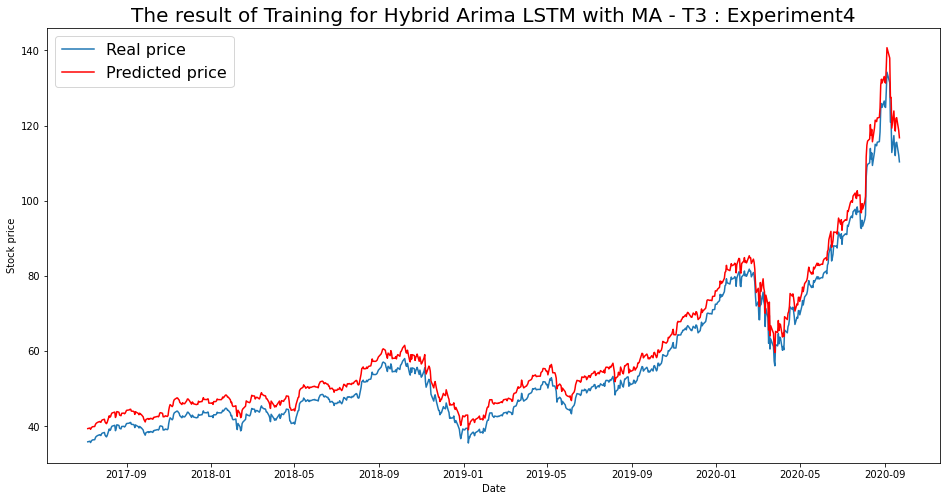

----- Train RMSE for T3 ----- 3.7130600011370944
----- Train_MSE_LSTM for T3 ----- 13.786814572044198
----- Train MAE LSTM for T3 ----- 3.666137409682321


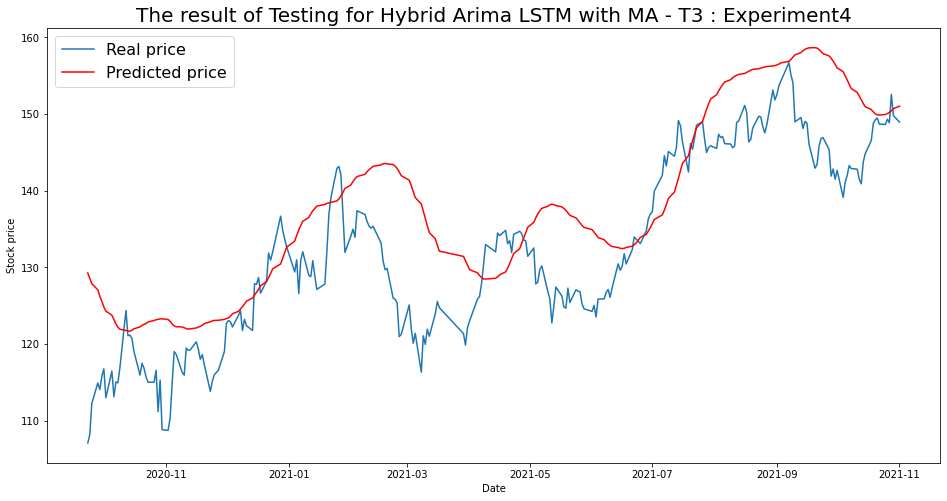

----- Test RMSE for T3----- 8.406465540576637
----- Test_MSE_LSTM for T3----- 70.66866288490243
----- Test_MAE_LSTM for T3----- 6.802843731006552


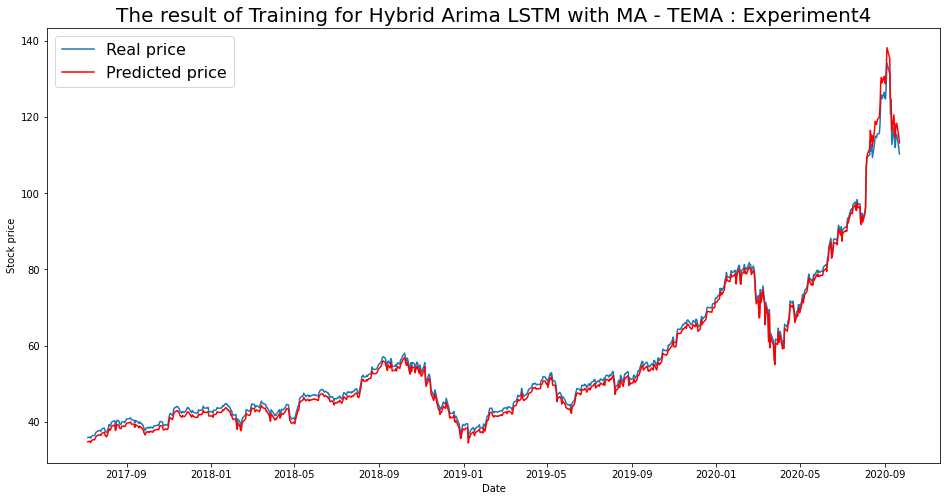

----- Train RMSE for TEMA ----- 1.286632285419522
----- Train_MSE_LSTM for TEMA ----- 1.6554226378838626
----- Train MAE LSTM for TEMA ----- 1.1888332532183958


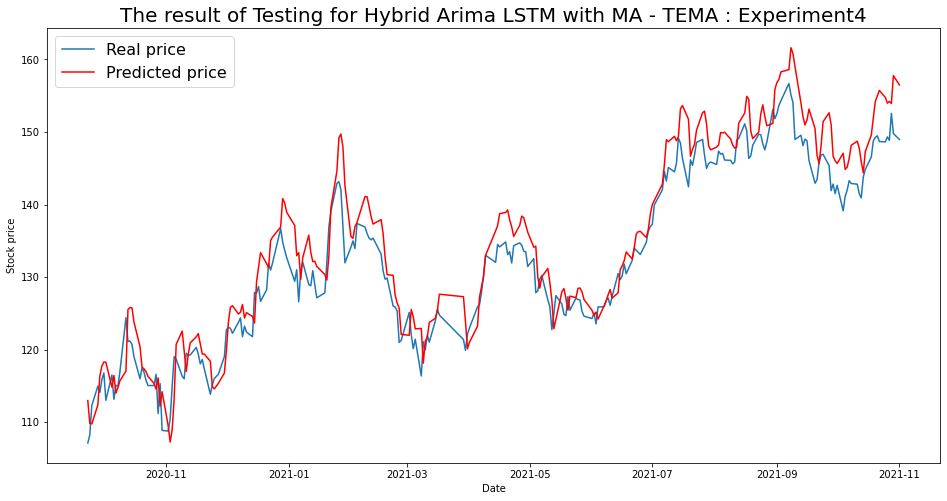

----- Test RMSE for TEMA----- 3.8549577642519868
----- Test_MSE_LSTM for TEMA----- 14.860699364166678
----- Test_MAE_LSTM for TEMA----- 3.1502795604602833


In [123]:
for i in range(len(list(simulation4.keys()))):
  SIM = list(simulation4.keys())[i]
  plot_train(simulation4,SIM)
  plot_test(simulation4,SIM)

## Arima w Exogenous Variable Multistep MutiVariate LSTM Hybrid Model Experiment 5

In [112]:
def get_arima_exog(dataframe,original_data, train_len, test_len):    
    

    # prepare train and test data for exogenous vr
    X_value = pd.DataFrame(low_vol.iloc[:, :])
    y_value = pd.DataFrame(low_vol.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    X_scale_dataset = X_scaler.fit_transform(X_value)
    y_scale_dataset = y_scaler.fit_transform(y_value)
    # Get data and check shape
    # X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X_scale_dataset)
    y_train, y_test, = split_train_test(y_scale_dataset)
    yc_train,yc_test = split_train_test(low_vol_data)
    yc = yc_test.values.tolist()
    y_train_list = y_train.flatten().tolist()
    y_test_list = y_test.flatten().tolist()
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

    # Initialize model
    model = auto_arima(y_train_list,exogenous  = X_train,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
            suppress_warnings=True,stepwise=True,seasonal=True)

      # Determine model parameters
    print(model.summary())
    model.fit(y_train_list,maxiter=200)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

      # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
        model = pmdarima.ARIMA(order=order)
        model.fit(y_train_list)
        # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')

        prediction.append(model.predict()[0])
        y_train_list.append(y_test_list[i])

    predictionte = y_scaler.inverse_transform(np.array(prediction).reshape(-1,1))
    y_test_ = y_scaler.inverse_transform(np.array(y_test_list).reshape(-1,1))

    # Generate error data
    mse = mean_squared_error(yc_test, predictionte)
    rmse = mse ** 0.5
    mae = mean_absolute_error(y_test_ , predictionte )
    return yc,predictionte.flatten().tolist(), mse, rmse, mae

In [113]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    model = Sequential()
    model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    model.add(Dense(units=64,activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(units=output_dim))
    model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    ## Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM5.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()


    # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 3
    # define custom activation
    # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(input_dim, feature_size)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM5.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16989.787, Time=3.85 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14558.588, Time=5.46 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-14596.280, Time=5.73 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14556.588, Time=8.46 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16924.805, Time=10.67 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-14482.349, Time=10.95 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-17215.608, Time=21.20 sec
 ARIMA(0,3,3)(0,0,0)[0]             : AIC=-14552.588, Time=10.42 sec
 ARIMA(1,3,3)(0,0,0)[0]             : AIC=-15570.350, Time=19.26 sec
 ARIMA(0,3,2)(0,0,0)[0] intercept   : AIC=-11671.292, Time=27.08 sec

Best model:  ARIMA(0,3,2)(0,0,0)[0]          
T

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.25612, saving model to LSTM5.h5
48/48 - 2s - loss: 0.4353 - val_loss: 0.2561 - lr: 0.0010 - 2s/epoch - 39ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.25612 to 0.11825, saving model to LSTM5.h5
48/48 - 0s - loss: 0.1198 - val_loss: 0.1182 - lr: 0.0010 - 456ms/epoch - 9ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.11825 to 0.11433, saving model to LSTM5.h5
48/48 - 0s - loss: 0.0779 - val_loss: 0.1143 - lr: 0.0010 - 432ms/epoch - 9ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.11433
48/48 - 0s - loss: 0.0580 - val_loss: 0.1983 - lr: 0.0010 - 402ms/epoch - 8ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.11433 to 0.02870, saving model to LSTM5.h5
48/48 - 0s - loss: 0.0636 - val_loss: 0.0287 - lr: 0.0010 - 499ms/epoch - 10ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.02870
48/48 - 0s - loss: 0.0631 - val_loss: 0.5273 - lr: 0.0010 - 422ms/epoch - 9ms/step
Epo

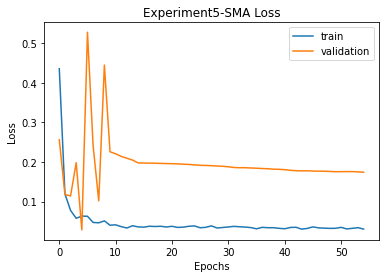


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	52.61% Accuracy
MSE:	 34.39169744803393 
RMSE:	 5.864443490053761 
MAPE:	 4.893666026892695
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16989.778, Time=3.79 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14558.587, Time=5.47 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15952.568, Time=15.15 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14556.587, Time=7.81 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16628.634, Time=10.62 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-16462.206, Time=24.29 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-16848.298, Time=12.82 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-17014.023, Time=6.57 sec
 ARIMA(3,3,0)(0,0,0)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16987.994, Time=3.86 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16982.667, Time=5.19 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 125.475 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.727
Date:                Sun, 12 Dec 2021   AIC                         -17071.454
Time:                        16:13:56   BIC                         -16911.966
Sample:                             0   HQIC                        -17010.204
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.35754, saving model to LSTM5.h5
16/16 - 2s - loss: 0.7057 - val_loss: 0.3575 - lr: 0.0010 - 2s/epoch - 95ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.35754 to 0.02747, saving model to LSTM5.h5
16/16 - 0s - loss: 0.2192 - val_loss: 0.0275 - lr: 0.0010 - 160ms/epoch - 10ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.02747
16/16 - 0s - loss: 0.1892 - val_loss: 0.0299 - lr: 0.0010 - 166ms/epoch - 10ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.02747
16/16 - 0s - loss: 0.0957 - val_loss: 0.0364 - lr: 0.0010 - 150ms/epoch - 9ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.02747 to 0.01373, saving model to LSTM5.h5
16/16 - 0s - loss: 0.0562 - val_loss: 0.0137 - lr: 0.0010 - 162ms/epoch - 10ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.01373
16/16 - 0s - loss: 0.0545 - val_loss: 0.0143 - lr: 0.0010 - 146ms/epoch - 9ms/step
Epoch 7/500

Epoch 00007: val_l

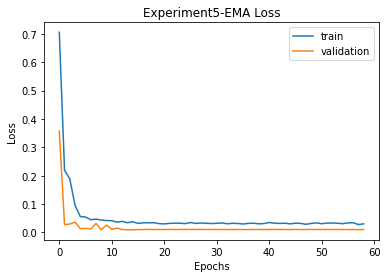


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	52.61% Accuracy
MSE:	 34.39169744803393 
RMSE:	 5.864443490053761 
MAPE:	 4.893666026892695

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 73.04930062485933 
RMSE:	 8.546888359213506 
MAPE:	 6.613879572809731
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16989.778, Time=3.41 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14558.587, Time=5.42 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-14597.576, Time=5.58 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14556.587, Time=8.18 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15338.693, Time=11.30 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-15153.472, Time=27.61 sec


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.26413, saving model to LSTM5.h5
17/17 - 2s - loss: 0.3187 - val_loss: 0.2641 - lr: 0.0010 - 2s/epoch - 113ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.26413 to 0.12648, saving model to LSTM5.h5
17/17 - 0s - loss: 0.1236 - val_loss: 0.1265 - lr: 0.0010 - 178ms/epoch - 10ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.12648
17/17 - 0s - loss: 0.0648 - val_loss: 0.4408 - lr: 0.0010 - 159ms/epoch - 9ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.12648
17/17 - 0s - loss: 0.0783 - val_loss: 0.2928 - lr: 0.0010 - 165ms/epoch - 10ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.12648
17/17 - 0s - loss: 0.1373 - val_loss: 0.1590 - lr: 0.0010 - 154ms/epoch - 9ms/step
Epoch 6/500

Epoch 00006: val_loss improved from 0.12648 to 0.11518, saving model to LSTM5.h5
17/17 - 0s - loss: 0.0888 - val_loss: 0.1152 - lr: 0.0010 - 187ms/epoch - 11ms/step
Epoch 7/500

Epoch 00007: val_

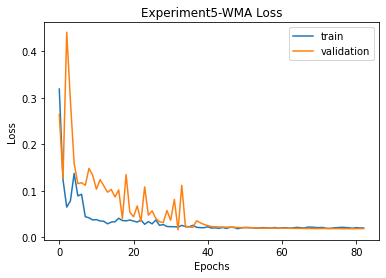


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	52.61% Accuracy
MSE:	 34.39169744803393 
RMSE:	 5.864443490053761 
MAPE:	 4.893666026892695

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 73.04930062485933 
RMSE:	 8.546888359213506 
MAPE:	 6.613879572809731

WMA
Prediction vs Close:		55.97% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 70.35376938042184 
RMSE:	 8.387715385039114 
MAPE:	 6.8547592718484545
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16989.776, Time=3.27 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14558.586, Time=5.42 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16271.755, Time=7.27 sec
 ARIMA(0,3,1)(0,0,0)[0]        

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16987.981, Time=4.31 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16982.666, Time=4.70 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 117.691 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.727
Date:                Sun, 12 Dec 2021   AIC                         -17071.454
Time:                        16:31:21   BIC                         -16911.965
Sample:                             0   HQIC                        -17010.203
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.08624, saving model to LSTM5.h5
10/10 - 2s - loss: 0.8398 - val_loss: 0.0862 - lr: 0.0010 - 2s/epoch - 155ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.08624 to 0.05008, saving model to LSTM5.h5
10/10 - 0s - loss: 0.3040 - val_loss: 0.0501 - lr: 0.0010 - 127ms/epoch - 13ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.05008 to 0.02501, saving model to LSTM5.h5
10/10 - 0s - loss: 0.0974 - val_loss: 0.0250 - lr: 0.0010 - 125ms/epoch - 12ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.02501
10/10 - 0s - loss: 0.0654 - val_loss: 0.0903 - lr: 0.0010 - 112ms/epoch - 11ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.02501
10/10 - 0s - loss: 0.0475 - val_loss: 0.0980 - lr: 0.0010 - 112ms/epoch - 11ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.02501
10/10 - 0s - loss: 0.0445 - val_loss: 0.0713 - lr: 0.0010 - 119ms/epoch - 12ms/step
Epoch 7/500

Epoch 00007: va

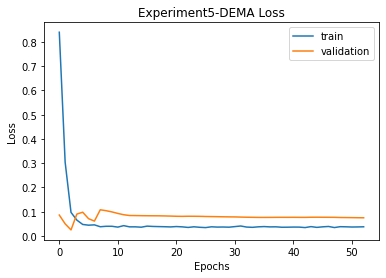


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	52.61% Accuracy
MSE:	 34.39169744803393 
RMSE:	 5.864443490053761 
MAPE:	 4.893666026892695

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 73.04930062485933 
RMSE:	 8.546888359213506 
MAPE:	 6.613879572809731

WMA
Prediction vs Close:		55.97% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 70.35376938042184 
RMSE:	 8.387715385039114 
MAPE:	 6.8547592718484545

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 70.24761196199488 
RMSE:	 8.381384847505505 
MAPE:	 6.862692730259403
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16989.104, Time=3.80 sec
 ARIMA(0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/mlemodel.py:2968: RuntimeWarning: divide by zero encountered in true_divide
  return self.params / self.bse


ARIMA order: (2, 3, 0) 



Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.03822, saving model to LSTM5.h5
45/45 - 2s - loss: 0.2308 - val_loss: 0.0382 - lr: 0.0010 - 2s/epoch - 39ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.03822
45/45 - 0s - loss: 0.1602 - val_loss: 0.5377 - lr: 0.0010 - 412ms/epoch - 9ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.03822
45/45 - 0s - loss: 0.1071 - val_loss: 0.4634 - lr: 0.0010 - 405ms/epoch - 9ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.03822
45/45 - 0s - loss: 0.0711 - val_loss: 0.2545 - lr: 0.0010 - 390ms/epoch - 9ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.03822
45/45 - 0s - loss: 0.0477 - val_loss: 0.0663 - lr: 0.0010 - 419ms/epoch - 9ms/step
Epoch 6/500

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 00006: val_loss did not improve from 0.03822
45/45 - 0s - loss: 0.0372 - val_loss: 0.0460 - lr: 0.0010 - 353ms/epoch - 8ms/step
Epoch 7/500


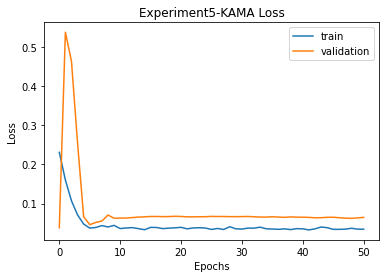


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	52.61% Accuracy
MSE:	 34.39169744803393 
RMSE:	 5.864443490053761 
MAPE:	 4.893666026892695

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 73.04930062485933 
RMSE:	 8.546888359213506 
MAPE:	 6.613879572809731

WMA
Prediction vs Close:		55.97% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 70.35376938042184 
RMSE:	 8.387715385039114 
MAPE:	 6.8547592718484545

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 70.24761196199488 
RMSE:	 8.381384847505505 
MAPE:	 6.862692730259403

KAMA
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 27.01407660930758 
RMSE:	 5.1975067685677505 
MAPE:	 4.263533603346384
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MID

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.18148, saving model to LSTM5.h5
58/58 - 2s - loss: 0.2766 - val_loss: 0.1815 - lr: 0.0010 - 2s/epoch - 33ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.18148
58/58 - 0s - loss: 0.0961 - val_loss: 0.3811 - lr: 0.0010 - 474ms/epoch - 8ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.18148 to 0.16577, saving model to LSTM5.h5
58/58 - 1s - loss: 0.0762 - val_loss: 0.1658 - lr: 0.0010 - 503ms/epoch - 9ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.16577
58/58 - 0s - loss: 0.0861 - val_loss: 0.7714 - lr: 0.0010 - 470ms/epoch - 8ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.16577
58/58 - 0s - loss: 0.0546 - val_loss: 0.4224 - lr: 0.0010 - 472ms/epoch - 8ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.16577
58/58 - 0s - loss: 0.0428 - val_loss: 0.2851 - lr: 0.0010 - 486ms/epoch - 8ms/step
Epoch 7/500

Epoch 00007: val_loss did not improve from 0.16577


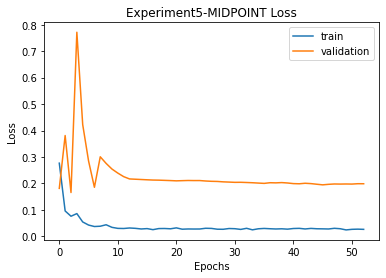


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	52.61% Accuracy
MSE:	 34.39169744803393 
RMSE:	 5.864443490053761 
MAPE:	 4.893666026892695

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 73.04930062485933 
RMSE:	 8.546888359213506 
MAPE:	 6.613879572809731

WMA
Prediction vs Close:		55.97% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 70.35376938042184 
RMSE:	 8.387715385039114 
MAPE:	 6.8547592718484545

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 70.24761196199488 
RMSE:	 8.381384847505505 
MAPE:	 6.862692730259403

KAMA
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 27.01407660930758 
RMSE:	 5.1975067685677505 
MAPE:	 4.263533603346384

MIDPOINT
Prediction vs Close:		50.37% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 37.16076795716489 
RMSE:	 6.095963250969029 
MAPE:	 5.0853544537748006
T3
T3([input_arrays], [ti

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.02752, saving model to LSTM5.h5
43/43 - 2s - loss: 0.4677 - val_loss: 0.0275 - lr: 0.0010 - 2s/epoch - 42ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.02752
43/43 - 0s - loss: 0.1066 - val_loss: 0.0474 - lr: 0.0010 - 402ms/epoch - 9ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.02752
43/43 - 0s - loss: 0.1599 - val_loss: 0.7391 - lr: 0.0010 - 374ms/epoch - 9ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.02752
43/43 - 0s - loss: 0.0688 - val_loss: 0.1002 - lr: 0.0010 - 381ms/epoch - 9ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.02752 to 0.01627, saving model to LSTM5.h5
43/43 - 0s - loss: 0.0612 - val_loss: 0.0163 - lr: 0.0010 - 433ms/epoch - 10ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.01627
43/43 - 0s - loss: 0.0435 - val_loss: 0.0873 - lr: 0.0010 - 392ms/epoch - 9ms/step
Epoch 7/500

Epoch 00007: val_loss did not improve from 0.01627

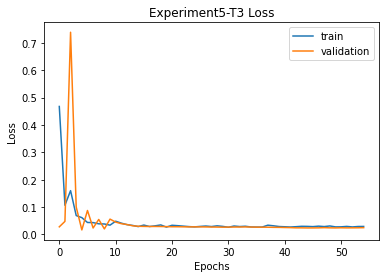


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	52.61% Accuracy
MSE:	 34.39169744803393 
RMSE:	 5.864443490053761 
MAPE:	 4.893666026892695

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 73.04930062485933 
RMSE:	 8.546888359213506 
MAPE:	 6.613879572809731

WMA
Prediction vs Close:		55.97% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 70.35376938042184 
RMSE:	 8.387715385039114 
MAPE:	 6.8547592718484545

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 70.24761196199488 
RMSE:	 8.381384847505505 
MAPE:	 6.862692730259403

KAMA
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 27.01407660930758 
RMSE:	 5.1975067685677505 
MAPE:	 4.263533603346384

MIDPOINT
Prediction vs Close:		50.37% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 37.16076795716489 
RMSE:	 6.095963250969029 
MAPE:	 5.0853544537748006

T3
Prediction vs Close:	

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.06427, saving model to LSTM5.h5
90/90 - 2s - loss: 0.2083 - val_loss: 0.0643 - lr: 0.0010 - 2s/epoch - 23ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.06427
90/90 - 1s - loss: 0.1306 - val_loss: 0.1781 - lr: 0.0010 - 704ms/epoch - 8ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.06427
90/90 - 1s - loss: 0.0743 - val_loss: 0.5438 - lr: 0.0010 - 714ms/epoch - 8ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.06427
90/90 - 1s - loss: 0.0549 - val_loss: 0.2448 - lr: 0.0010 - 685ms/epoch - 8ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.06427 to 0.01407, saving model to LSTM5.h5
90/90 - 1s - loss: 0.0472 - val_loss: 0.0141 - lr: 0.0010 - 817ms/epoch - 9ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.01407
90/90 - 1s - loss: 0.0396 - val_loss: 0.0237 - lr: 0.0010 - 774ms/epoch - 9ms/step
Epoch 7/500

Epoch 00007: val_loss did not improve from 0.01407


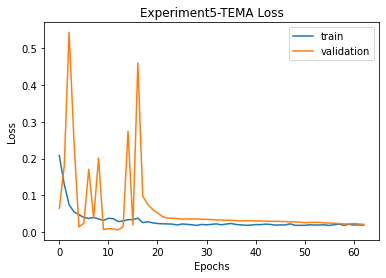


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	52.61% Accuracy
MSE:	 34.39169744803393 
RMSE:	 5.864443490053761 
MAPE:	 4.893666026892695

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 73.04930062485933 
RMSE:	 8.546888359213506 
MAPE:	 6.613879572809731

WMA
Prediction vs Close:		55.97% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 70.35376938042184 
RMSE:	 8.387715385039114 
MAPE:	 6.8547592718484545

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 70.24761196199488 
RMSE:	 8.381384847505505 
MAPE:	 6.862692730259403

KAMA
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 27.01407660930758 
RMSE:	 5.1975067685677505 
MAPE:	 4.263533603346384

MIDPOINT
Prediction vs Close:		50.37% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 37.16076795716489 
RMSE:	 6.095963250969029 
MAPE:	 5.0853544537748006

T3
Prediction vs Close:	

In [114]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation5 = {}
    imgfile = 'Experiment5'
    for ma in optimized_period:
                print(ma)
                print(functions[ma])
                print ( int( optimized_period[ma]))
              # if ma == 'SMA':
                low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
                low_vol = low_vol.fillna(0)
                low_vol_data = df['close']
                high_vol = pd.DataFrame()
                df2 = df.copy()
                for i in df2.columns:
                  if i in low_vol.columns:
                    high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
                high_vol_data = df['close']
                ## *****************************************************
                # Generate ARIMA and LSTM predictions
                print('\nWorking on ' + ma + ' predictions')
                try:
                  print('parameters used : ', train_len, test_len)
                  low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima_exog(low_vol,low_vol_data, train_len, test_len)
                except:
                    print('ARIMA error, skipping to next MA type')
                    continue
                Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
                final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
                mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
                rmse_ftr = mse_ftr ** 0.5
                mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
                mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

                final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
                mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
                rmse = mse ** 0.5
                mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                # Generate prediction accuracy
                actual = df['close'].tail(test_len).values
                result_1 = []
                result_2 = []
                for i in range(1, len(final_prediction)):
                    # Compare prediction to previous close price
                    if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                        result_1.append(1)
                    elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                        result_1.append(1)
                    else:
                        result_1.append(0)

                    # Compare prediction to previous prediction
                    if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                        result_2.append(1)
                    elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                        result_2.append(1)
                    else:
                        result_2.append(0)

                accuracy_1 = np.mean(result_1)
                accuracy_2 = np.mean(result_2)

                simulation5[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                              'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                  'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                              'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                  'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                              'rmse': rmse_ftr, 'mae' : mae_ftr},
                                  'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                            'rmse': rmse, 'mae': mae },
                                  'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

                # save simulation data here as checkpoint
                with open('simulation5_data.json', 'w') as fp:
                    json.dump(simulation5, fp)

                for ma in simulation5.keys():
                    print('\n' + ma)
                    print('Prediction vs Close:\t\t' + str(round(100*simulation5[ma]['accuracy']['prediction vs close'], 2))
                          + '% Accuracy')
                    print('Prediction vs Prediction:\t' + str(round(100*simulation5[ma]['accuracy']['prediction vs prediction'], 2))
                          + '% Accuracy')
                    print('MSE:\t', simulation5[ma]['final']['mse'],
                          '\nRMSE:\t', simulation5[ma]['final']['rmse'],
                          '\nMAPE:\t', simulation5[ma]['final']['mae'])#,
                          # '\nMAPE:\t', simulation[ma]['final']['mape'])
              # else:
              #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [116]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment5.png to Experiment5 (1).png


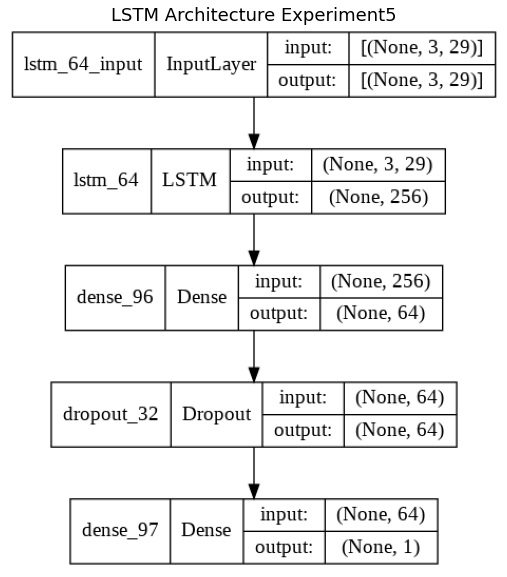

In [117]:
img = cv2.imread('Experiment5.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [124]:
with open('simulation5_data.json') as json_file:
    simulation5 = json.load(json_file)
fileimg = 'Experiment5'

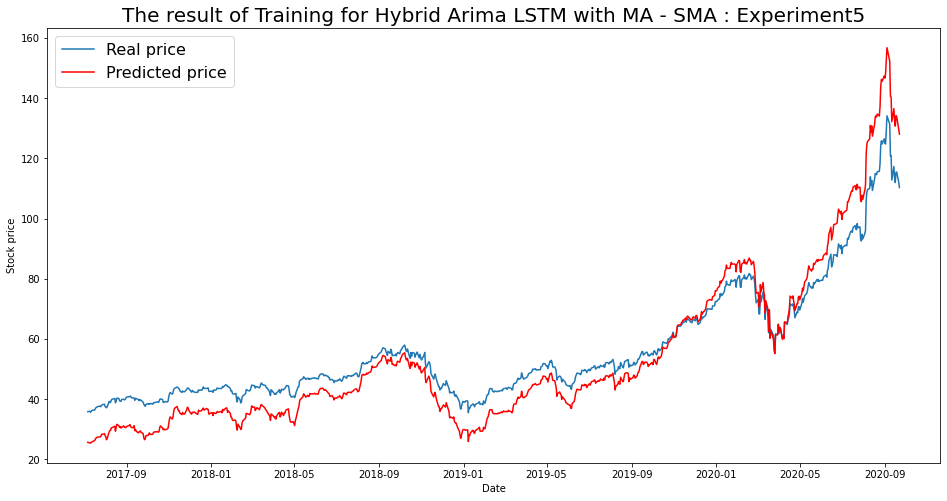

----- Train RMSE for SMA ----- 7.636357212019493
----- Train_MSE_LSTM for SMA ----- 58.31395146956212
----- Train MAE LSTM for SMA ----- 6.563417649903971


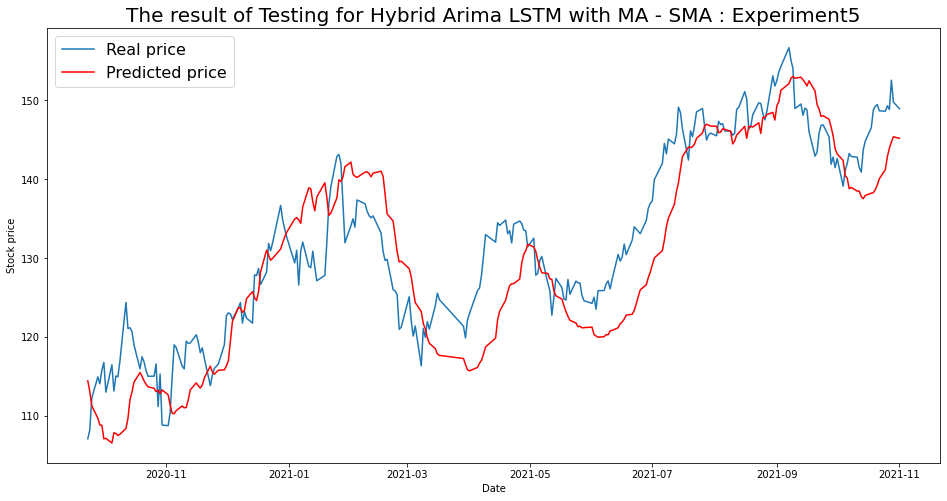

----- Test RMSE for SMA----- 5.864443490053761
----- Test_MSE_LSTM for SMA----- 34.39169744803393
----- Test_MAE_LSTM for SMA----- 4.893666026892695


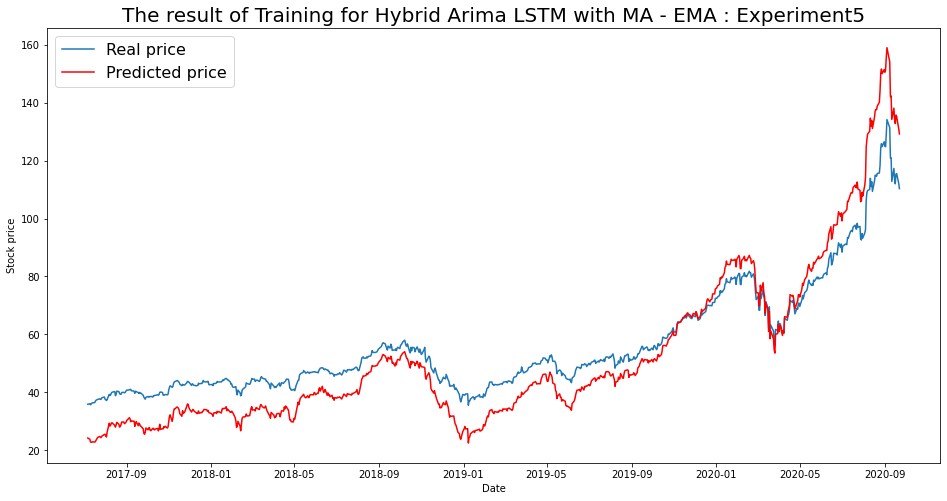

----- Train RMSE for EMA ----- 9.308960691198413
----- Train_MSE_LSTM for EMA ----- 86.65674915027724
----- Train MAE LSTM for EMA ----- 8.140100172619418


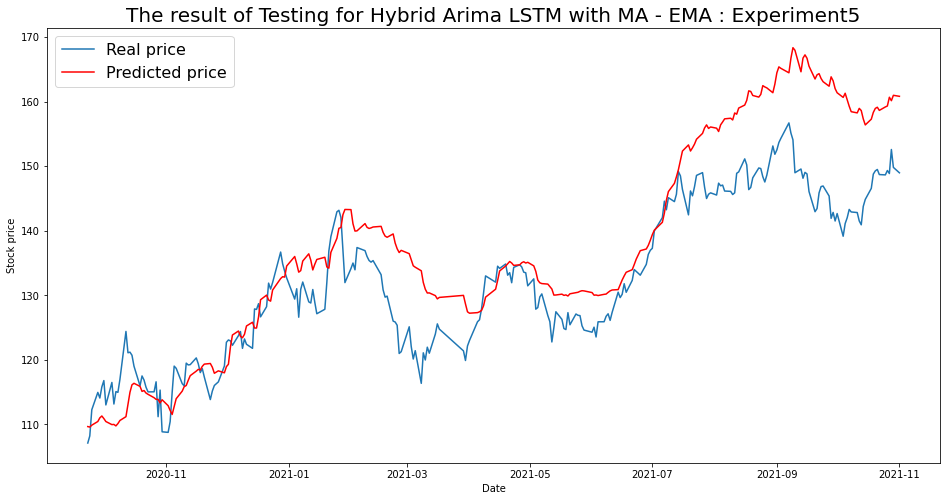

----- Test RMSE for EMA----- 8.546888359213506
----- Test_MSE_LSTM for EMA----- 73.04930062485933
----- Test_MAE_LSTM for EMA----- 6.613879572809731


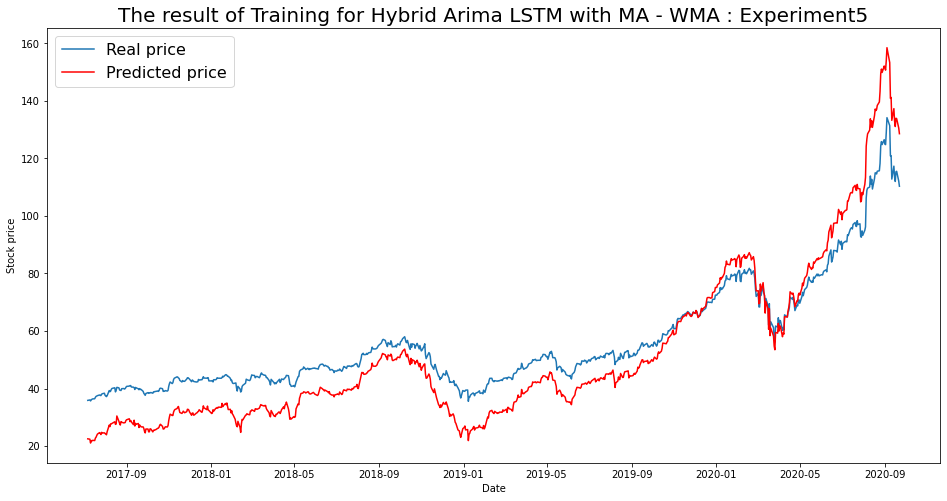

----- Train RMSE for WMA ----- 9.79972862979708
----- Train_MSE_LSTM for WMA ----- 96.03468121766456
----- Train MAE LSTM for WMA ----- 8.675562439114087


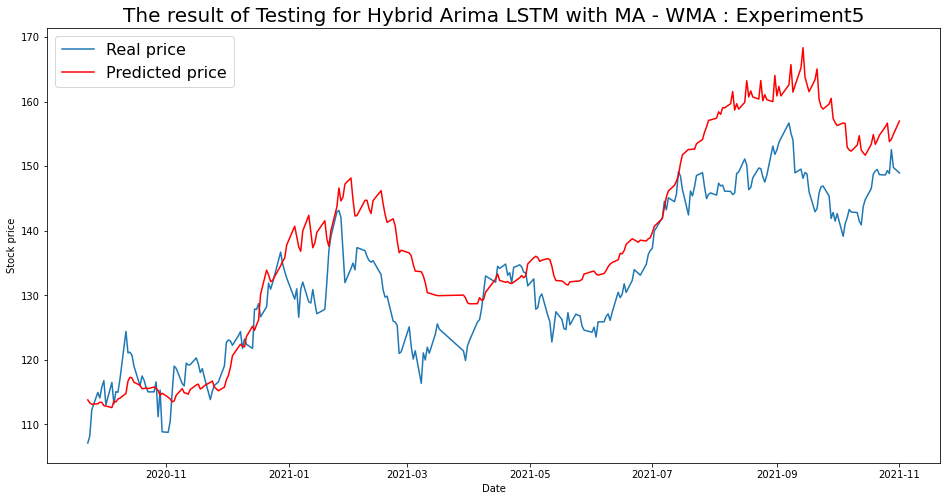

----- Test RMSE for WMA----- 8.387715385039114
----- Test_MSE_LSTM for WMA----- 70.35376938042184
----- Test_MAE_LSTM for WMA----- 6.8547592718484545


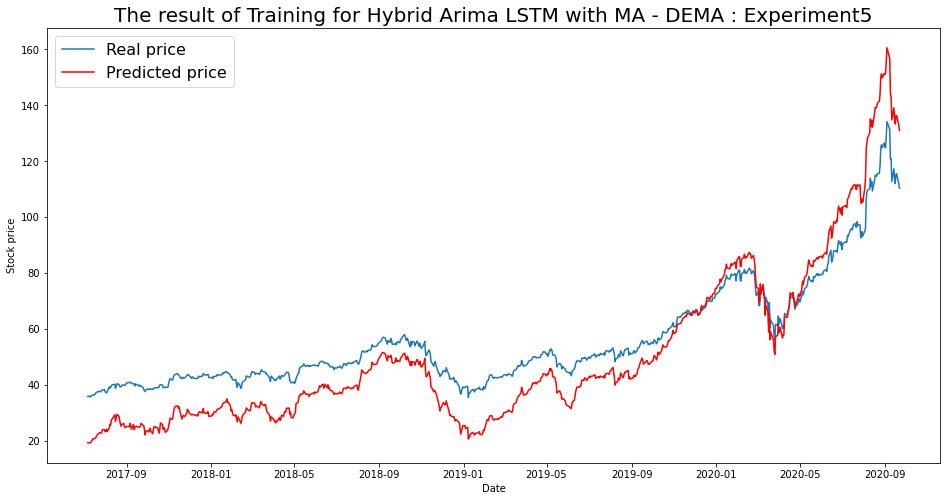

----- Train RMSE for DEMA ----- 11.043189962759177
----- Train_MSE_LSTM for DEMA ----- 121.95204455358504
----- Train MAE LSTM for DEMA ----- 9.832117659380973


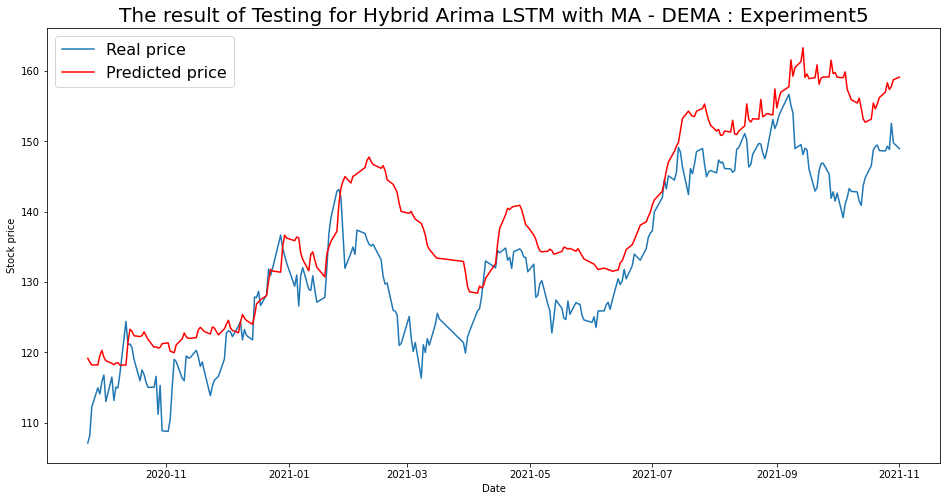

----- Test RMSE for DEMA----- 8.381384847505505
----- Test_MSE_LSTM for DEMA----- 70.24761196199488
----- Test_MAE_LSTM for DEMA----- 6.862692730259403


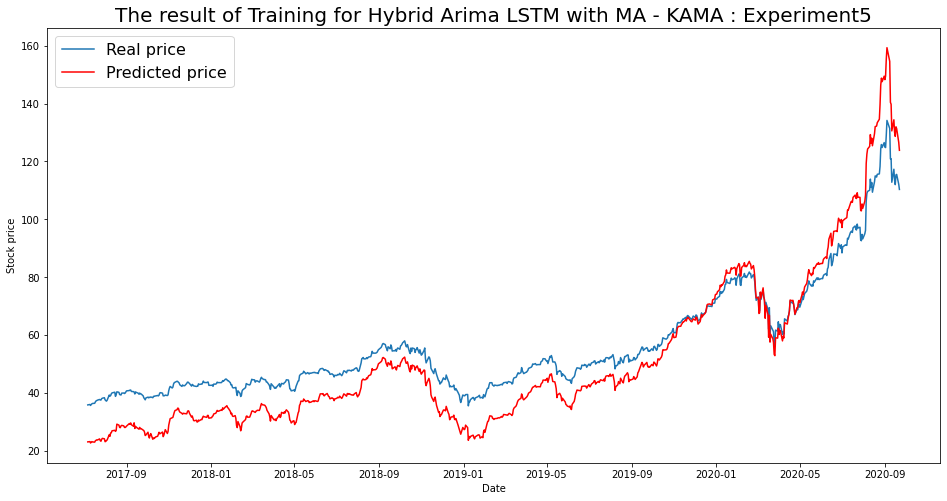

----- Train RMSE for KAMA ----- 9.344372249039948
----- Train_MSE_LSTM for KAMA ----- 87.3172927286279
----- Train MAE LSTM for KAMA ----- 8.318259338837343


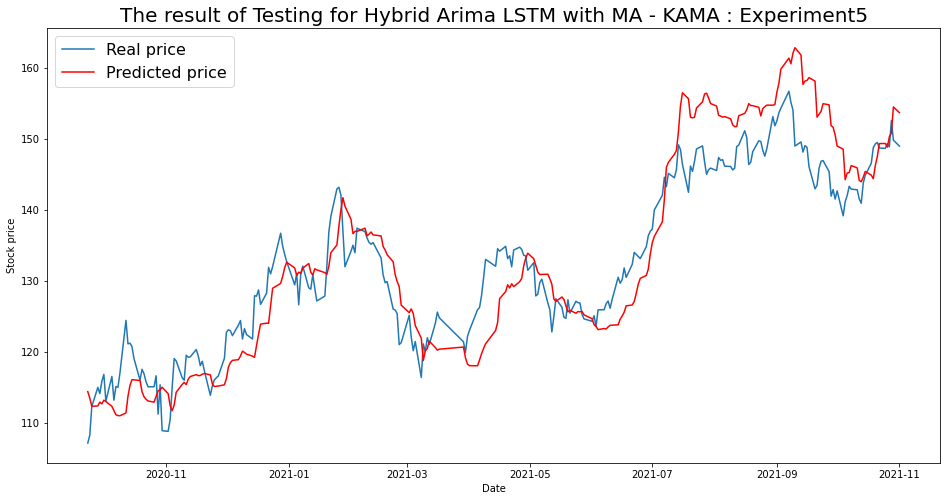

----- Test RMSE for KAMA----- 5.1975067685677505
----- Test_MSE_LSTM for KAMA----- 27.01407660930758
----- Test_MAE_LSTM for KAMA----- 4.263533603346384


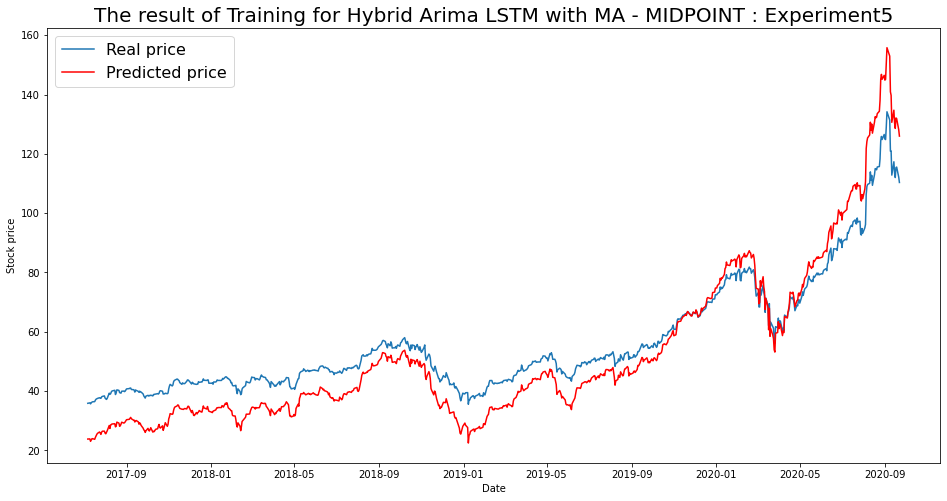

----- Train RMSE for MIDPOINT ----- 8.517306058165431
----- Train_MSE_LSTM for MIDPOINT ----- 72.54450248846156
----- Train MAE LSTM for MIDPOINT ----- 7.583730384747793


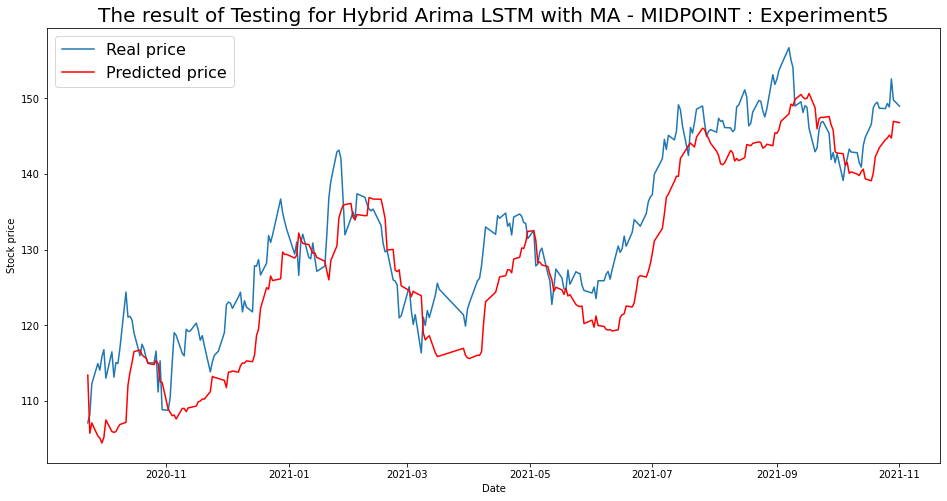

----- Test RMSE for MIDPOINT----- 6.095963250969029
----- Test_MSE_LSTM for MIDPOINT----- 37.16076795716489
----- Test_MAE_LSTM for MIDPOINT----- 5.0853544537748006


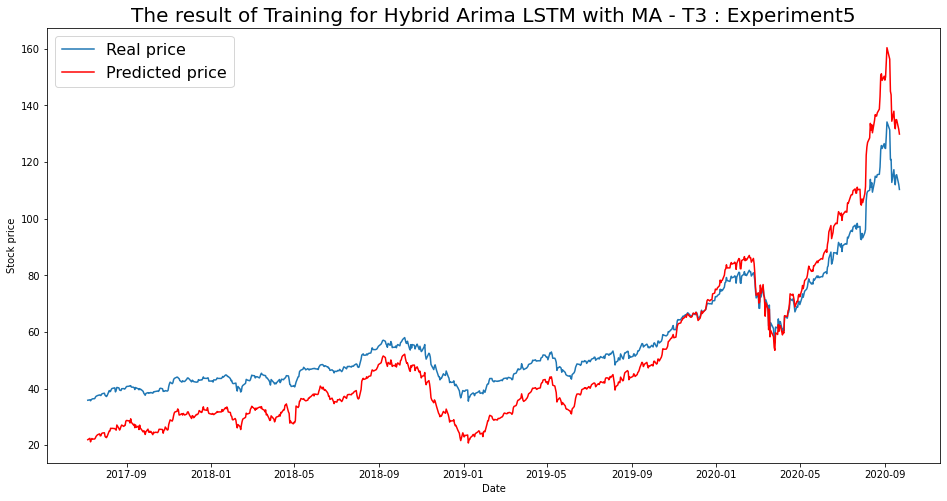

----- Train RMSE for T3 ----- 10.856747466888622
----- Train_MSE_LSTM for T3 ----- 117.86896555979253
----- Train MAE LSTM for T3 ----- 9.766406240784287


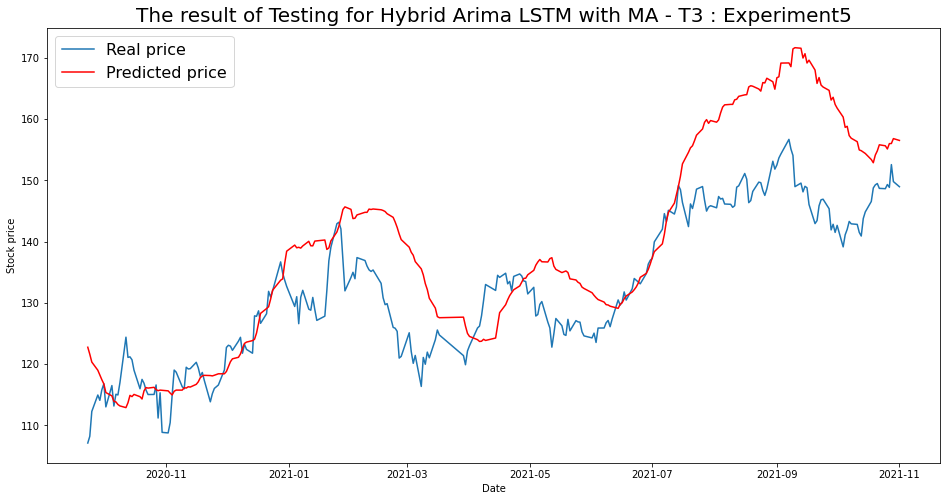

----- Test RMSE for T3----- 10.222137409909903
----- Test_MSE_LSTM for T3----- 104.49209322707955
----- Test_MAE_LSTM for T3----- 7.958642954509092


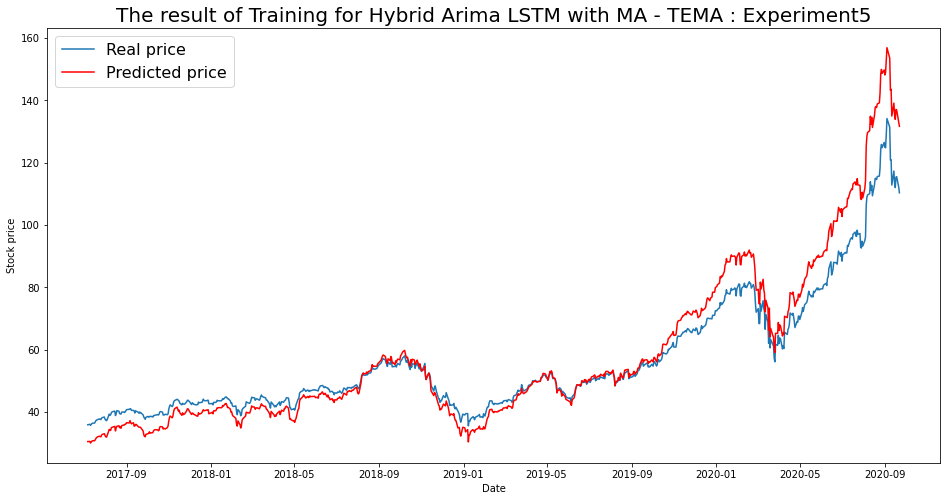

----- Train RMSE for TEMA ----- 6.927888385272954
----- Train_MSE_LSTM for TEMA ----- 47.9956374787999
----- Train MAE LSTM for TEMA ----- 4.706679976581726


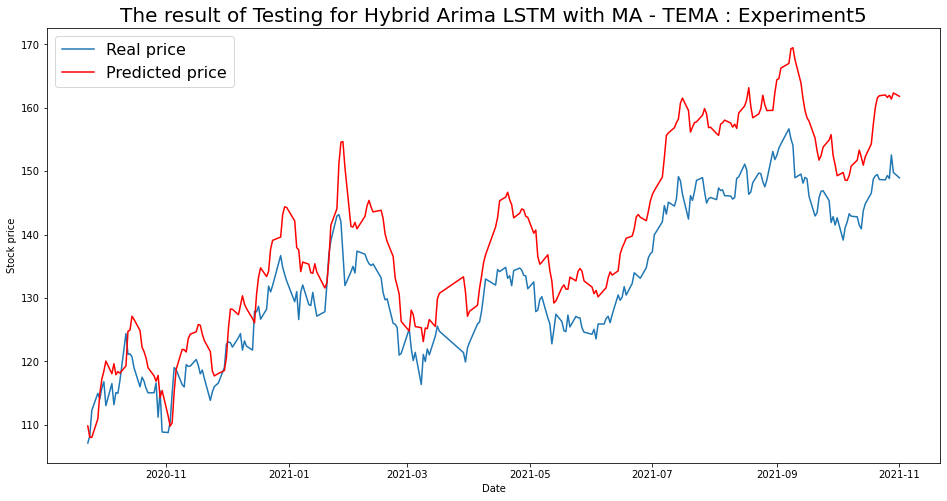

----- Test RMSE for TEMA----- 8.532457761788397
----- Test_MSE_LSTM for TEMA----- 72.80283545670305
----- Test_MAE_LSTM for TEMA----- 7.653550657820228


In [125]:
for i in range(len(list(simulation5.keys()))):
  SIM = list(simulation5.keys())[i]
  plot_train(simulation5,SIM)
  plot_test(simulation5,SIM)

## Arima w Exogenous Variable Multistep MutiVariate LSTM Hybrid Model Experiment 6

In [121]:
def get_arima_exog(dataframe,original_data, train_len, test_len):    
    

    # prepare train and test data for exogenous vr
    X_value = pd.DataFrame(low_vol.iloc[:, :])
    y_value = pd.DataFrame(low_vol.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    X_scale_dataset = X_scaler.fit_transform(X_value)
    y_scale_dataset = y_scaler.fit_transform(y_value)
    # Get data and check shape
    # X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X_scale_dataset)
    y_train, y_test, = split_train_test(y_scale_dataset)
    yc_train,yc_test = split_train_test(low_vol_data)
    yc = yc_test.values.tolist()
    y_train_list = y_train.flatten().tolist()
    y_test_list = y_test.flatten().tolist()
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

    # Initialize model
    model = auto_arima(y_train_list,exogenous  = X_train,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
            suppress_warnings=True,stepwise=True,seasonal=True)

      # Determine model parameters
    print(model.summary())
    model.fit(y_train_list,maxiter=200)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

      # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
        model = pmdarima.ARIMA(order=order)
        model.fit(y_train_list)
        # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')

        prediction.append(model.predict()[0])
        y_train_list.append(y_test_list[i])

    predictionte = y_scaler.inverse_transform(np.array(prediction).reshape(-1,1))
    y_test_ = y_scaler.inverse_transform(np.array(y_test_list).reshape(-1,1))

    # Generate error data
    mse = mean_squared_error(yc_test, predictionte)
    rmse = mse ** 0.5
    mae = mean_absolute_error(y_test_ , predictionte )
    return yc,predictionte.flatten().tolist(), mse, rmse, mae

In [122]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det =20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()


    # # option 2
    model = Sequential()
    model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    model.add(Dense(64))
    model.add(Dense(units=output_dim))
    model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM6.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()

    # Option 3
    # define custom activation
    # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16989.787, Time=3.67 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14558.588, Time=5.52 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-14596.280, Time=5.65 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14556.588, Time=8.39 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16924.805, Time=10.47 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-14482.349, Time=11.23 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-17215.608, Time=20.61 sec
 ARIMA(0,3,3)(0,0,0)[0]             : AIC=-14552.588, Time=10.76 sec
 ARIMA(1,3,3)(0,0,0)[0]             : AIC=-15570.350, Time=19.25 sec
 ARIMA(0,3,2)(0,0,0)[0] intercept   : AIC=-11671.292, Time=28.75 sec

Best model:  ARIMA(0,3,2)(0,0,0)[0]          
T

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.04685, saving model to LSTM6.h5
48/48 - 3s - loss: 0.1506 - accuracy: 0.0000e+00 - val_loss: 0.0468 - val_accuracy: 0.0037 - lr: 0.0010 - 3s/epoch - 71ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.04685 to 0.00855, saving model to LSTM6.h5
48/48 - 0s - loss: 0.0267 - accuracy: 0.0000e+00 - val_loss: 0.0085 - val_accuracy: 0.0037 - lr: 0.0010 - 291ms/epoch - 6ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.00855
48/48 - 0s - loss: 0.0284 - accuracy: 0.0000e+00 - val_loss: 0.0544 - val_accuracy: 0.0037 - lr: 0.0010 - 249ms/epoch - 5ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.00855
48/48 - 0s - loss: 0.0260 - accuracy: 0.0000e+00 - val_loss: 0.0121 - val_accuracy: 0.0037 - lr: 0.0010 - 273ms/epoch - 6ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00855
48/48 - 0s - loss: 0.0112 - accuracy: 0.0000e+00 - val_loss: 0.0529 - val_accuracy: 0.0037 - lr: 0.0010 - 283m

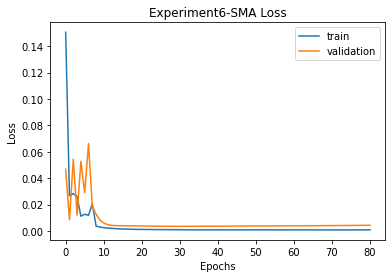


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 75.03401716737034 
RMSE:	 8.662217797271685 
MAPE:	 7.077228582293258
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16989.778, Time=3.45 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14558.587, Time=5.48 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15952.568, Time=15.38 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14556.587, Time=8.39 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16628.634, Time=10.82 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-16462.206, Time=25.75 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-16848.298, Time=13.21 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-17014.023, Time=6.97 sec
 ARIMA(3,3,0)(0,0,0)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16987.994, Time=4.30 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16982.667, Time=4.98 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 129.764 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.727
Date:                Sun, 12 Dec 2021   AIC                         -17071.454
Time:                        17:17:37   BIC                         -16911.966
Sample:                             0   HQIC                        -17010.204
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.00799, saving model to LSTM6.h5
16/16 - 3s - loss: 0.0776 - accuracy: 0.0000e+00 - val_loss: 0.0080 - val_accuracy: 0.0037 - lr: 0.0010 - 3s/epoch - 218ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.00799
16/16 - 0s - loss: 0.0318 - accuracy: 0.0000e+00 - val_loss: 0.1262 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 100ms/epoch - 6ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.00799
16/16 - 0s - loss: 0.0517 - accuracy: 0.0000e+00 - val_loss: 0.0132 - val_accuracy: 0.0037 - lr: 0.0010 - 113ms/epoch - 7ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.00799 to 0.00501, saving model to LSTM6.h5
16/16 - 0s - loss: 0.0237 - accuracy: 0.0000e+00 - val_loss: 0.0050 - val_accuracy: 0.0037 - lr: 0.0010 - 135ms/epoch - 8ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00501
16/16 - 0s - loss: 0.0243 - accuracy: 0.0000e+00 - val_loss: 0.0101 - val_accuracy: 0.0037 - lr: 0.0010 -

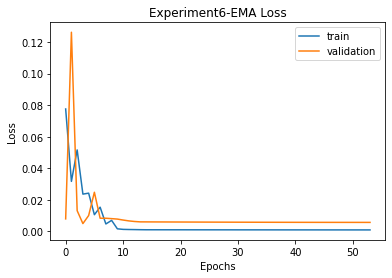


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 75.03401716737034 
RMSE:	 8.662217797271685 
MAPE:	 7.077228582293258

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 70.28436187942754 
RMSE:	 8.383576914386099 
MAPE:	 6.876111393338704
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16989.778, Time=3.57 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14558.587, Time=5.37 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-14597.576, Time=5.63 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14556.587, Time=8.21 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15338.693, Time=11.46 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-15153.472, Time=27.75 sec


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.12839, saving model to LSTM6.h5
17/17 - 4s - loss: 0.1323 - accuracy: 0.0000e+00 - val_loss: 0.1284 - val_accuracy: 0.0037 - lr: 0.0010 - 4s/epoch - 231ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.12839 to 0.10391, saving model to LSTM6.h5
17/17 - 0s - loss: 0.0454 - accuracy: 0.0000e+00 - val_loss: 0.1039 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 146ms/epoch - 9ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.10391 to 0.00557, saving model to LSTM6.h5
17/17 - 0s - loss: 0.0245 - accuracy: 0.0000e+00 - val_loss: 0.0056 - val_accuracy: 0.0037 - lr: 0.0010 - 144ms/epoch - 8ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.00557
17/17 - 0s - loss: 0.0150 - accuracy: 0.0000e+00 - val_loss: 0.0089 - val_accuracy: 0.0037 - lr: 0.0010 - 106ms/epoch - 6ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00557
17/17 - 0s - loss: 0.0242 - accuracy: 0.0000e+00 - val_loss: 0.0156 - val_a

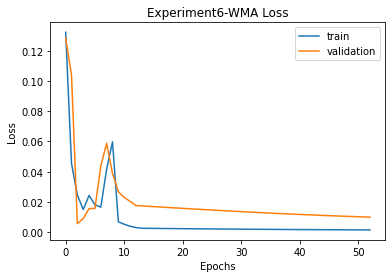


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 75.03401716737034 
RMSE:	 8.662217797271685 
MAPE:	 7.077228582293258

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 70.28436187942754 
RMSE:	 8.383576914386099 
MAPE:	 6.876111393338704

WMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 70.57086226636761 
RMSE:	 8.400646538592587 
MAPE:	 6.6664001460728475
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16989.776, Time=3.85 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14558.586, Time=5.60 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16271.755, Time=7.45 sec
 ARIMA(0,3,1)(0,0,0)[0]        

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16987.981, Time=4.57 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16982.666, Time=5.26 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 122.542 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.727
Date:                Sun, 12 Dec 2021   AIC                         -17071.454
Time:                        17:35:26   BIC                         -16911.965
Sample:                             0   HQIC                        -17010.203
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.02054, saving model to LSTM6.h5
10/10 - 4s - loss: 0.2598 - accuracy: 0.0000e+00 - val_loss: 0.0205 - val_accuracy: 0.0037 - lr: 0.0010 - 4s/epoch - 394ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.02054
10/10 - 0s - loss: 0.1598 - accuracy: 0.0000e+00 - val_loss: 0.0390 - val_accuracy: 0.0037 - lr: 0.0010 - 85ms/epoch - 9ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.02054 to 0.01761, saving model to LSTM6.h5
10/10 - 0s - loss: 0.1513 - accuracy: 0.0000e+00 - val_loss: 0.0176 - val_accuracy: 0.0037 - lr: 0.0010 - 125ms/epoch - 13ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.01761 to 0.00421, saving model to LSTM6.h5
10/10 - 0s - loss: 0.0546 - accuracy: 0.0000e+00 - val_loss: 0.0042 - val_accuracy: 0.0037 - lr: 0.0010 - 123ms/epoch - 12ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00421
10/10 - 0s - loss: 0.0137 - accuracy: 0.0000e+00 - val_loss: 0.0105 - val_accu

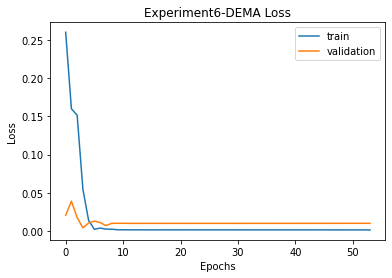


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 75.03401716737034 
RMSE:	 8.662217797271685 
MAPE:	 7.077228582293258

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 70.28436187942754 
RMSE:	 8.383576914386099 
MAPE:	 6.876111393338704

WMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 70.57086226636761 
RMSE:	 8.400646538592587 
MAPE:	 6.6664001460728475

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 329.6035699397079 
RMSE:	 18.15498746735199 
MAPE:	 16.799244301034683
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16989.104, Time=4.07 sec
 ARIMA(

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/mlemodel.py:2968: RuntimeWarning: divide by zero encountered in true_divide
  return self.params / self.bse


ARIMA order: (2, 3, 0) 



/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.03815, saving model to LSTM6.h5
45/45 - 4s - loss: 0.1761 - accuracy: 0.0000e+00 - val_loss: 0.0382 - val_accuracy: 0.0037 - lr: 0.0010 - 4s/epoch - 94ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.03815 to 0.00774, saving model to LSTM6.h5
45/45 - 0s - loss: 0.0287 - accuracy: 0.0000e+00 - val_loss: 0.0077 - val_accuracy: 0.0037 - lr: 0.0010 - 275ms/epoch - 6ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.00774
45/45 - 0s - loss: 0.0239 - accuracy: 0.0000e+00 - val_loss: 0.0861 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 264ms/epoch - 6ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.00774
45/45 - 0s - loss: 0.0472 - accuracy: 0.0000e+00 - val_loss: 0.0105 - val_accuracy: 0.0037 - lr: 0.0010 - 292ms/epoch - 6ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00774
45/45 - 0s - loss: 0.0134 - accuracy: 0.0000e+00 - val_loss: 0.0643 - val_accuracy: 0.0037 - lr: 0.0010 - 

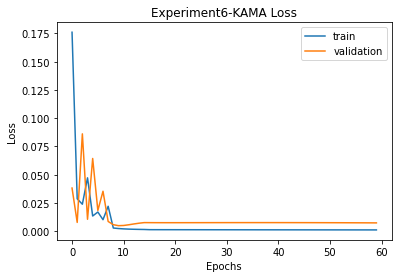


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 75.03401716737034 
RMSE:	 8.662217797271685 
MAPE:	 7.077228582293258

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 70.28436187942754 
RMSE:	 8.383576914386099 
MAPE:	 6.876111393338704

WMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 70.57086226636761 
RMSE:	 8.400646538592587 
MAPE:	 6.6664001460728475

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 329.6035699397079 
RMSE:	 18.15498746735199 
MAPE:	 16.799244301034683

KAMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 103.27437965196852 
RMSE:	 10.162400289890599 
MAPE:	 8.510636158449836
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on M

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.03989, saving model to LSTM6.h5
58/58 - 4s - loss: 0.2600 - accuracy: 0.0000e+00 - val_loss: 0.0399 - val_accuracy: 0.0037 - lr: 0.0010 - 4s/epoch - 65ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.03989 to 0.00457, saving model to LSTM6.h5
58/58 - 0s - loss: 0.0229 - accuracy: 0.0000e+00 - val_loss: 0.0046 - val_accuracy: 0.0037 - lr: 0.0010 - 370ms/epoch - 6ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.00457
58/58 - 0s - loss: 0.0133 - accuracy: 0.0000e+00 - val_loss: 0.0159 - val_accuracy: 0.0037 - lr: 0.0010 - 353ms/epoch - 6ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.00457
58/58 - 0s - loss: 0.0097 - accuracy: 0.0000e+00 - val_loss: 0.0052 - val_accuracy: 0.0037 - lr: 0.0010 - 341ms/epoch - 6ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00457
58/58 - 0s - loss: 0.0044 - accuracy: 0.0000e+00 - val_loss: 0.0100 - val_accuracy: 0.0037 - lr: 0.0010 - 343m

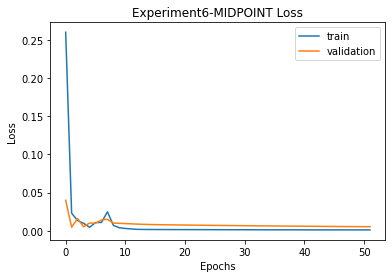


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 75.03401716737034 
RMSE:	 8.662217797271685 
MAPE:	 7.077228582293258

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 70.28436187942754 
RMSE:	 8.383576914386099 
MAPE:	 6.876111393338704

WMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 70.57086226636761 
RMSE:	 8.400646538592587 
MAPE:	 6.6664001460728475

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 329.6035699397079 
RMSE:	 18.15498746735199 
MAPE:	 16.799244301034683

KAMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 103.27437965196852 
RMSE:	 10.162400289890599 
MAPE:	 8.510636158449836

MIDPOINT
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 97.31838139819504 
RMSE:	 9.86500792692003 
MAPE:	 8.251875922025462
T3
T3([input_arrays], [ti

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.02365, saving model to LSTM6.h5
43/43 - 4s - loss: 0.1736 - accuracy: 0.0000e+00 - val_loss: 0.0236 - val_accuracy: 0.0037 - lr: 0.0010 - 4s/epoch - 87ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.02365 to 0.01039, saving model to LSTM6.h5
43/43 - 0s - loss: 0.0498 - accuracy: 0.0000e+00 - val_loss: 0.0104 - val_accuracy: 0.0037 - lr: 0.0010 - 297ms/epoch - 7ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.01039
43/43 - 0s - loss: 0.0484 - accuracy: 0.0000e+00 - val_loss: 0.0776 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 273ms/epoch - 6ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.01039
43/43 - 0s - loss: 0.0526 - accuracy: 0.0000e+00 - val_loss: 0.0138 - val_accuracy: 0.0037 - lr: 0.0010 - 299ms/epoch - 7ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.01039
43/43 - 0s - loss: 0.0314 - accuracy: 0.0000e+00 - val_loss: 0.2012 - val_accuracy: 0.0000e+00 - lr: 0.001

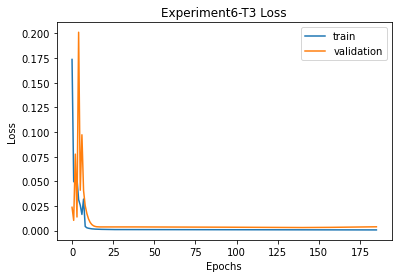


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 75.03401716737034 
RMSE:	 8.662217797271685 
MAPE:	 7.077228582293258

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 70.28436187942754 
RMSE:	 8.383576914386099 
MAPE:	 6.876111393338704

WMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 70.57086226636761 
RMSE:	 8.400646538592587 
MAPE:	 6.6664001460728475

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 329.6035699397079 
RMSE:	 18.15498746735199 
MAPE:	 16.799244301034683

KAMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 103.27437965196852 
RMSE:	 10.162400289890599 
MAPE:	 8.510636158449836

MIDPOINT
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 97.31838139819504 
RMSE:	 9.86500792692003 
MAPE:	 8.251875922025462

T3
Prediction vs Close:	

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.09728, saving model to LSTM6.h5
90/90 - 4s - loss: 0.1306 - accuracy: 0.0000e+00 - val_loss: 0.0973 - val_accuracy: 0.0037 - lr: 0.0010 - 4s/epoch - 48ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.09728 to 0.01880, saving model to LSTM6.h5
90/90 - 1s - loss: 0.1590 - accuracy: 0.0000e+00 - val_loss: 0.0188 - val_accuracy: 0.0037 - lr: 0.0010 - 513ms/epoch - 6ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.01880
90/90 - 1s - loss: 0.0262 - accuracy: 0.0000e+00 - val_loss: 0.0237 - val_accuracy: 0.0037 - lr: 0.0010 - 514ms/epoch - 6ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.01880
90/90 - 0s - loss: 0.0257 - accuracy: 0.0000e+00 - val_loss: 0.0481 - val_accuracy: 0.0037 - lr: 0.0010 - 479ms/epoch - 5ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.01880 to 0.01832, saving model to LSTM6.h5
90/90 - 1s - loss: 0.0182 - accuracy: 0.0000e+00 - val_loss: 0.0183 - val_accura

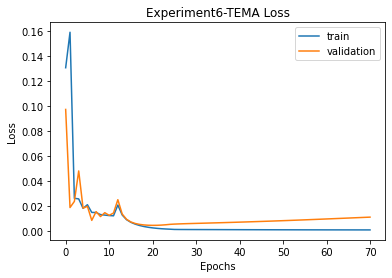


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 75.03401716737034 
RMSE:	 8.662217797271685 
MAPE:	 7.077228582293258

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 70.28436187942754 
RMSE:	 8.383576914386099 
MAPE:	 6.876111393338704

WMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 70.57086226636761 
RMSE:	 8.400646538592587 
MAPE:	 6.6664001460728475

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 329.6035699397079 
RMSE:	 18.15498746735199 
MAPE:	 16.799244301034683

KAMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 103.27437965196852 
RMSE:	 10.162400289890599 
MAPE:	 8.510636158449836

MIDPOINT
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 97.31838139819504 
RMSE:	 9.86500792692003 
MAPE:	 8.251875922025462

T3
Prediction vs Close:	

In [123]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation6 = {}
    imgfile = 'Experiment6'
    for ma in optimized_period:
                print(ma)
                print(functions[ma])
                print ( int( optimized_period[ma]))
              # if ma == 'SMA':
                low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
                low_vol = low_vol.fillna(0)
                low_vol_data = df['close']
                high_vol = pd.DataFrame()
                df2 = df.copy()
                for i in df2.columns:
                  if i in low_vol.columns:
                    high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
                high_vol_data = df['close']
                ## *****************************************************
                # Generate ARIMA and LSTM predictions
                print('\nWorking on ' + ma + ' predictions')
                try:
                  print('parameters used : ', train_len, test_len)
                  low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima_exog(low_vol,low_vol_data, train_len, test_len)
                except:
                    print('ARIMA error, skipping to next MA type')
                    continue
                Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
                final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
                mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
                rmse_ftr = mse_ftr ** 0.5
                mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
                mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

                final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
                mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
                rmse = mse ** 0.5
                mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                # Generate prediction accuracy
                actual = df['close'].tail(test_len).values
                result_1 = []
                result_2 = []
                for i in range(1, len(final_prediction)):
                    # Compare prediction to previous close price
                    if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                        result_1.append(1)
                    elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                        result_1.append(1)
                    else:
                        result_1.append(0)

                    # Compare prediction to previous prediction
                    if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                        result_2.append(1)
                    elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                        result_2.append(1)
                    else:
                        result_2.append(0)

                accuracy_1 = np.mean(result_1)
                accuracy_2 = np.mean(result_2)

                simulation6[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                              'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                  'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                              'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                  'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                              'rmse': rmse_ftr, 'mae' : mae_ftr},
                                  'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                            'rmse': rmse, 'mae': mae },
                                  'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

                # save simulation data here as checkpoint
                with open('simulation6_data.json', 'w') as fp:
                    json.dump(simulation6, fp)

                for ma in simulation6.keys():
                    print('\n' + ma)
                    print('Prediction vs Close:\t\t' + str(round(100*simulation6[ma]['accuracy']['prediction vs close'], 2))
                          + '% Accuracy')
                    print('Prediction vs Prediction:\t' + str(round(100*simulation6[ma]['accuracy']['prediction vs prediction'], 2))
                          + '% Accuracy')
                    print('MSE:\t', simulation6[ma]['final']['mse'],
                          '\nRMSE:\t', simulation6[ma]['final']['rmse'],
                          '\nMAPE:\t', simulation6[ma]['final']['mae'])#,
                          # '\nMAPE:\t', simulation[ma]['final']['mape'])
              # else:
              #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [124]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment6.png to Experiment6 (1).png


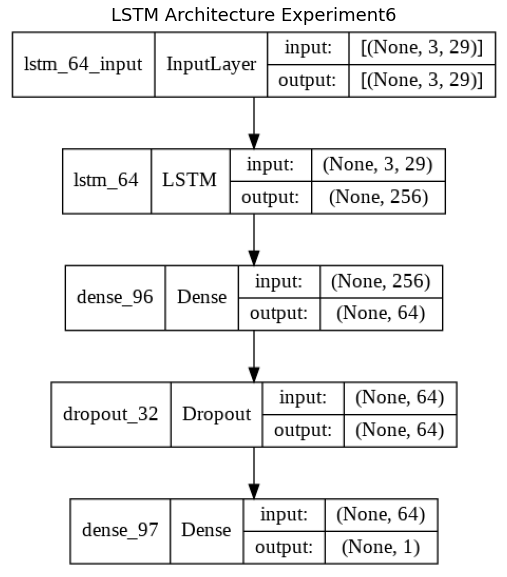

In [125]:
img = cv2.imread('Experiment6.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [126]:
with open('simulation6_data.json') as json_file:
    simulation6 = json.load(json_file)
fileimg = 'Experiment6'

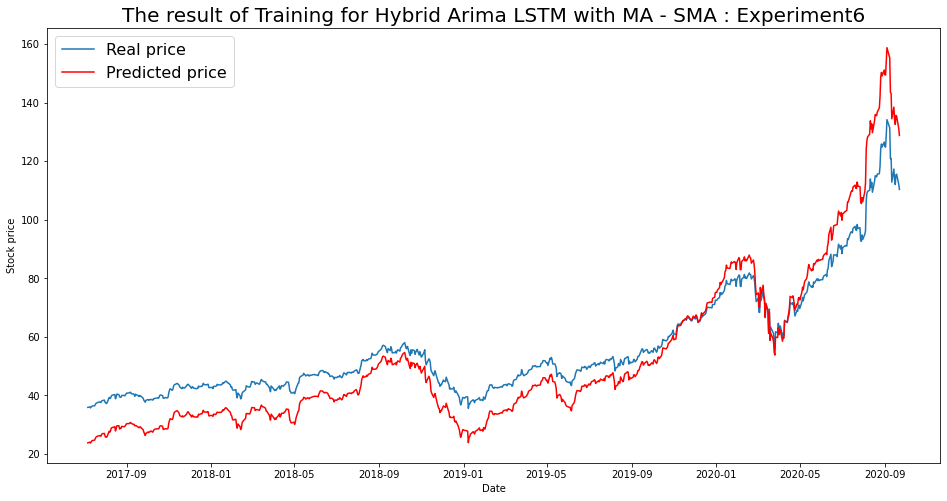

----- Train RMSE for SMA ----- 8.882238711112084
----- Train_MSE_LSTM for SMA ----- 78.89416452117804
----- Train MAE LSTM for SMA ----- 7.762640273567326


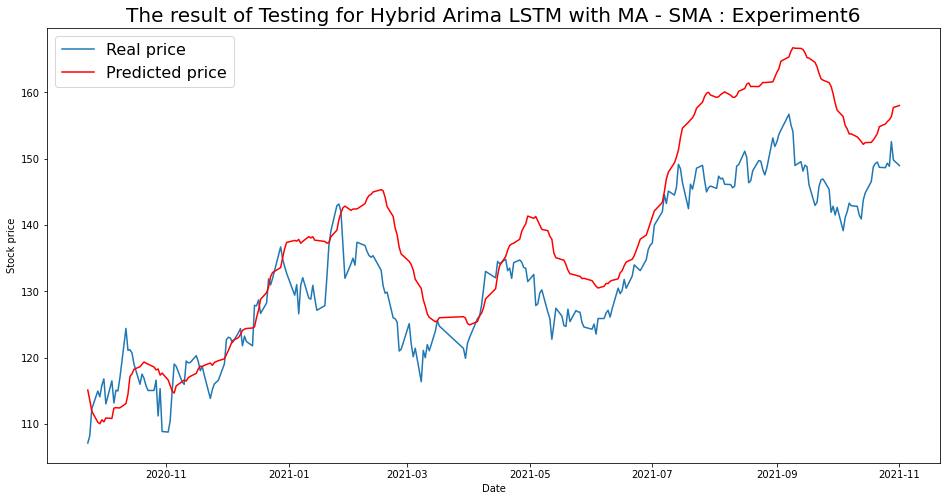

----- Test RMSE for SMA----- 8.662217797271685
----- Test_MSE_LSTM for SMA----- 75.03401716737034
----- Test_MAE_LSTM for SMA----- 7.077228582293258


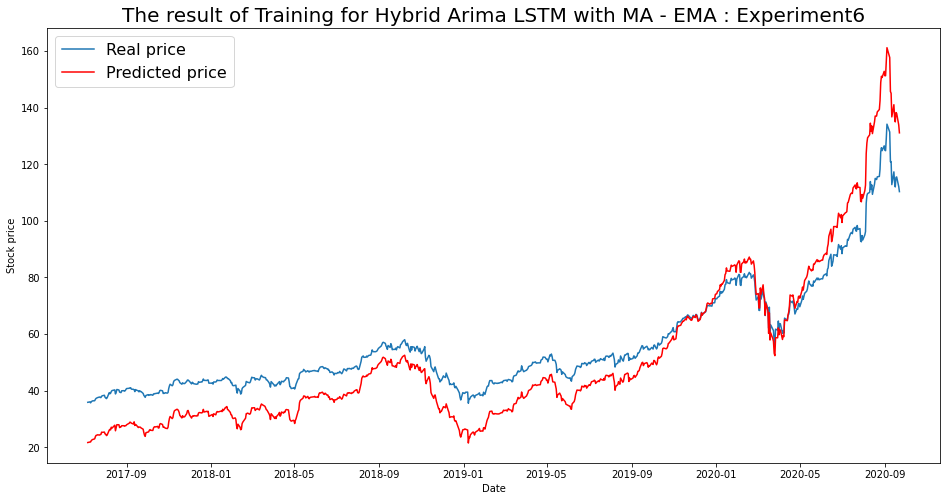

----- Train RMSE for EMA ----- 10.160180455912146
----- Train_MSE_LSTM for EMA ----- 103.22926689669913
----- Train MAE LSTM for EMA ----- 9.005262034617845


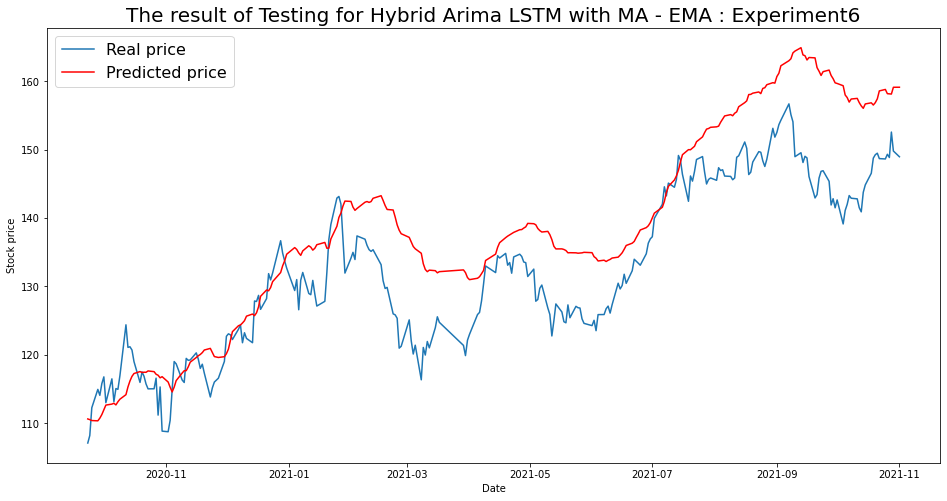

----- Test RMSE for EMA----- 8.383576914386099
----- Test_MSE_LSTM for EMA----- 70.28436187942754
----- Test_MAE_LSTM for EMA----- 6.876111393338704


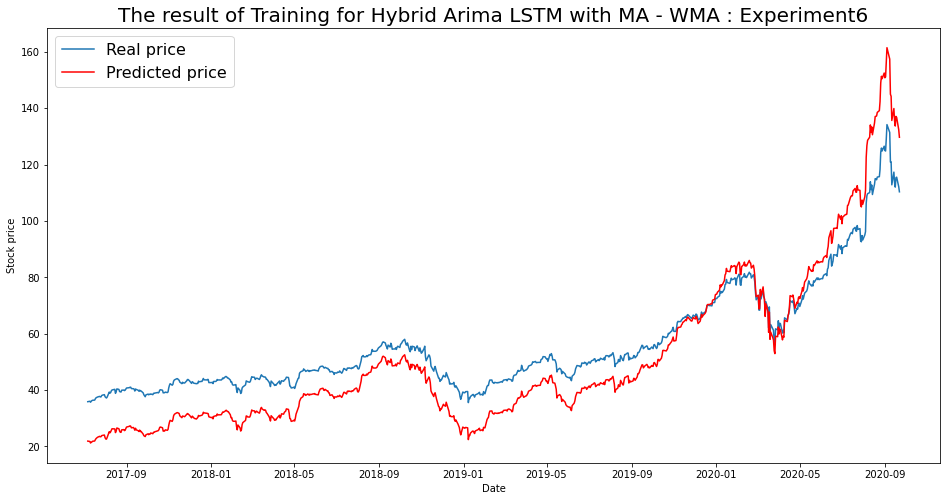

----- Train RMSE for WMA ----- 10.433402093205265
----- Train_MSE_LSTM for WMA ----- 108.85587923850001
----- Train MAE LSTM for WMA ----- 9.27337175169683


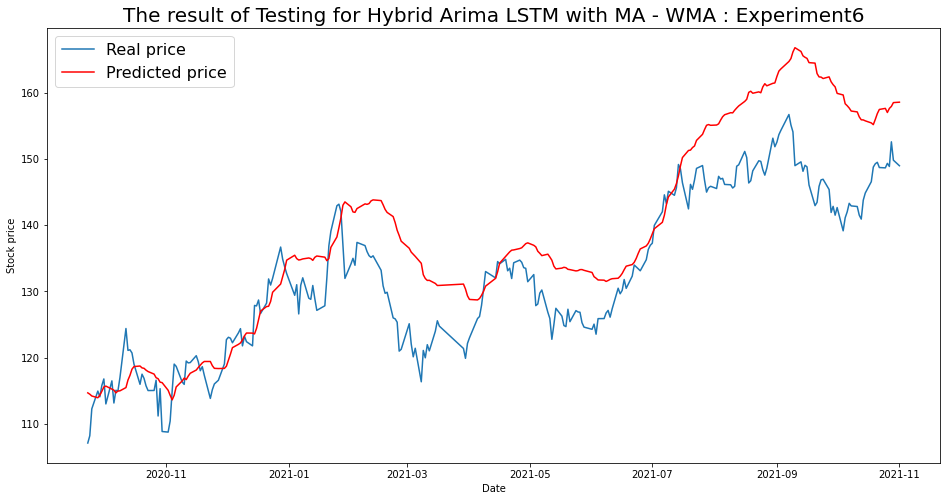

----- Test RMSE for WMA----- 8.400646538592587
----- Test_MSE_LSTM for WMA----- 70.57086226636761
----- Test_MAE_LSTM for WMA----- 6.6664001460728475


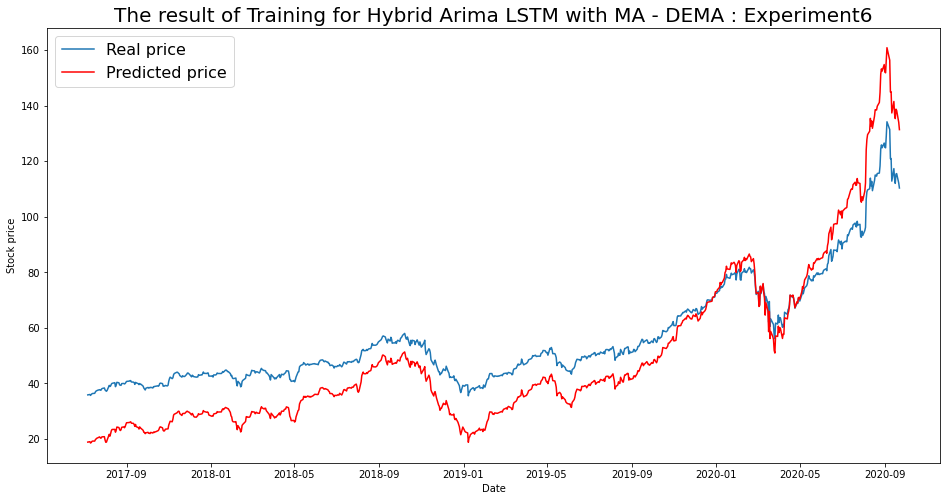

----- Train RMSE for DEMA ----- 12.041548116714113
----- Train_MSE_LSTM for DEMA ----- 144.9988810471412
----- Train MAE LSTM for DEMA ----- 10.79869721264182


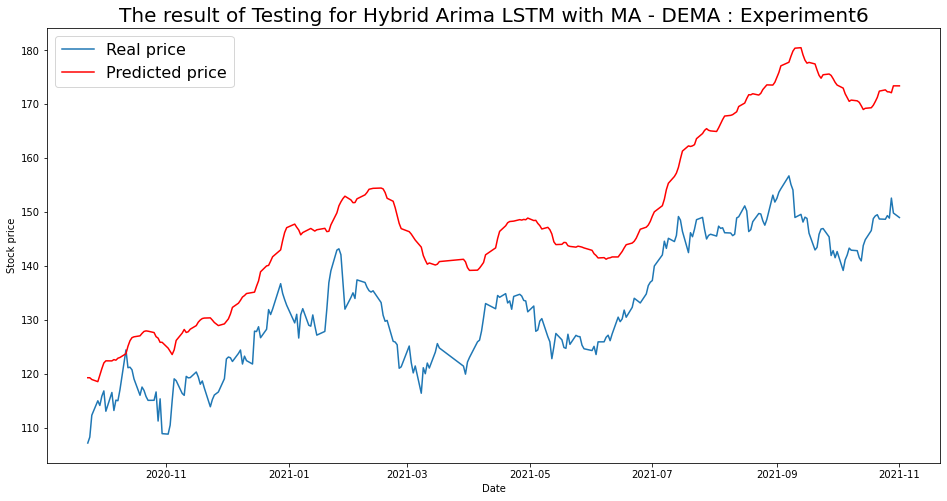

----- Test RMSE for DEMA----- 18.15498746735199
----- Test_MSE_LSTM for DEMA----- 329.6035699397079
----- Test_MAE_LSTM for DEMA----- 16.799244301034683


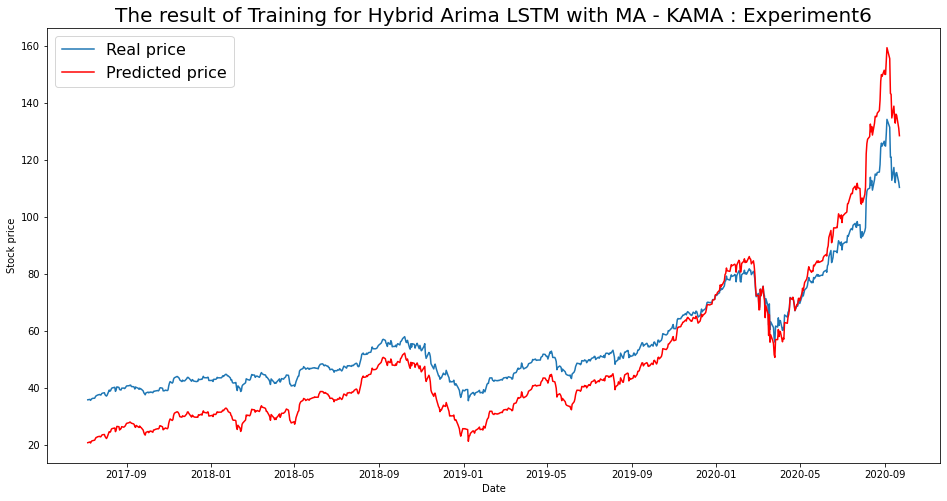

----- Train RMSE for KAMA ----- 10.551998588436238
----- Train_MSE_LSTM for KAMA ----- 111.34467421036034
----- Train MAE LSTM for KAMA ----- 9.496739060524044


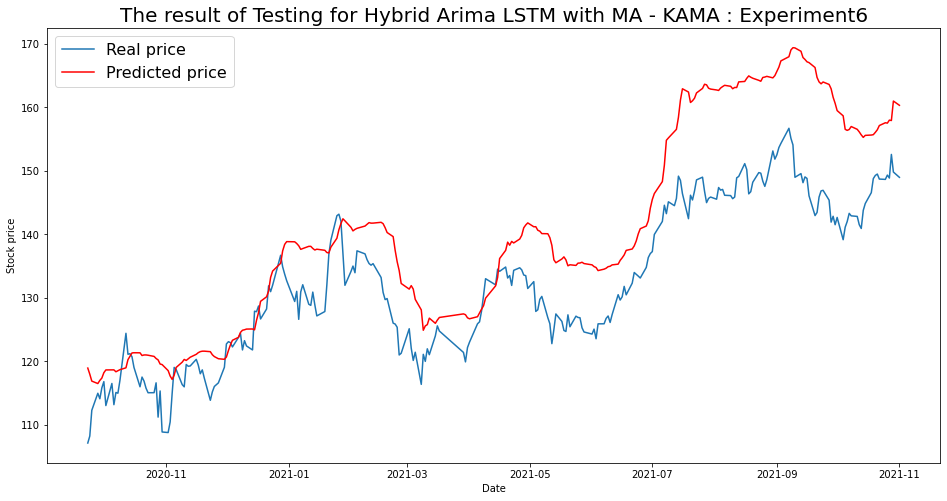

----- Test RMSE for KAMA----- 10.162400289890599
----- Test_MSE_LSTM for KAMA----- 103.27437965196852
----- Test_MAE_LSTM for KAMA----- 8.510636158449836


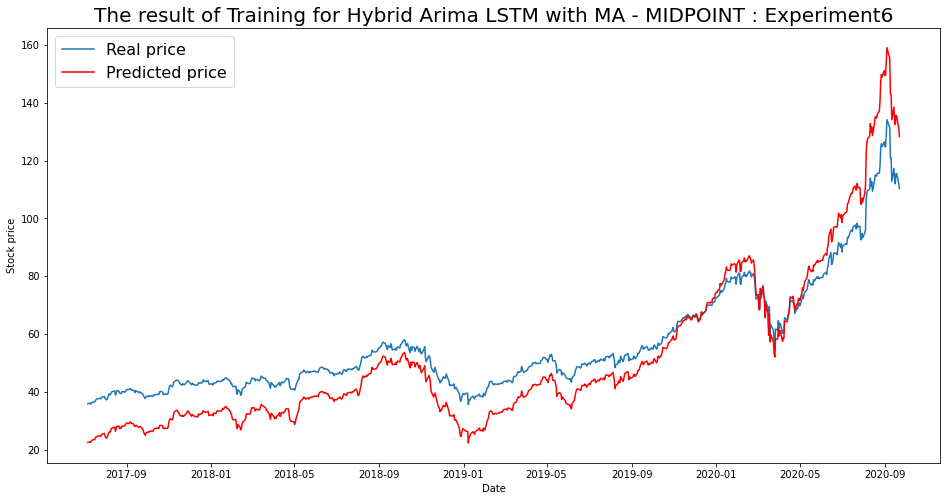

----- Train RMSE for MIDPOINT ----- 9.500193980286314
----- Train_MSE_LSTM for MIDPOINT ----- 90.25368566306832
----- Train MAE LSTM for MIDPOINT ----- 8.42568593891395


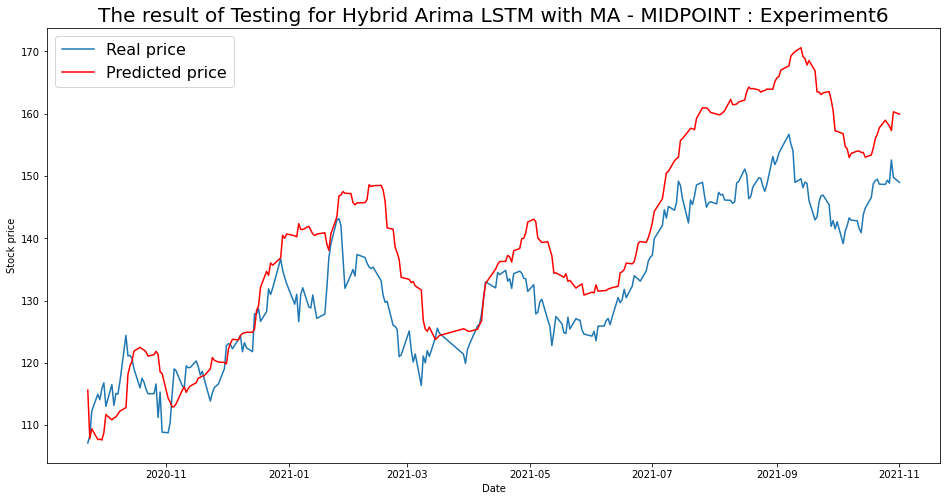

----- Test RMSE for MIDPOINT----- 9.86500792692003
----- Test_MSE_LSTM for MIDPOINT----- 97.31838139819504
----- Test_MAE_LSTM for MIDPOINT----- 8.251875922025462


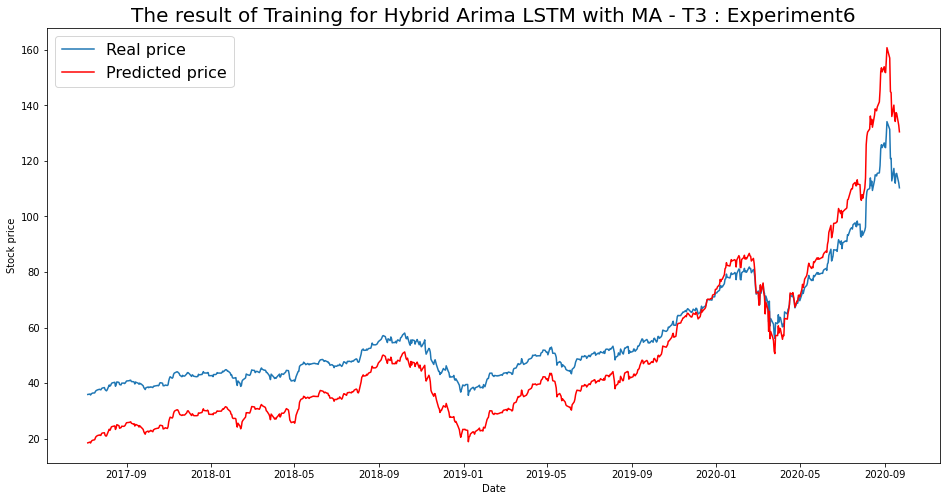

----- Train RMSE for T3 ----- 12.076038211073818
----- Train_MSE_LSTM for T3 ----- 145.83069887531494
----- Train MAE LSTM for T3 ----- 10.880763551400108


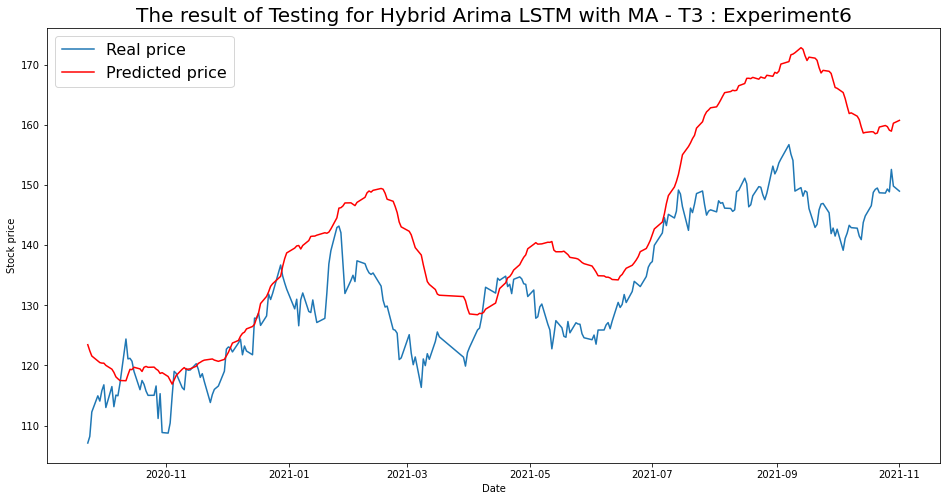

----- Test RMSE for T3----- 12.41667707558134
----- Test_MSE_LSTM for T3----- 154.17386959926716
----- Test_MAE_LSTM for T3----- 10.12780101556255


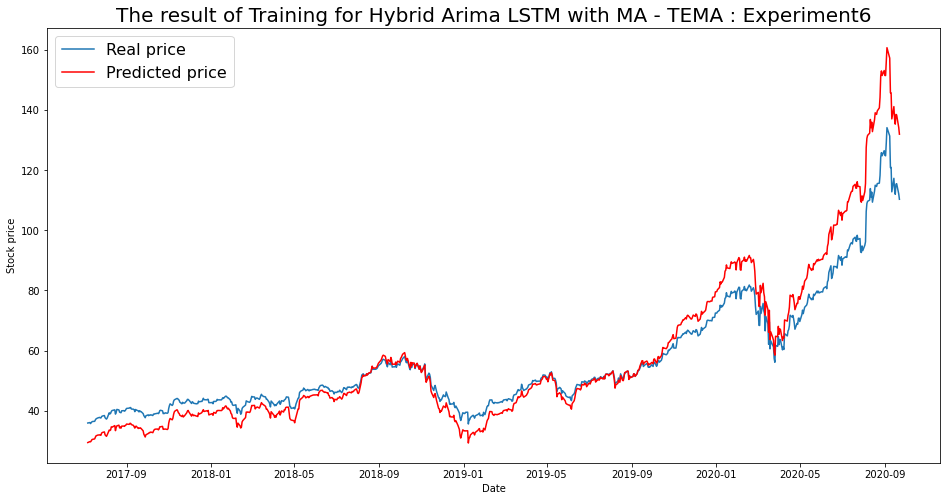

----- Train RMSE for TEMA ----- 7.43933113042144
----- Train_MSE_LSTM for TEMA ----- 55.343647668057535
----- Train MAE LSTM for TEMA ----- 5.114719427400499


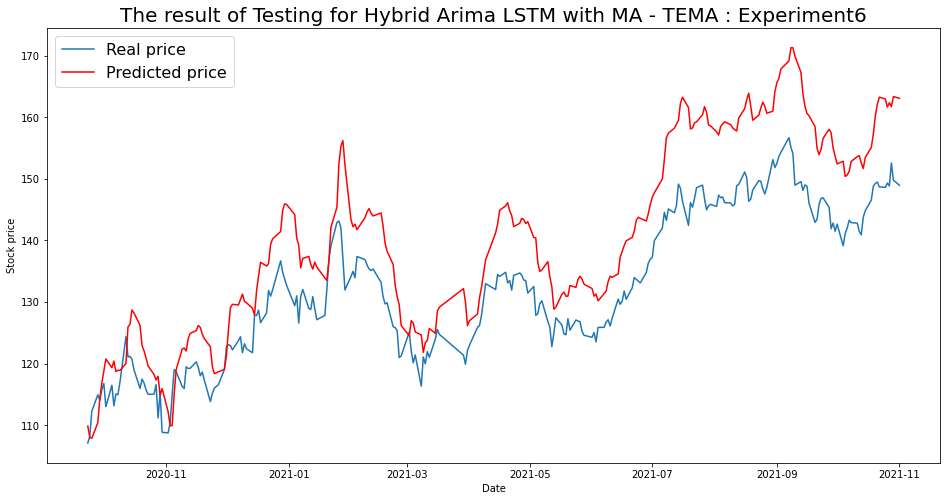

----- Test RMSE for TEMA----- 9.348062221629144
----- Test_MSE_LSTM for TEMA----- 87.38626729945001
----- Test_MAE_LSTM for TEMA----- 8.358174186376312


In [127]:
for i in range(len(list(simulation6.keys()))):
  SIM = list(simulation6.keys())[i]
  plot_train(simulation6,SIM)
  plot_test(simulation6,SIM)

## Arima w Exogenous Variable Multistep MutiVariate LSTM Hybrid Model Experiment 7

In [127]:
def get_arima_exog(dataframe,original_data, train_len, test_len):    
    

    # prepare train and test data for exogenous vr
    X_value = pd.DataFrame(low_vol.iloc[:, :])
    y_value = pd.DataFrame(low_vol.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    X_scale_dataset = X_scaler.fit_transform(X_value)
    y_scale_dataset = y_scaler.fit_transform(y_value)
    # Get data and check shape
    # X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X_scale_dataset)
    y_train, y_test, = split_train_test(y_scale_dataset)
    yc_train,yc_test = split_train_test(low_vol_data)
    yc = yc_test.values.tolist()
    y_train_list = y_train.flatten().tolist()
    y_test_list = y_test.flatten().tolist()
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

    # Initialize model
    model = auto_arima(y_train_list,exogenous  = X_train,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
            suppress_warnings=True,stepwise=True,seasonal=True)

      # Determine model parameters
    print(model.summary())
    model.fit(y_train_list,maxiter=200)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

      # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
        model = pmdarima.ARIMA(order=order)
        model.fit(y_train_list)
        # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')

        prediction.append(model.predict()[0])
        y_train_list.append(y_test_list[i])

    predictionte = y_scaler.inverse_transform(np.array(prediction).reshape(-1,1))
    y_test_ = y_scaler.inverse_transform(np.array(y_test_list).reshape(-1,1))

    # Generate error data
    mse = mean_squared_error(yc_test, predictionte)
    rmse = mse ** 0.5
    mae = mean_absolute_error(y_test_ , predictionte )
    return yc,predictionte.flatten().tolist(), mse, rmse, mae

In [128]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det =20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM7.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma+' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 3
    # define custom activation
    # 
    class Double_Tanh(Activation):
        def __init__(self, activation, **kwargs):
            super(Double_Tanh, self).__init__(activation, **kwargs)
            self.__name__ = 'double_tanh'

    def double_tanh(x):
        return (K.tanh(x) * 2)

    get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
        # Model Generation
    model = Sequential()
    #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    model.add(Dense(1))
    model.add(Activation(double_tanh))
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM7.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16989.787, Time=3.58 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14558.588, Time=5.63 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-14596.280, Time=5.74 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14556.588, Time=8.45 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16924.805, Time=10.66 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-14482.349, Time=11.42 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-17215.608, Time=20.46 sec
 ARIMA(0,3,3)(0,0,0)[0]             : AIC=-14552.588, Time=11.13 sec
 ARIMA(1,3,3)(0,0,0)[0]             : AIC=-15570.350, Time=19.72 sec
 ARIMA(0,3,2)(0,0,0)[0] intercept   : AIC=-11671.292, Time=28.32 sec

Best model:  ARIMA(0,3,2)(0,0,0)[0]          
T

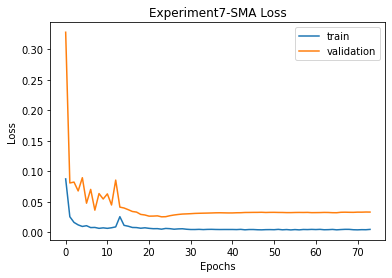


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 44.65212926265077 
RMSE:	 6.682224873696692 
MAPE:	 5.204686480071648
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16989.778, Time=3.80 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14558.587, Time=5.48 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15952.568, Time=15.31 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14556.587, Time=8.47 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16628.634, Time=10.28 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-16462.206, Time=25.09 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-16848.298, Time=13.32 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-17014.023, Time=6.57 sec
 ARIMA(3,3,0)(0,0,0)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16987.994, Time=4.01 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16982.667, Time=4.43 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 126.280 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.727
Date:                Sun, 12 Dec 2021   AIC                         -17071.454
Time:                        18:17:53   BIC                         -16911.966
Sample:                             0   HQIC                        -17010.204
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------

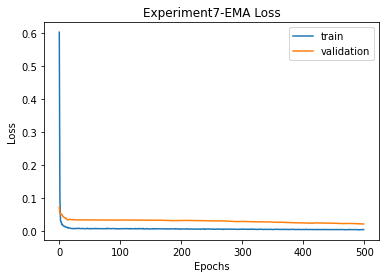


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 44.65212926265077 
RMSE:	 6.682224873696692 
MAPE:	 5.204686480071648

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 45.539825469272486 
RMSE:	 6.748320196113436 
MAPE:	 5.43245952292463
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16989.778, Time=3.53 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14558.587, Time=5.34 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-14597.576, Time=5.56 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14556.587, Time=8.44 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15338.693, Time=10.98 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-15153.472, Time=25.66 sec
 

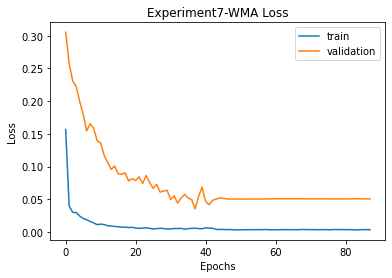


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 44.65212926265077 
RMSE:	 6.682224873696692 
MAPE:	 5.204686480071648

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 45.539825469272486 
RMSE:	 6.748320196113436 
MAPE:	 5.43245952292463

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 42.30488040231578 
RMSE:	 6.504220199402522 
MAPE:	 5.010195929360332
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16989.776, Time=3.29 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14558.586, Time=5.34 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16271.755, Time=7.16 sec
 ARIMA(0,3,1)(0,0,0)[0]           

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16987.981, Time=4.57 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16982.666, Time=4.55 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 114.014 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.727
Date:                Sun, 12 Dec 2021   AIC                         -17071.454
Time:                        18:36:11   BIC                         -16911.965
Sample:                             0   HQIC                        -17010.203
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------

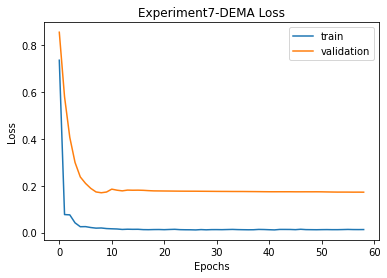


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 44.65212926265077 
RMSE:	 6.682224873696692 
MAPE:	 5.204686480071648

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 45.539825469272486 
RMSE:	 6.748320196113436 
MAPE:	 5.43245952292463

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 42.30488040231578 
RMSE:	 6.504220199402522 
MAPE:	 5.010195929360332

DEMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	54.48% Accuracy
MSE:	 23.305922116020078 
RMSE:	 4.827620751055335 
MAPE:	 3.7452201197397774
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16989.104, Time=3.79 sec
 ARIMA(0,

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/mlemodel.py:2968: RuntimeWarning: divide by zero encountered in true_divide
  return self.params / self.bse


ARIMA order: (2, 3, 0) 

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.45223, saving model to LSTM7.h5
45/45 - 3s - loss: 0.2336 - mse: 0.2336 - mae: 0.3737 - val_loss: 0.4522 - val_mse: 0.4522 - val_mae: 0.6470 - lr: 0.0010 - 3s/epoch - 62ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.45223 to 0.17852, saving model to LSTM7.h5
45/45 - 0s - loss: 0.0456 - mse: 0.0456 - mae: 0.1706 - val_loss: 0.1785 - val_mse: 0.1785 - val_mae: 0.3874 - lr: 0.0010 - 226ms/epoch - 5ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.17852 to 0.11256, saving model to LSTM7.h5
45/45 - 0s - loss: 0.0233 - mse: 0.0233 - mae: 0.1223 - val_loss: 0.1126 - val_mse: 0.1126 - val_mae: 0.2916 - lr: 0.0010 - 275ms/epoch - 6ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.11256 to 0.10893, saving model to LSTM7.h5
45/45 - 0s - loss: 0.0170 - mse: 0.0170 - mae: 0.1034 - val_loss: 0.1089 - val_mse: 0.1089 - val_mae: 0.2845 - lr: 0.0010 - 216ms/epoch - 5ms/step
Epoch 5/500

Epoc

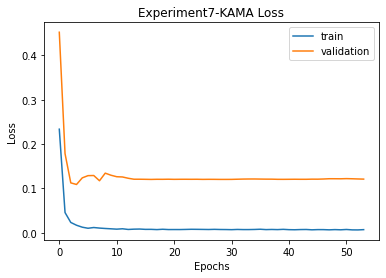


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 44.65212926265077 
RMSE:	 6.682224873696692 
MAPE:	 5.204686480071648

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 45.539825469272486 
RMSE:	 6.748320196113436 
MAPE:	 5.43245952292463

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 42.30488040231578 
RMSE:	 6.504220199402522 
MAPE:	 5.010195929360332

DEMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	54.48% Accuracy
MSE:	 23.305922116020078 
RMSE:	 4.827620751055335 
MAPE:	 3.7452201197397774

KAMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 18.082341646298453 
RMSE:	 4.252333670621163 
MAPE:	 3.4333194517527637
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MID

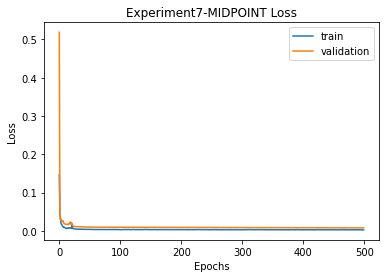


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 44.65212926265077 
RMSE:	 6.682224873696692 
MAPE:	 5.204686480071648

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 45.539825469272486 
RMSE:	 6.748320196113436 
MAPE:	 5.43245952292463

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 42.30488040231578 
RMSE:	 6.504220199402522 
MAPE:	 5.010195929360332

DEMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	54.48% Accuracy
MSE:	 23.305922116020078 
RMSE:	 4.827620751055335 
MAPE:	 3.7452201197397774

KAMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 18.082341646298453 
RMSE:	 4.252333670621163 
MAPE:	 3.4333194517527637

MIDPOINT
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 91.59813707600279 
RMSE:	 9.57069156727991 
MAPE:	 7.718313236319782
T3
T3([input_arrays], [timep

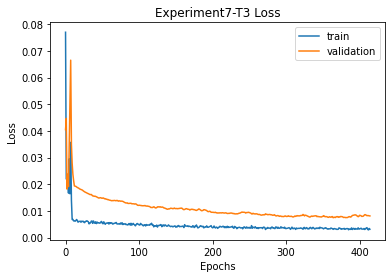


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 44.65212926265077 
RMSE:	 6.682224873696692 
MAPE:	 5.204686480071648

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 45.539825469272486 
RMSE:	 6.748320196113436 
MAPE:	 5.43245952292463

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 42.30488040231578 
RMSE:	 6.504220199402522 
MAPE:	 5.010195929360332

DEMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	54.48% Accuracy
MSE:	 23.305922116020078 
RMSE:	 4.827620751055335 
MAPE:	 3.7452201197397774

KAMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 18.082341646298453 
RMSE:	 4.252333670621163 
MAPE:	 3.4333194517527637

MIDPOINT
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 91.59813707600279 
RMSE:	 9.57069156727991 
MAPE:	 7.718313236319782

T3
Prediction vs Close:		55

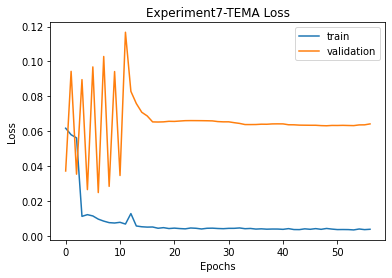


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 44.65212926265077 
RMSE:	 6.682224873696692 
MAPE:	 5.204686480071648

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 45.539825469272486 
RMSE:	 6.748320196113436 
MAPE:	 5.43245952292463

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 42.30488040231578 
RMSE:	 6.504220199402522 
MAPE:	 5.010195929360332

DEMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	54.48% Accuracy
MSE:	 23.305922116020078 
RMSE:	 4.827620751055335 
MAPE:	 3.7452201197397774

KAMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 18.082341646298453 
RMSE:	 4.252333670621163 
MAPE:	 3.4333194517527637

MIDPOINT
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 91.59813707600279 
RMSE:	 9.57069156727991 
MAPE:	 7.718313236319782

T3
Prediction vs Close:		55

In [129]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation7 = {}
    imgfile = 'Experiment7'
    for ma in optimized_period:
                print(ma)
                print(functions[ma])
                print ( int( optimized_period[ma]))
              # if ma == 'SMA':
                low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
                low_vol = low_vol.fillna(0)
                low_vol_data = df['close']
                high_vol = pd.DataFrame()
                df2 = df.copy()
                for i in df2.columns:
                  if i in low_vol.columns:
                    high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
                high_vol_data = df['close']
                ## *****************************************************
                # Generate ARIMA and LSTM predictions
                print('\nWorking on ' + ma + ' predictions')
                try:
                  print('parameters used : ', train_len, test_len)
                  low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima_exog(low_vol,low_vol_data, train_len, test_len)
                except:
                    print('ARIMA error, skipping to next MA type')
                    continue
                Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
                final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
                mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
                rmse_ftr = mse_ftr ** 0.5
                mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
                mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

                final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
                mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
                rmse = mse ** 0.5
                mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                # Generate prediction accuracy
                actual = df['close'].tail(test_len).values
                result_1 = []
                result_2 = []
                for i in range(1, len(final_prediction)):
                    # Compare prediction to previous close price
                    if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                        result_1.append(1)
                    elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                        result_1.append(1)
                    else:
                        result_1.append(0)

                    # Compare prediction to previous prediction
                    if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                        result_2.append(1)
                    elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                        result_2.append(1)
                    else:
                        result_2.append(0)

                accuracy_1 = np.mean(result_1)
                accuracy_2 = np.mean(result_2)

                simulation7[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                              'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                  'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                              'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                  'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                              'rmse': rmse_ftr, 'mae' : mae_ftr},
                                  'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                            'rmse': rmse, 'mae': mae },
                                  'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

                # save simulation data here as checkpoint
                with open('simulation7_data.json', 'w') as fp:
                    json.dump(simulation7, fp)

                for ma in simulation7.keys():
                    print('\n' + ma)
                    print('Prediction vs Close:\t\t' + str(round(100*simulation7[ma]['accuracy']['prediction vs close'], 2))
                          + '% Accuracy')
                    print('Prediction vs Prediction:\t' + str(round(100*simulation7[ma]['accuracy']['prediction vs prediction'], 2))
                          + '% Accuracy')
                    print('MSE:\t', simulation7[ma]['final']['mse'],
                          '\nRMSE:\t', simulation7[ma]['final']['rmse'],
                          '\nMAPE:\t', simulation7[ma]['final']['mae'])#,
                          # '\nMAPE:\t', simulation[ma]['final']['mape'])
              # else:
              #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [130]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment7.png to Experiment7 (1).png


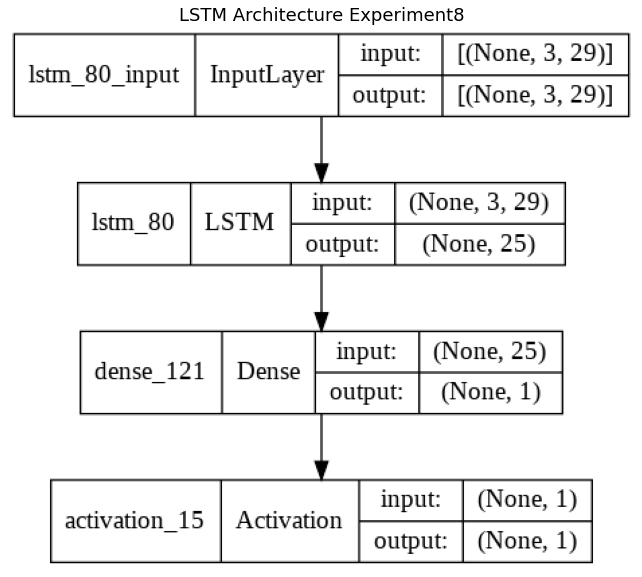

In [139]:
img = cv2.imread('Experiment7.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [128]:
with open('simulation7_data.json') as json_file:
    simulation7 = json.load(json_file)
fileimg = 'Experiment7'

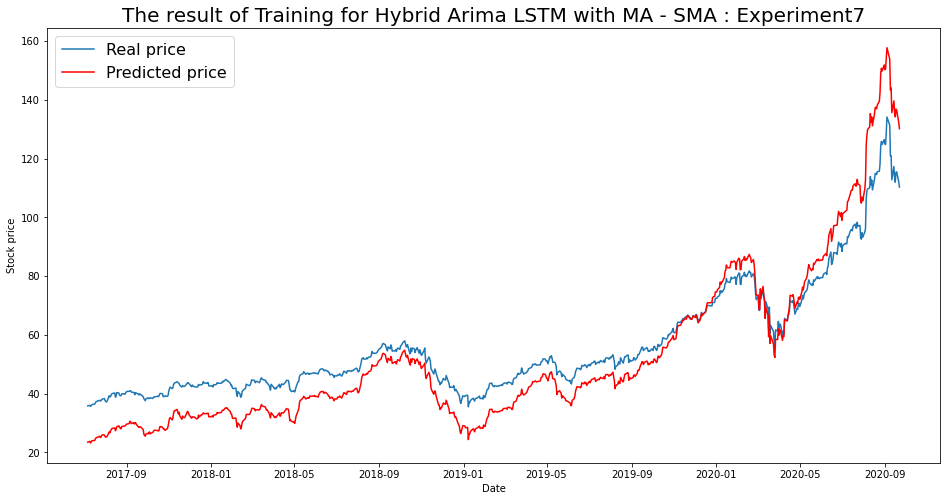

----- Train RMSE for SMA ----- 9.009338337956548
----- Train_MSE_LSTM for SMA ----- 81.16817728777366
----- Train MAE LSTM for SMA ----- 7.791349936760778


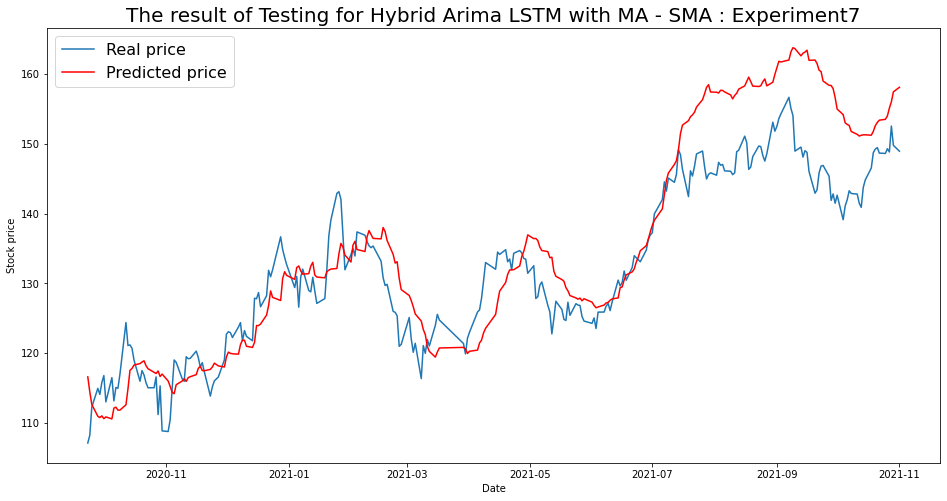

----- Test RMSE for SMA----- 6.682224873696692
----- Test_MSE_LSTM for SMA----- 44.65212926265077
----- Test_MAE_LSTM for SMA----- 5.204686480071648


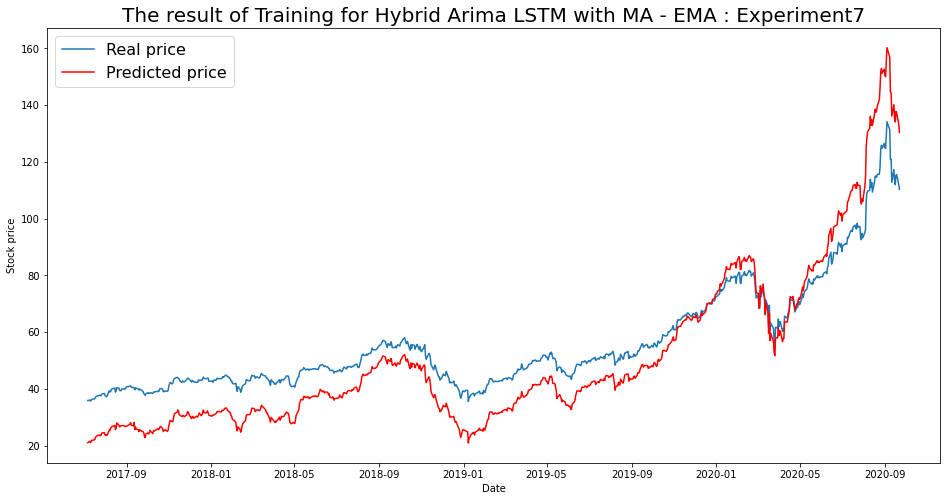

----- Train RMSE for EMA ----- 10.75589930055345
----- Train_MSE_LSTM for EMA ----- 115.68936976364621
----- Train MAE LSTM for EMA ----- 9.582493831136144


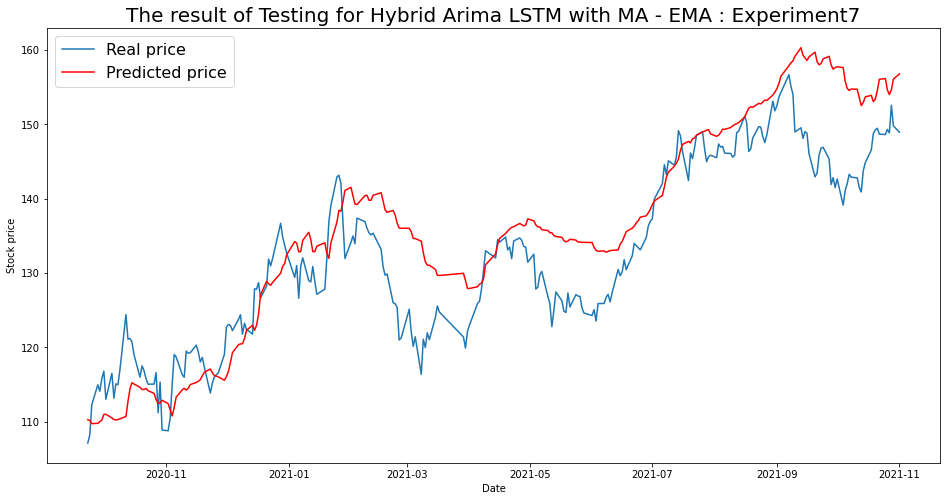

----- Test RMSE for EMA----- 6.748320196113436
----- Test_MSE_LSTM for EMA----- 45.539825469272486
----- Test_MAE_LSTM for EMA----- 5.43245952292463


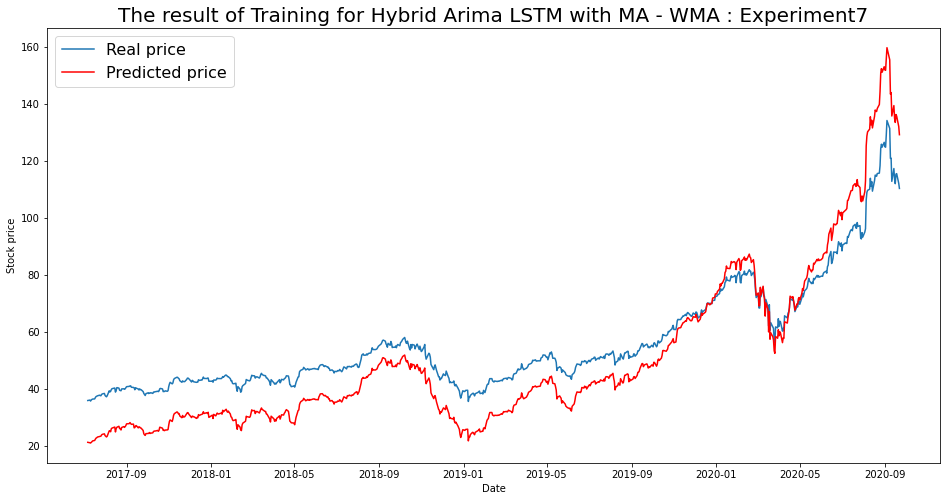

----- Train RMSE for WMA ----- 10.908509232790552
----- Train_MSE_LSTM for WMA ----- 118.9955736818767
----- Train MAE LSTM for WMA ----- 9.800814582394565


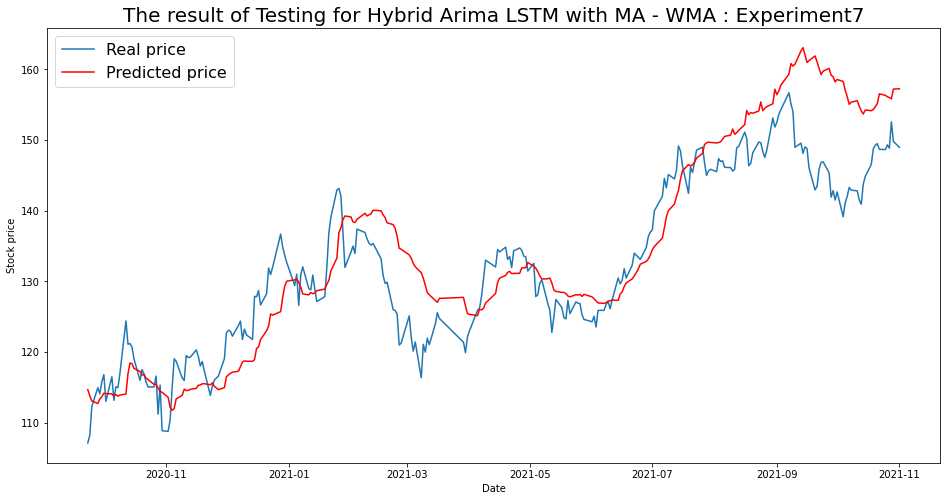

----- Test RMSE for WMA----- 6.504220199402522
----- Test_MSE_LSTM for WMA----- 42.30488040231578
----- Test_MAE_LSTM for WMA----- 5.010195929360332


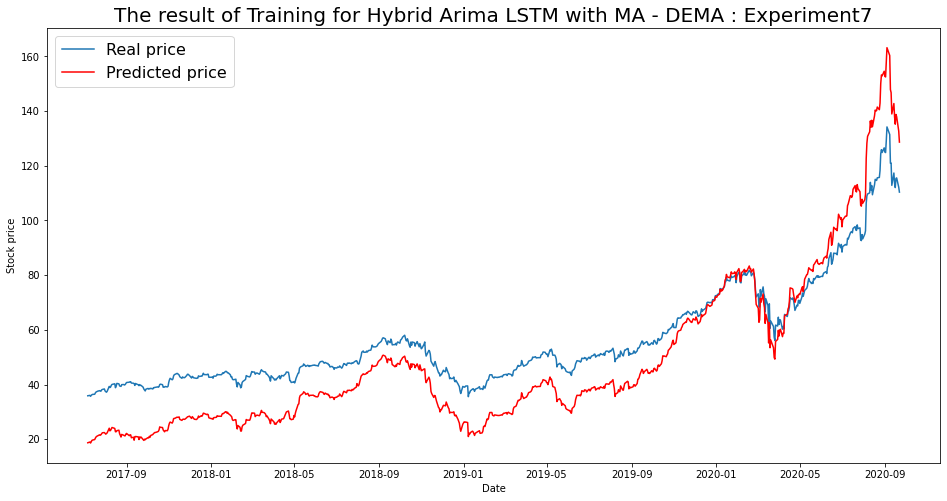

----- Train RMSE for DEMA ----- 12.643440847440496
----- Train_MSE_LSTM for DEMA ----- 159.85659646272686
----- Train MAE LSTM for DEMA ----- 11.36962745253845


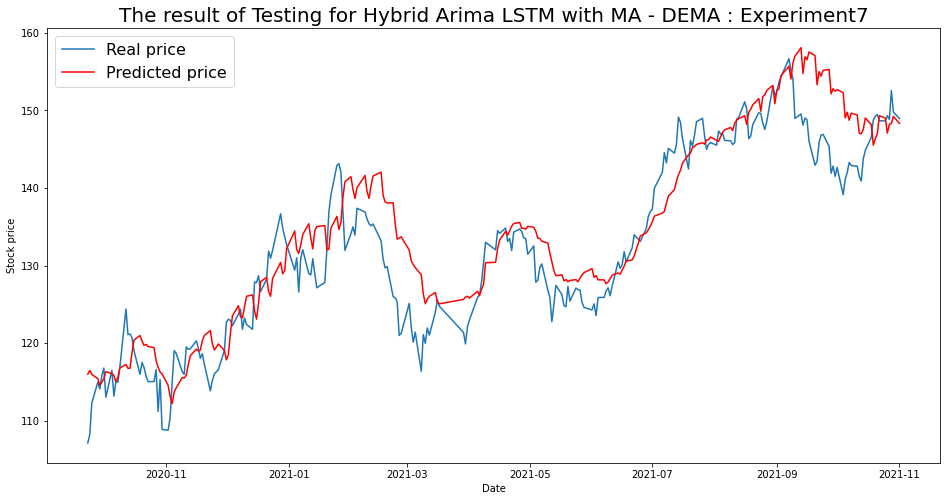

----- Test RMSE for DEMA----- 4.827620751055335
----- Test_MSE_LSTM for DEMA----- 23.305922116020078
----- Test_MAE_LSTM for DEMA----- 3.7452201197397774


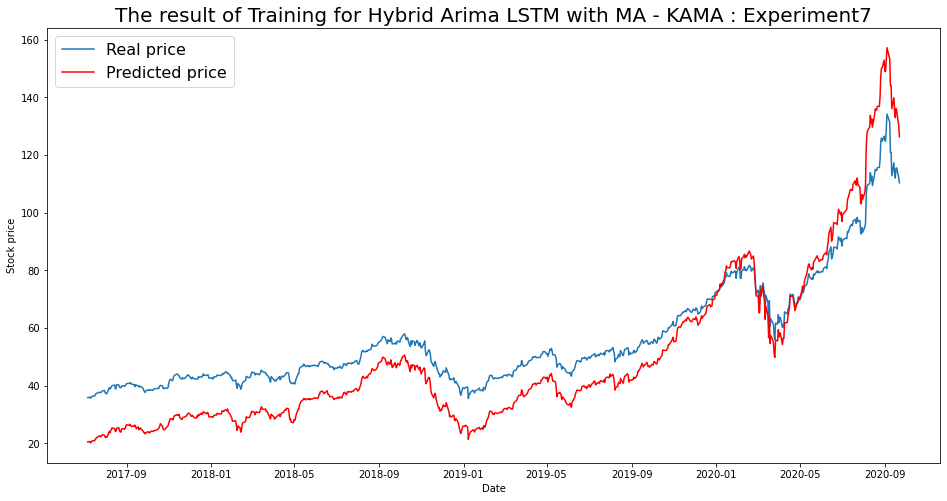

----- Train RMSE for KAMA ----- 11.147835109393704
----- Train_MSE_LSTM for KAMA ----- 124.27422762623091
----- Train MAE LSTM for KAMA ----- 10.178621601225753


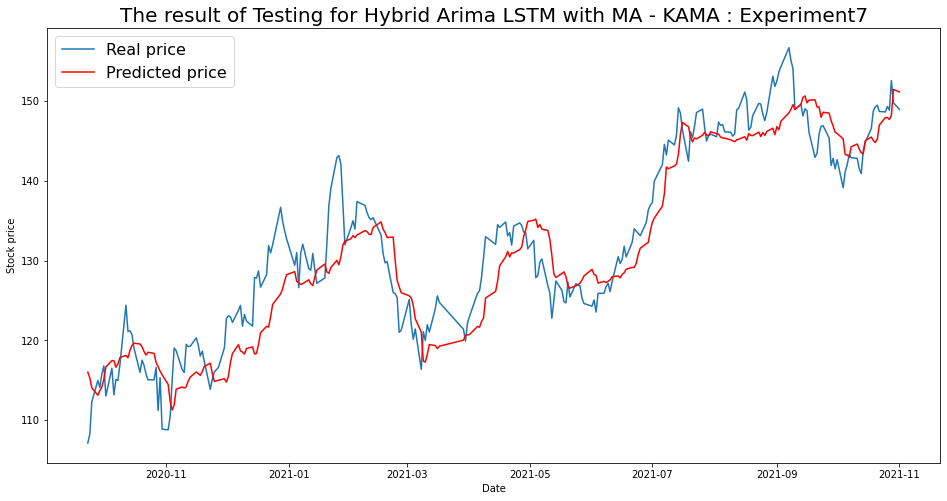

----- Test RMSE for KAMA----- 4.252333670621163
----- Test_MSE_LSTM for KAMA----- 18.082341646298453
----- Test_MAE_LSTM for KAMA----- 3.4333194517527637


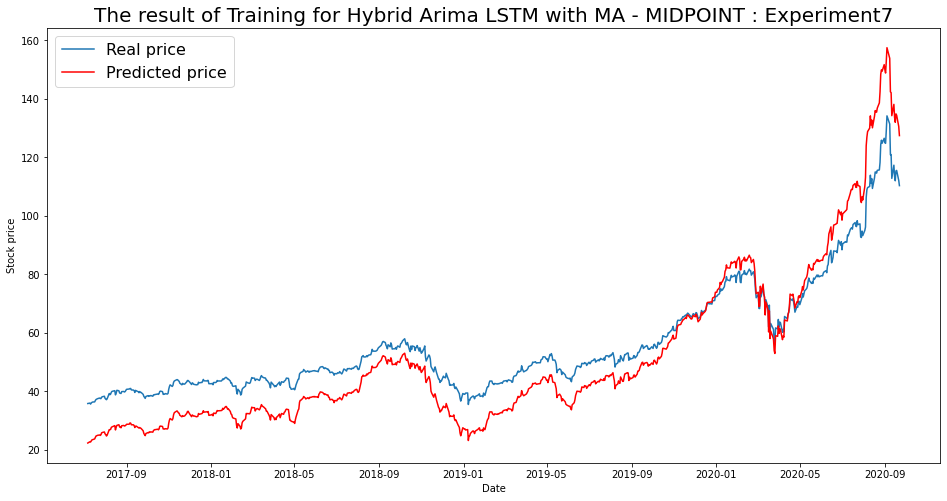

----- Train RMSE for MIDPOINT ----- 9.563103791664194
----- Train_MSE_LSTM for MIDPOINT ----- 91.45295413014207
----- Train MAE LSTM for MIDPOINT ----- 8.50176313593246


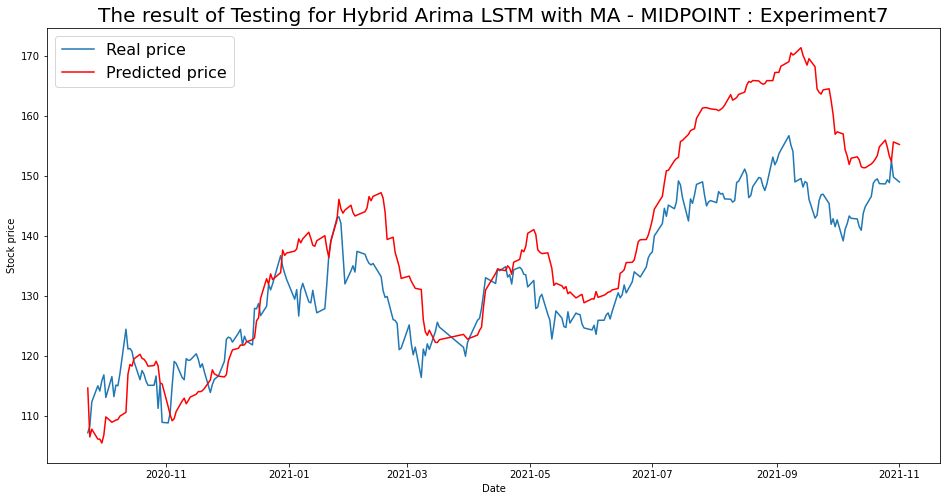

----- Test RMSE for MIDPOINT----- 9.57069156727991
----- Test_MSE_LSTM for MIDPOINT----- 91.59813707600279
----- Test_MAE_LSTM for MIDPOINT----- 7.718313236319782


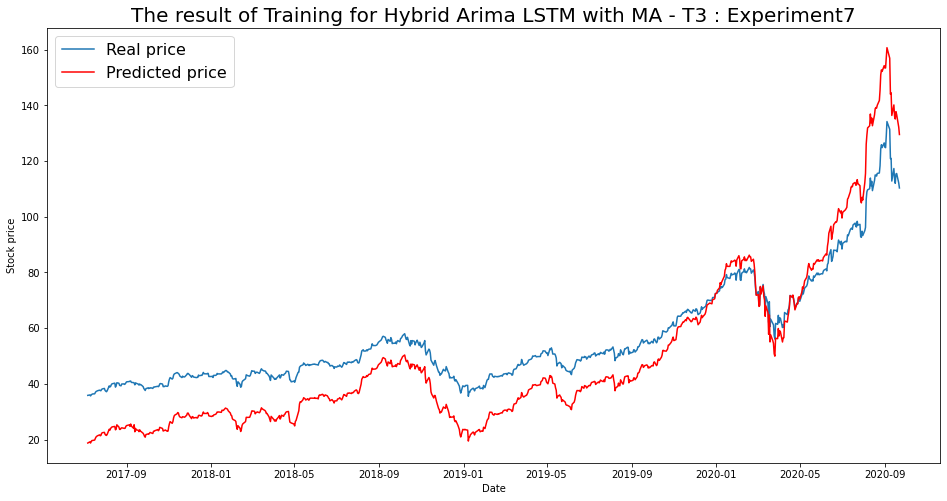

----- Train RMSE for T3 ----- 12.352918439245476
----- Train_MSE_LSTM for T3 ----- 152.5945939666509
----- Train MAE LSTM for T3 ----- 11.209855832067309


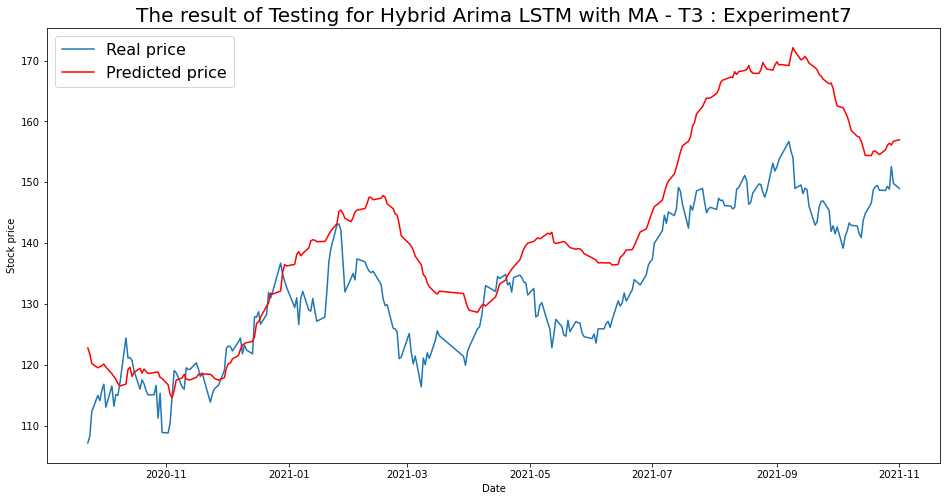

----- Test RMSE for T3----- 12.049604131049065
----- Test_MSE_LSTM for T3----- 145.19295971499469
----- Test_MAE_LSTM for T3----- 9.875885491811884


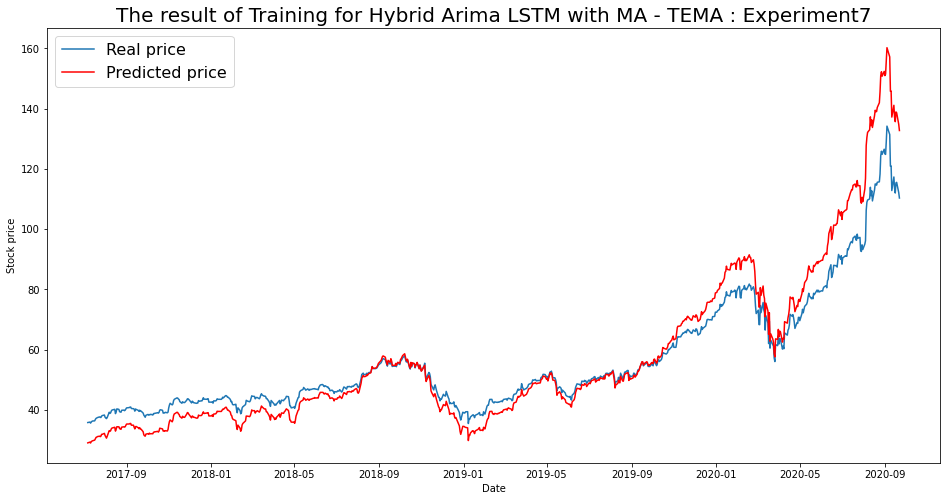

----- Train RMSE for TEMA ----- 7.436400272753141
----- Train_MSE_LSTM for TEMA ----- 55.30004901660298
----- Train MAE LSTM for TEMA ----- 5.158390050894572


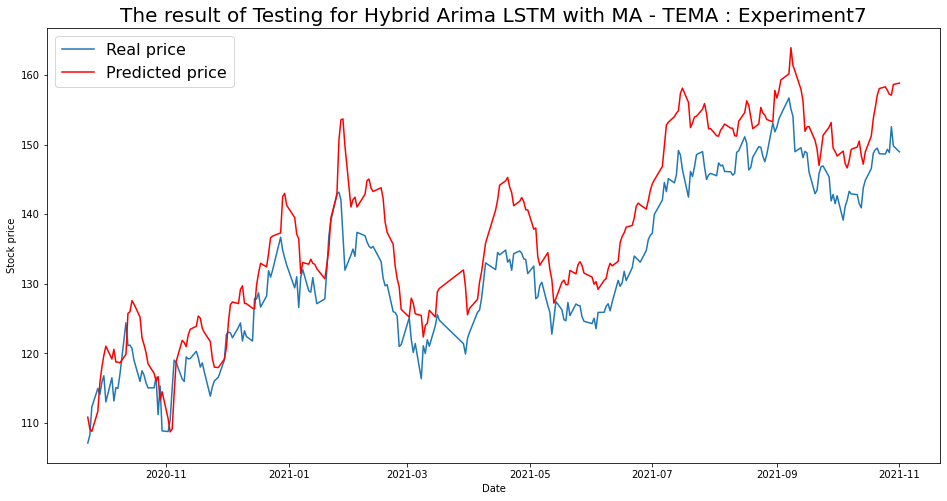

----- Test RMSE for TEMA----- 6.412164328109044
----- Test_MSE_LSTM for TEMA----- 41.1158513706741
----- Test_MAE_LSTM for TEMA----- 5.720374187090847


In [129]:
for i in range(len(list(simulation7.keys()))):
  SIM = list(simulation7.keys())[i]
  plot_train(simulation7,SIM)
  plot_test(simulation7,SIM)

## Arima w Exogenous Variable Multistep MutiVariate LSTM Hybrid Model Experiment 8

In [133]:
def get_arima_exog(dataframe,original_data, train_len, test_len):    
    

    # prepare train and test data for exogenous vr
    X_value = pd.DataFrame(low_vol.iloc[:, :])
    y_value = pd.DataFrame(low_vol.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    X_scale_dataset = X_scaler.fit_transform(X_value)
    y_scale_dataset = y_scaler.fit_transform(y_value)
    # Get data and check shape
    # X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X_scale_dataset)
    y_train, y_test, = split_train_test(y_scale_dataset)
    yc_train,yc_test = split_train_test(low_vol_data)
    yc = yc_test.values.tolist()
    y_train_list = y_train.flatten().tolist()
    y_test_list = y_test.flatten().tolist()
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

    # Initialize model
    model = auto_arima(y_train_list,exogenous  = X_train,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
            suppress_warnings=True,stepwise=True,seasonal=True)

      # Determine model parameters
    print(model.summary())
    model.fit(y_train_list,maxiter=200)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

      # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
        model = pmdarima.ARIMA(order=order)
        model.fit(y_train_list)
        # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')

        prediction.append(model.predict()[0])
        y_train_list.append(y_test_list[i])

    predictionte = y_scaler.inverse_transform(np.array(prediction).reshape(-1,1))
    y_test_ = y_scaler.inverse_transform(np.array(y_test_list).reshape(-1,1))

    # Generate error data
    mse = mean_squared_error(yc_test, predictionte)
    rmse = mse ** 0.5
    mae = mean_absolute_error(y_test_ , predictionte )
    return yc,predictionte.flatten().tolist(), mse, rmse, mae

In [134]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det =20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM7.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma+' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 3
    # define custom activation
    # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM7.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma+' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # #Option 4
    # # Set up & fit LSTM RNN
    model = Sequential()
    model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(input_dim, feature_size)))
    model.add(LSTM(units=int(lstm_len/2)))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='mean_squared_error', optimizer='adam')
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM8.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16989.787, Time=3.71 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14558.588, Time=5.64 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-14596.280, Time=5.73 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14556.588, Time=8.68 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16924.805, Time=10.33 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-14482.349, Time=11.41 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-17215.608, Time=21.10 sec
 ARIMA(0,3,3)(0,0,0)[0]             : AIC=-14552.588, Time=10.18 sec
 ARIMA(1,3,3)(0,0,0)[0]             : AIC=-15570.350, Time=18.92 sec
 ARIMA(0,3,2)(0,0,0)[0] intercept   : AIC=-11671.292, Time=28.02 sec

Best model:  ARIMA(0,3,2)(0,0,0)[0]          
T

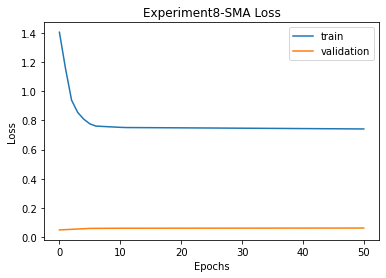


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 30.79397335917816 
RMSE:	 5.549231780992587 
MAPE:	 4.345848876898189
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16989.778, Time=3.50 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14558.587, Time=5.43 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15952.568, Time=15.01 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14556.587, Time=7.85 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16628.634, Time=10.96 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-16462.206, Time=24.67 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-16848.298, Time=13.03 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-17014.023, Time=6.75 sec
 ARIMA(3,3,0)(0,0,0)[

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16987.994, Time=3.95 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16982.667, Time=4.79 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 125.840 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.727
Date:                Sun, 12 Dec 2021   AIC                         -17071.454
Time:                        19:21:56   BIC                         -16911.966
Sample:                             0   HQIC                        -17010.204
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------

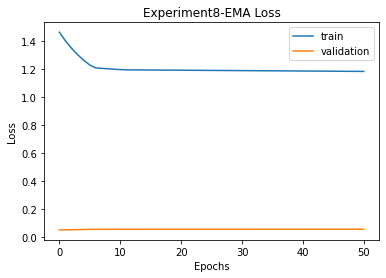


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 30.79397335917816 
RMSE:	 5.549231780992587 
MAPE:	 4.345848876898189

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 32.37277762407691 
RMSE:	 5.689708043834667 
MAPE:	 4.4297291061987245
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16989.778, Time=3.35 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14558.587, Time=5.41 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-14597.576, Time=5.52 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14556.587, Time=7.97 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15338.693, Time=10.63 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-15153.472, Time=26.39 sec


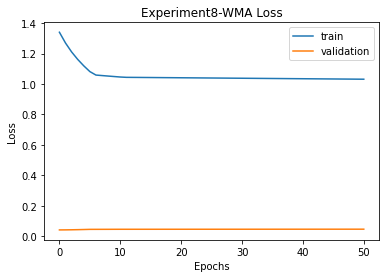


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 30.79397335917816 
RMSE:	 5.549231780992587 
MAPE:	 4.345848876898189

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 32.37277762407691 
RMSE:	 5.689708043834667 
MAPE:	 4.4297291061987245

WMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 58.067607397948805 
RMSE:	 7.620210456276704 
MAPE:	 6.244282675104111
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16989.776, Time=3.39 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14558.586, Time=5.37 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16271.755, Time=7.19 sec
 ARIMA(0,3,1)(0,0,0)[0]         

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16987.981, Time=4.26 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16982.666, Time=4.59 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 114.053 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.727
Date:                Sun, 12 Dec 2021   AIC                         -17071.454
Time:                        19:39:03   BIC                         -16911.965
Sample:                             0   HQIC                        -17010.203
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------

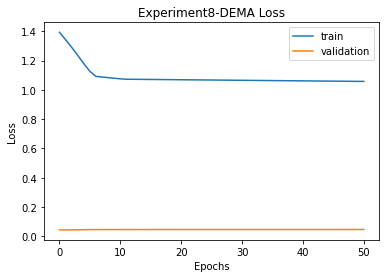


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 30.79397335917816 
RMSE:	 5.549231780992587 
MAPE:	 4.345848876898189

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 32.37277762407691 
RMSE:	 5.689708043834667 
MAPE:	 4.4297291061987245

WMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 58.067607397948805 
RMSE:	 7.620210456276704 
MAPE:	 6.244282675104111

DEMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 166.4719121939062 
RMSE:	 12.902399474280209 
MAPE:	 11.649540302125361
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16989.104, Time=3.73 sec
 ARIMA(

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/mlemodel.py:2968: RuntimeWarning: divide by zero encountered in true_divide
  return self.params / self.bse


ARIMA order: (2, 3, 0) 

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.05134, saving model to LSTM8.h5
45/45 - 4s - loss: 1.4205 - val_loss: 0.0513 - lr: 0.0010 - 4s/epoch - 80ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.05134
45/45 - 0s - loss: 1.3224 - val_loss: 0.0543 - lr: 0.0010 - 239ms/epoch - 5ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.05134
45/45 - 0s - loss: 1.2059 - val_loss: 0.0581 - lr: 0.0010 - 231ms/epoch - 5ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.05134
45/45 - 0s - loss: 1.0884 - val_loss: 0.0630 - lr: 0.0010 - 254ms/epoch - 6ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.05134
45/45 - 0s - loss: 0.9954 - val_loss: 0.0687 - lr: 0.0010 - 258ms/epoch - 6ms/step
Epoch 6/500

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 00006: val_loss did not improve from 0.05134
45/45 - 0s - loss: 0.9266 - val_loss: 0.0749 - lr: 0.0010 - 251ms/epoc

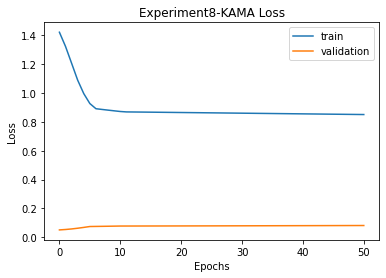


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 30.79397335917816 
RMSE:	 5.549231780992587 
MAPE:	 4.345848876898189

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 32.37277762407691 
RMSE:	 5.689708043834667 
MAPE:	 4.4297291061987245

WMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 58.067607397948805 
RMSE:	 7.620210456276704 
MAPE:	 6.244282675104111

DEMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 166.4719121939062 
RMSE:	 12.902399474280209 
MAPE:	 11.649540302125361

KAMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 17.81489427298047 
RMSE:	 4.220769393485087 
MAPE:	 3.4008273908825086
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MID

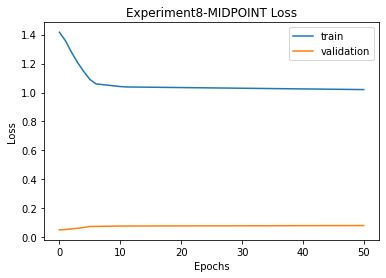


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 30.79397335917816 
RMSE:	 5.549231780992587 
MAPE:	 4.345848876898189

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 32.37277762407691 
RMSE:	 5.689708043834667 
MAPE:	 4.4297291061987245

WMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 58.067607397948805 
RMSE:	 7.620210456276704 
MAPE:	 6.244282675104111

DEMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 166.4719121939062 
RMSE:	 12.902399474280209 
MAPE:	 11.649540302125361

KAMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 17.81489427298047 
RMSE:	 4.220769393485087 
MAPE:	 3.4008273908825086

MIDPOINT
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 18.523766068694844 
RMSE:	 4.303924496165662 
MAPE:	 3.4879205441290337
T3
T3([input_arrays], [ti

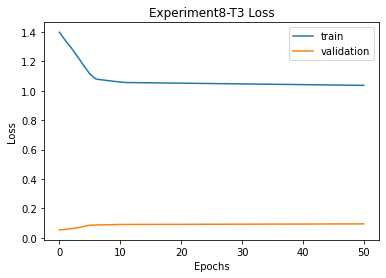


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 30.79397335917816 
RMSE:	 5.549231780992587 
MAPE:	 4.345848876898189

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 32.37277762407691 
RMSE:	 5.689708043834667 
MAPE:	 4.4297291061987245

WMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 58.067607397948805 
RMSE:	 7.620210456276704 
MAPE:	 6.244282675104111

DEMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 166.4719121939062 
RMSE:	 12.902399474280209 
MAPE:	 11.649540302125361

KAMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 17.81489427298047 
RMSE:	 4.220769393485087 
MAPE:	 3.4008273908825086

MIDPOINT
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 18.523766068694844 
RMSE:	 4.303924496165662 
MAPE:	 3.4879205441290337

T3
Prediction vs Close:	

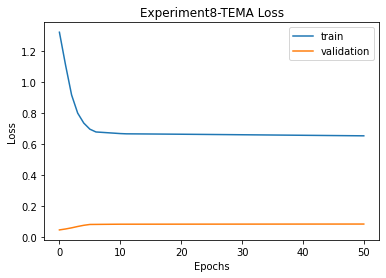


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 30.79397335917816 
RMSE:	 5.549231780992587 
MAPE:	 4.345848876898189

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 32.37277762407691 
RMSE:	 5.689708043834667 
MAPE:	 4.4297291061987245

WMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 58.067607397948805 
RMSE:	 7.620210456276704 
MAPE:	 6.244282675104111

DEMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 166.4719121939062 
RMSE:	 12.902399474280209 
MAPE:	 11.649540302125361

KAMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 17.81489427298047 
RMSE:	 4.220769393485087 
MAPE:	 3.4008273908825086

MIDPOINT
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 18.523766068694844 
RMSE:	 4.303924496165662 
MAPE:	 3.4879205441290337

T3
Prediction vs Close:	

In [135]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation8 = {}
    imgfile = 'Experiment8'
    for ma in optimized_period:
                print(ma)
                print(functions[ma])
                print ( int( optimized_period[ma]))
              # if ma == 'SMA':
                low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
                low_vol = low_vol.fillna(0)
                low_vol_data = df['close']
                high_vol = pd.DataFrame()
                df2 = df.copy()
                for i in df2.columns:
                  if i in low_vol.columns:
                    high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
                high_vol_data = df['close']
                ## *****************************************************
                # Generate ARIMA and LSTM predictions
                print('\nWorking on ' + ma + ' predictions')
                try:
                  print('parameters used : ', train_len, test_len)
                  low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima_exog(low_vol,low_vol_data, train_len, test_len)
                except:
                    print('ARIMA error, skipping to next MA type')
                    continue
                Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
                final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
                mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
                rmse_ftr = mse_ftr ** 0.5
                mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
                mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

                final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
                mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
                rmse = mse ** 0.5
                mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                # Generate prediction accuracy
                actual = df['close'].tail(test_len).values
                result_1 = []
                result_2 = []
                for i in range(1, len(final_prediction)):
                    # Compare prediction to previous close price
                    if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                        result_1.append(1)
                    elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                        result_1.append(1)
                    else:
                        result_1.append(0)

                    # Compare prediction to previous prediction
                    if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                        result_2.append(1)
                    elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                        result_2.append(1)
                    else:
                        result_2.append(0)

                accuracy_1 = np.mean(result_1)
                accuracy_2 = np.mean(result_2)

                simulation8[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                              'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                  'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                              'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                  'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                              'rmse': rmse_ftr, 'mae' : mae_ftr},
                                  'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                            'rmse': rmse, 'mae': mae },
                                  'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

                # save simulation data here as checkpoint
                with open('simulation8_data.json', 'w') as fp:
                    json.dump(simulation8, fp)

                for ma in simulation8.keys():
                    print('\n' + ma)
                    print('Prediction vs Close:\t\t' + str(round(100*simulation8[ma]['accuracy']['prediction vs close'], 2))
                          + '% Accuracy')
                    print('Prediction vs Prediction:\t' + str(round(100*simulation8[ma]['accuracy']['prediction vs prediction'], 2))
                          + '% Accuracy')
                    print('MSE:\t', simulation8[ma]['final']['mse'],
                          '\nRMSE:\t', simulation8[ma]['final']['rmse'],
                          '\nMAPE:\t', simulation8[ma]['final']['mae'])#,
                          # '\nMAPE:\t', simulation[ma]['final']['mape'])
              # else:
              #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [136]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment8.png to Experiment8 (1).png


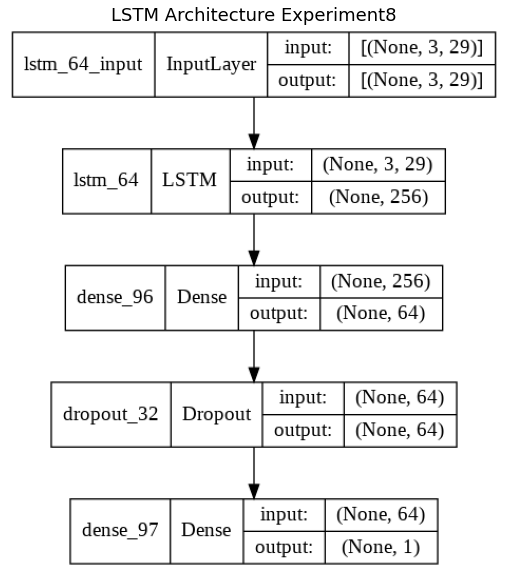

In [137]:
img = cv2.imread('Experiment8.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [132]:
with open('simulation8_data.json') as json_file:
    simulation8 = json.load(json_file)
fileimg = 'Experiment8'

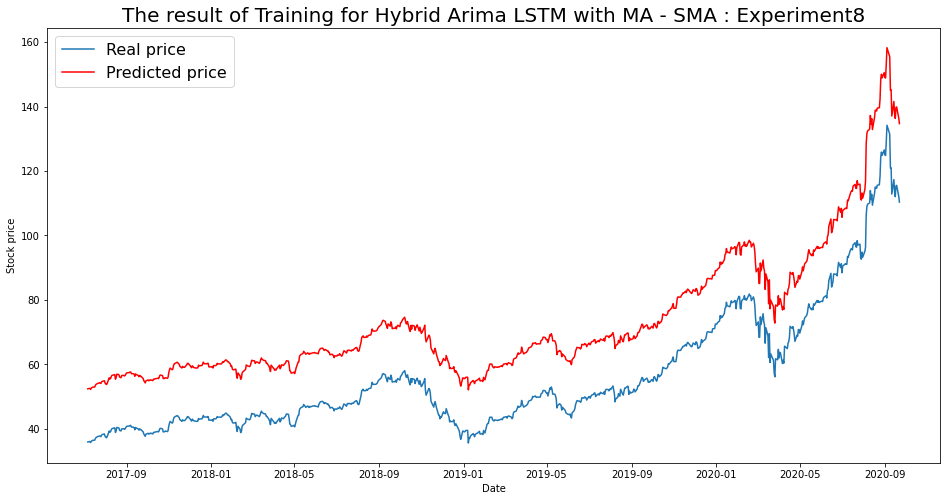

----- Train RMSE for SMA ----- 16.984837129738686
----- Train_MSE_LSTM for SMA ----- 288.48469232374987
----- Train MAE LSTM for SMA ----- 16.91967470811145


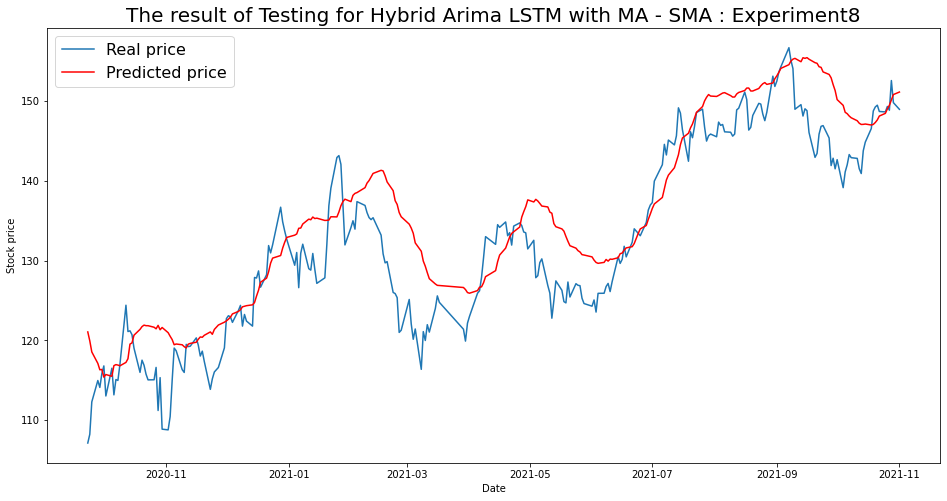

----- Test RMSE for SMA----- 5.549231780992587
----- Test_MSE_LSTM for SMA----- 30.79397335917816
----- Test_MAE_LSTM for SMA----- 4.345848876898189


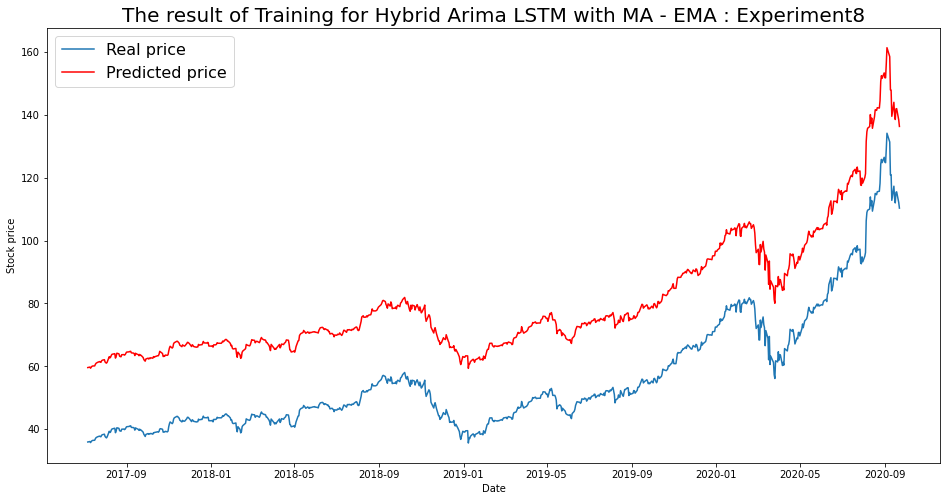

----- Train RMSE for EMA ----- 24.064453268878548
----- Train_MSE_LSTM for EMA ----- 579.0979111300394
----- Train MAE LSTM for EMA ----- 24.05741292651337


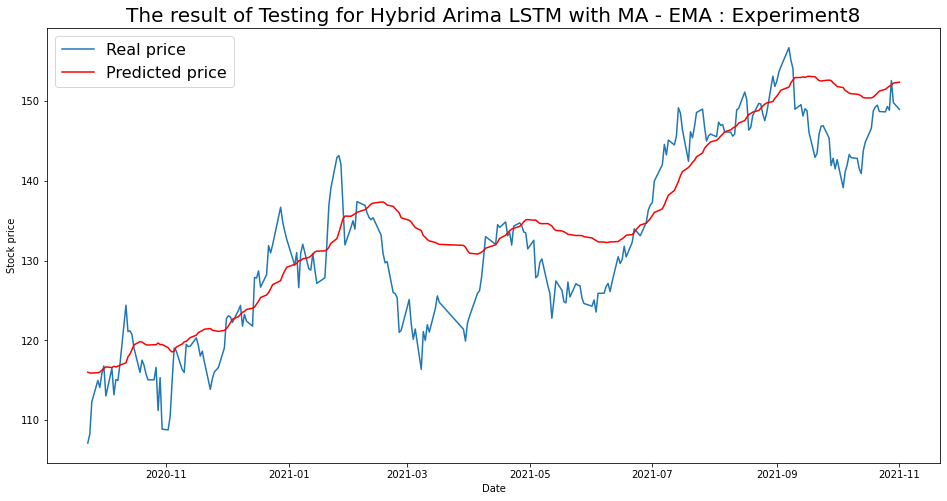

----- Test RMSE for EMA----- 5.689708043834667
----- Test_MSE_LSTM for EMA----- 32.37277762407691
----- Test_MAE_LSTM for EMA----- 4.4297291061987245


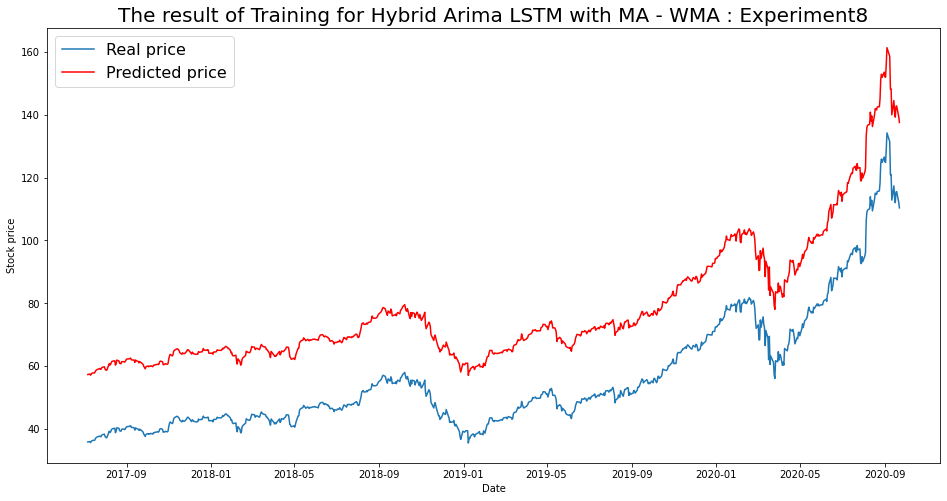

----- Train RMSE for WMA ----- 21.99024849687679
----- Train_MSE_LSTM for WMA ----- 483.571028954392
----- Train MAE LSTM for WMA ----- 21.95148728153493


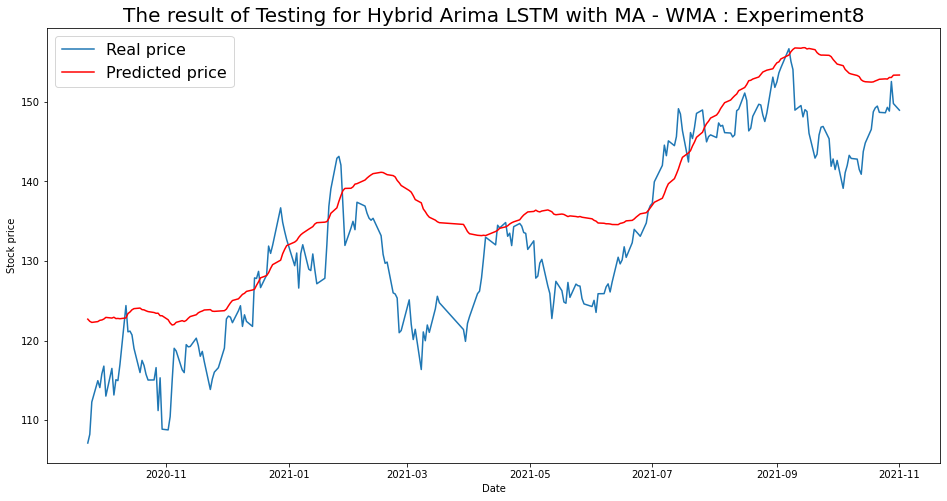

----- Test RMSE for WMA----- 7.620210456276704
----- Test_MSE_LSTM for WMA----- 58.067607397948805
----- Test_MAE_LSTM for WMA----- 6.244282675104111


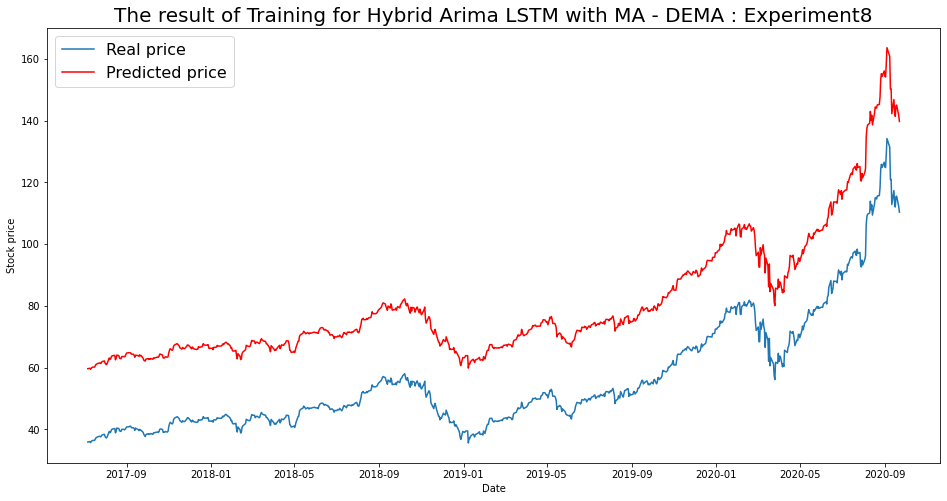

----- Train RMSE for DEMA ----- 24.365605462542323
----- Train_MSE_LSTM for DEMA ----- 593.6827295562723
----- Train MAE LSTM for DEMA ----- 24.332061871443646


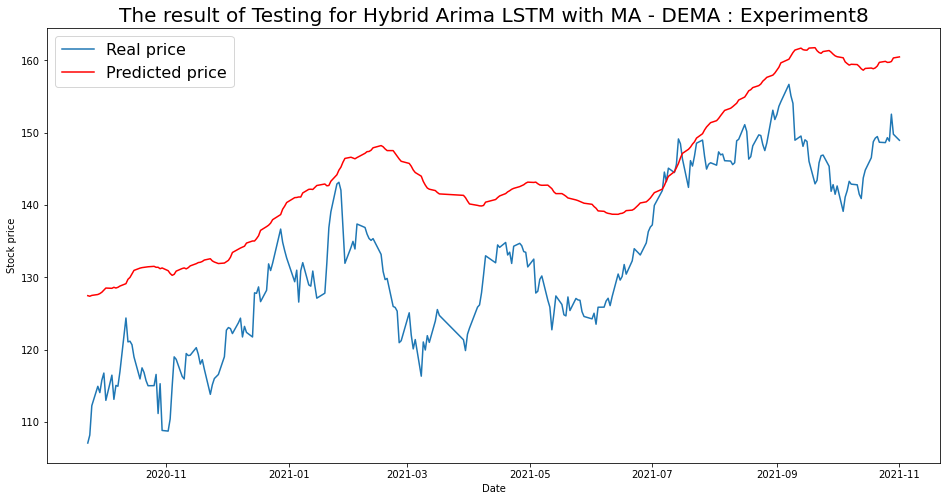

----- Test RMSE for DEMA----- 12.902399474280209
----- Test_MSE_LSTM for DEMA----- 166.4719121939062
----- Test_MAE_LSTM for DEMA----- 11.649540302125361


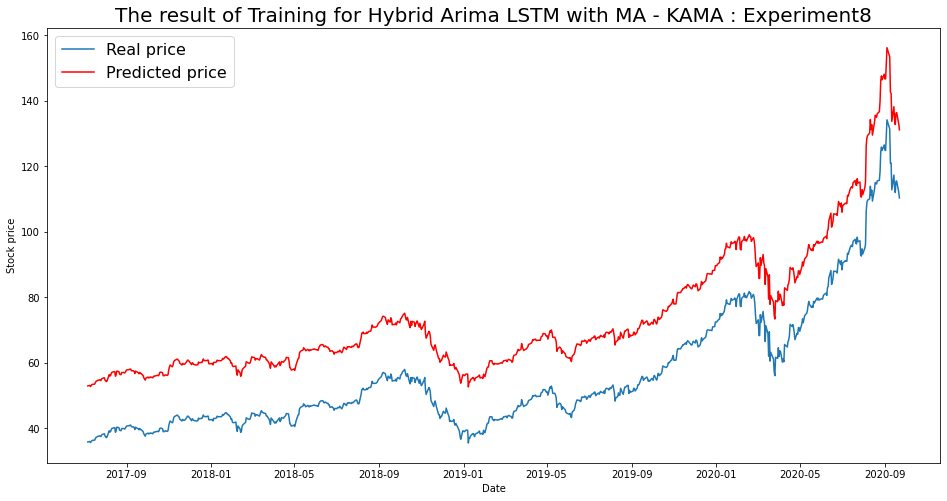

----- Train RMSE for KAMA ----- 17.353875298772294
----- Train_MSE_LSTM for KAMA ----- 301.1569878853392
----- Train MAE LSTM for KAMA ----- 17.33646524542629


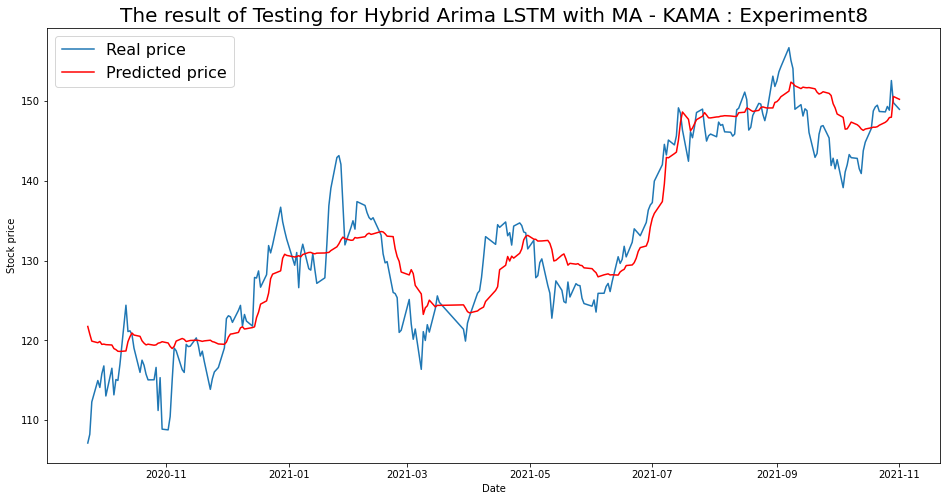

----- Test RMSE for KAMA----- 4.220769393485087
----- Test_MSE_LSTM for KAMA----- 17.81489427298047
----- Test_MAE_LSTM for KAMA----- 3.4008273908825086


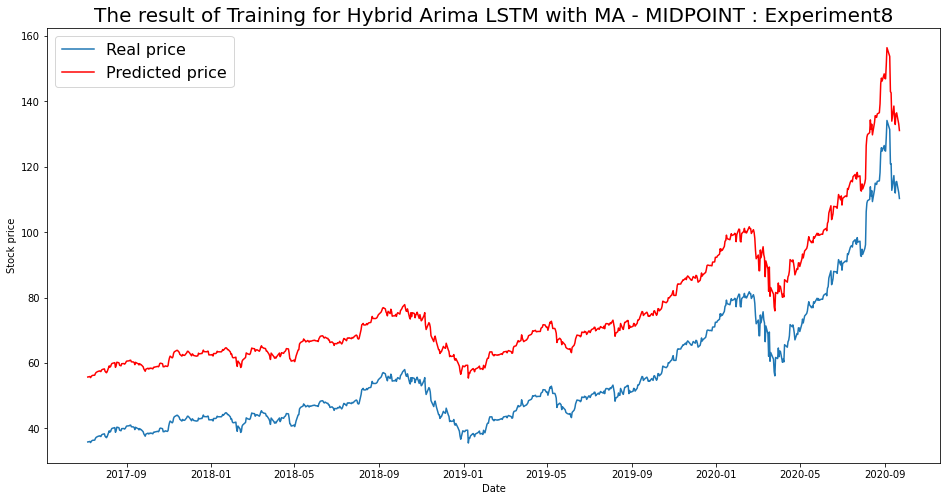

----- Train RMSE for MIDPOINT ----- 19.91769524640393
----- Train_MSE_LSTM for MIDPOINT ----- 396.7145839286217
----- Train MAE LSTM for MIDPOINT ----- 19.915788006074358


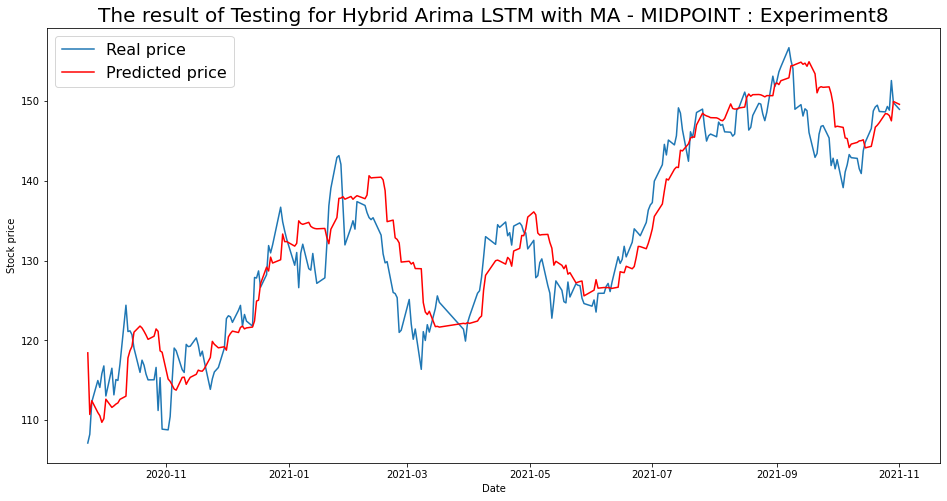

----- Test RMSE for MIDPOINT----- 4.303924496165662
----- Test_MSE_LSTM for MIDPOINT----- 18.523766068694844
----- Test_MAE_LSTM for MIDPOINT----- 3.4879205441290337


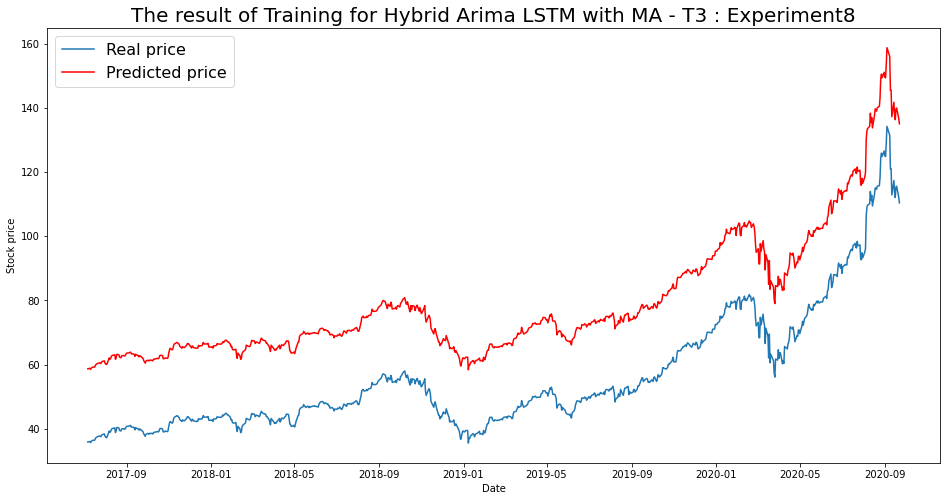

----- Train RMSE for T3 ----- 22.915612404801223
----- Train_MSE_LSTM for T3 ----- 525.1252918870797
----- Train MAE LSTM for T3 ----- 22.913270100508587


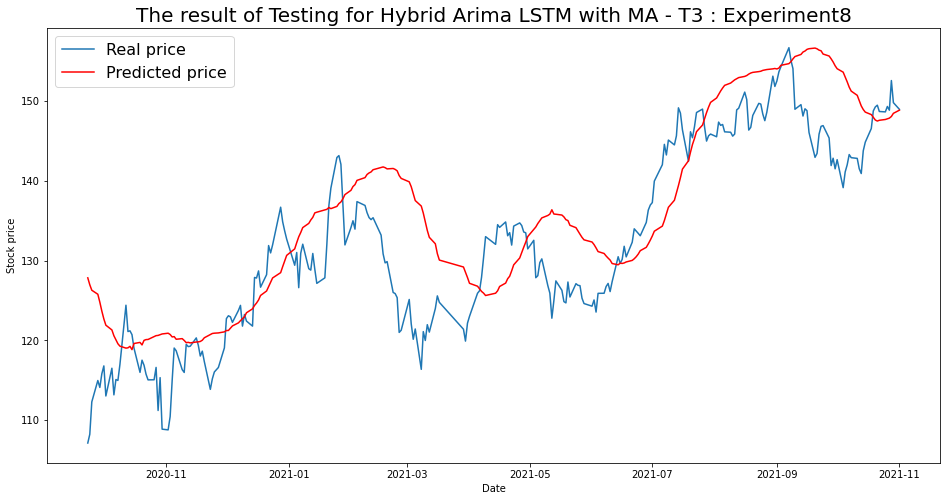

----- Test RMSE for T3----- 7.193936632248893
----- Test_MSE_LSTM for T3----- 51.75272426881254
----- Test_MAE_LSTM for T3----- 5.759673530885367


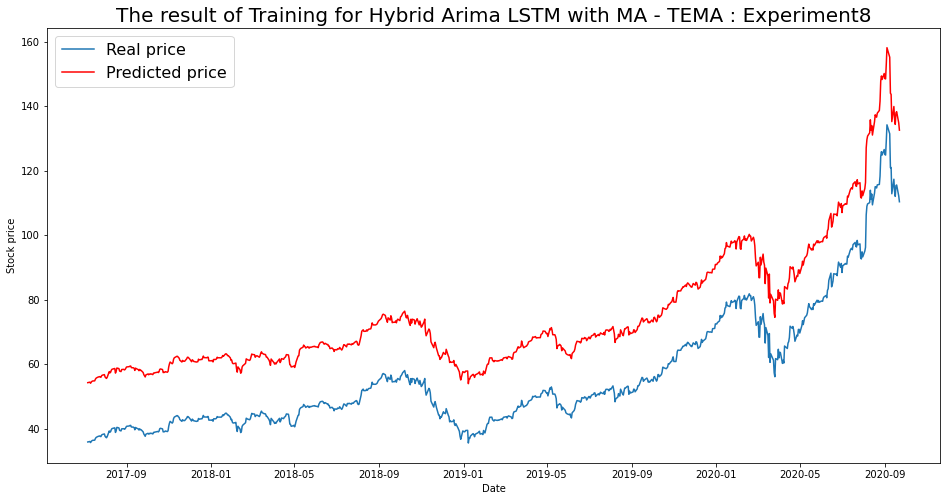

----- Train RMSE for TEMA ----- 18.607130117898784
----- Train_MSE_LSTM for TEMA ----- 346.22529122441597
----- Train MAE LSTM for TEMA ----- 18.587996395507663


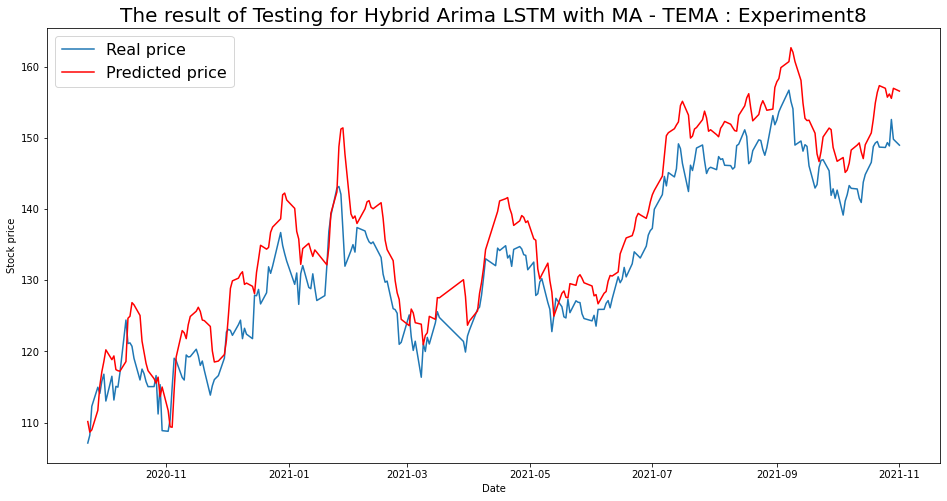

----- Test RMSE for TEMA----- 5.331498398524327
----- Test_MSE_LSTM for TEMA----- 28.424875173467463
----- Test_MAE_LSTM for TEMA----- 4.66633698560039


In [133]:
for i in range(len(list(simulation8.keys()))):
  SIM = list(simulation8.keys())[i]
  plot_train(simulation8,SIM)
  plot_test(simulation8,SIM)

## List of RMSE, MSE & MAE scores for Test data

In [138]:
import json
with open('simulation1_data.json') as json_file:
    simulation1 = json.load(json_file)

with open('simulation2_data.json') as json_file:
    simulation2 = json.load(json_file)

with open('simulation3_data.json') as json_file:
    simulation3 = json.load(json_file)

with open('simulation4_data.json') as json_file:
    simulation4 = json.load(json_file)

with open('simulation5_data.json') as json_file:
    simulation5 = json.load(json_file)

with open('simulation6_data.json') as json_file:
    simulation6 = json.load(json_file)

with open('simulation7_data.json') as json_file:
    simulation7 = json.load(json_file)

with open('simulation8_data.json') as json_file:
    simulation8 = json.load(json_file)

In [140]:
text = 'Stock with Full dataset'
simulations = [simulation1,simulation2,simulation3,simulation4,simulation5,simulation6,simulation7,simulation8]
for i,simulation in enumerate(simulations):
  for ma in simulation.keys():
    print(text+'Experiment ',i+1,' for MA :',ma,'the MSE  is: ',simulation[ma]['final']['mse'])
    print(text+'Experiment ',i+1,' for MA :',ma,'the RMSE is: ',simulation[ma]['final']['rmse'])
    print(text+'Experiment ',i+1,' for MA :',ma,'the MAE is: ',simulation[ma]['final']['mae'])

Stock with Full datasetExperiment  1  for MA : SMA the MSE  is:  29.509403666146007
Stock with Full datasetExperiment  1  for MA : SMA the RMSE is:  5.432255854260365
Stock with Full datasetExperiment  1  for MA : SMA the MAE is:  4.5288133477558885
Stock with Full datasetExperiment  1  for MA : EMA the MSE  is:  28.603272766421263
Stock with Full datasetExperiment  1  for MA : EMA the RMSE is:  5.348202760406646
Stock with Full datasetExperiment  1  for MA : EMA the MAE is:  4.3952252144553965
Stock with Full datasetExperiment  1  for MA : WMA the MSE  is:  80.72598349686672
Stock with Full datasetExperiment  1  for MA : WMA the RMSE is:  8.9847639644493
Stock with Full datasetExperiment  1  for MA : WMA the MAE is:  7.266216353433966
Stock with Full datasetExperiment  1  for MA : DEMA the MSE  is:  74.8946292448382
Stock with Full datasetExperiment  1  for MA : DEMA the RMSE is:  8.654168316183721
Stock with Full datasetExperiment  1  for MA : DEMA the MAE is:  7.175854729849037
Stoc

In [141]:
text = 'Stock with Full dataset '
simulations = [simulation1,simulation2,simulation3,simulation4,simulation5,simulation6,simulation7,simulation8]
for i,simulation in enumerate(simulations):
  for ma in simulation.keys():
    # print(text+'Experiment ',i+1,' for MA :',ma,'the MSE  is: ',simulation[ma]['final']['mse'])
    print(text+'Experiment ',i+1,' for MA :',ma,'the RMSE is: ',simulation[ma]['final']['rmse'])
    # print(text+'Experiment ',i+1,' for MA :',ma,'the MAE is: ',simulation[ma]['final']['mae'])
  for ma in simulation.keys():
    print(text+'Experiment ',i+1,' for MA :',ma,'the MSE  is: ',simulation[ma]['final']['mse'])
    # print(text+'Experiment ',i+1,' for MA :',ma,'the RMSE is: ',simulation[ma]['final']['rmse'])
    # print(text+'Experiment ',i+1,' for MA :',ma,'the MAE is: ',simulation[ma]['final']['mae'])
  for ma in simulation.keys():
    # print(text+'Experiment ',i+1,' for MA :',ma,'the MSE  is: ',simulation[ma]['final']['mse'])
    # print(text+'Experiment ',i+1,' for MA :',ma,'the RMSE is: ',simulation[ma]['final']['rmse'])
    print(text+'Experiment ',i+1,' for MA :',ma,'the MAE is: ',simulation[ma]['final']['mae'])

Stock with Full dataset Experiment  1  for MA : SMA the RMSE is:  5.432255854260365
Stock with Full dataset Experiment  1  for MA : EMA the RMSE is:  5.348202760406646
Stock with Full dataset Experiment  1  for MA : WMA the RMSE is:  8.9847639644493
Stock with Full dataset Experiment  1  for MA : DEMA the RMSE is:  8.654168316183721
Stock with Full dataset Experiment  1  for MA : KAMA the RMSE is:  4.87546037487117
Stock with Full dataset Experiment  1  for MA : MIDPOINT the RMSE is:  7.318272153983071
Stock with Full dataset Experiment  1  for MA : T3 the RMSE is:  6.640488797834165
Stock with Full dataset Experiment  1  for MA : TEMA the RMSE is:  3.0926372716336124
Stock with Full dataset Experiment  1  for MA : SMA the MSE  is:  29.509403666146007
Stock with Full dataset Experiment  1  for MA : EMA the MSE  is:  28.603272766421263
Stock with Full dataset Experiment  1  for MA : WMA the MSE  is:  80.72598349686672
Stock with Full dataset Experiment  1  for MA : DEMA the MSE  is:  74

## Export HTML

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [135]:
cd ..

/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction/Archana - LSTM Hybrid


In [ ]:
cd drive/MyDrive/Stock price prediction/Archana - LSTM Hybrid

In [137]:
%%shell
jupyter nbconvert --to html LSTM_Hybrid_using_TA_LIB_Fulldata.ipynb

[NbConvertApp] Converting notebook LSTM_Hybrid_using_TA_LIB_Fulldata.ipynb to html
[NbConvertApp] ERROR | Notebook JSON is invalid: Additional properties are not allowed (u'metadata' was unexpected)

Failed validating u'additionalProperties' in stream:

On instance[u'cells'][123][u'outputs'][0]:
{u'metadata': {u'tags': None},
 u'name': u'stdout',
 u'output_type': u'stream',
 u'text': u"SMA\nSMA([input_arrays], [timeperiod=30])\n\nSimple Moving Average (Overlap Studies)\n\nInputs:\n    price: (any ndarray)\nParameters:\n    timeperiod: 30\nOutputs:\n    real\n17\n\nWorking on SMA predictions\nparameters used :  808 269\nPerforming stepwise search to minimize aic\n ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16989.787, Time=3.85 sec\n ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14558.588, Time=5.46 sec\n ARIMA(1,3,0)(0,0,0)[0]             : AIC=-14596.280, Time=5.73 sec\n ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14556.588, Time=8.46 sec\n ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16924.805,